# PRML Course Project: Music Genre Classification
### By --Kartik Choudhary [B20CS025] --Vinayak Verma [B20EE079]

Importing Libraries

In [137]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn
import librosa
import librosa.display
import librosa.display as lpt
import IPython.display as ipd
import warnings
warnings.filterwarnings('ignore')
import os
import scipy
from ggplot import *
from playsound import playsound
from tqdm import tqdm
import pickle
import sys
import IPython
import tensorflow as tf
from tensorflow import keras
from keras.models import Sequential
from IPython.display import Audio
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import normalize
from sklearn.feature_selection import RFECV,mutual_info_regression
from sklearn.metrics import confusion_matrix, accuracy_score,classification_report
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.decomposition import PCA
from xgboost import XGBClassifier
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe
import copy
import random
from sklearn import preprocessing
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.svm import SVC
from keras.layers import Dense,Activation,Dropout
from keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import Sequential
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import KFold
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from xgboost import XGBRFClassifier
from xgboost import plot_tree, plot_importance
from keras.models import Sequential
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve
from sklearn.feature_selection import RFE
import sklearn.metrics as skm
import sklearn.model_selection as skms
seed = 12
np.random.seed(seed)
from sklearn.metrics.pairwise import cosine_similarity


## Exploring Audio Data

In [2]:
# Sample rate
sr = 45600

# Normalize function for Spectral rolloff
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

# Start and End for Zero Crossing-Rate
start = 1000
end = 1200

In [3]:
blues_sample = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data/genres_original/blues/blues.00000.wav'
classical_sample = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data/genres_original/classical/classical.00000.wav'
country_sample = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data/genres_original/country/country.00000.wav'
disco_sample = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data/genres_original/disco/disco.00000.wav'
hipHop_sample = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data/genres_original/hiphop/hiphop.00000.wav'
jazz_sample = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data/genres_original/jazz/jazz.00000.wav'
metal_sample = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data/genres_original/metal/metal.00000.wav'
pop_sample = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data/genres_original/pop/pop.00000.wav'
raggae_sample = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data/genres_original/reggae/reggae.00000.wav'
rock_sample = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data/genres_original/rock/rock.00000.wav'

Load one song from each genre

In [4]:
# BLUES
data_blues, sr = librosa.load(blues_sample, sr=sr)
    # CLASSICAL
data_classical, sr = librosa.load(classical_sample, sr=sr)
    # COUNTRY
data_country, sr = librosa.load(country_sample, sr=sr)
    # DISCO
data_disco, sr = librosa.load(disco_sample, sr=sr)
    # HIP HOP
data_hipHop, sr = librosa.load(hipHop_sample, sr=sr)
    # JAZZ
data_jazz, sr = librosa.load(jazz_sample, sr=sr)
    # METAL
data_metal, sr = librosa.load(metal_sample, sr=sr)
    # POP
data_pop, sr = librosa.load(pop_sample, sr=sr)
    # RAGGAE
data_raggae, sr = librosa.load(raggae_sample, sr=sr)
    # ROCK
data_rock, sr = librosa.load(rock_sample, sr=sr)

songs = {
    'BLUES': data_blues,
    'CLASSICAL': data_classical,
    'COUNTRY': data_country,
    'DISCO': data_disco,
    'HIP HOP': data_hipHop,
    'JAZZ': data_jazz,
    'METAL': data_metal,
    'POP': data_pop,
    'RAGGAE': data_raggae,
    'ROCK': data_rock
}

Visulizing audio files

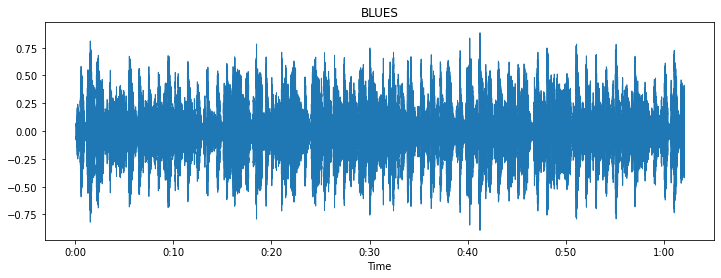

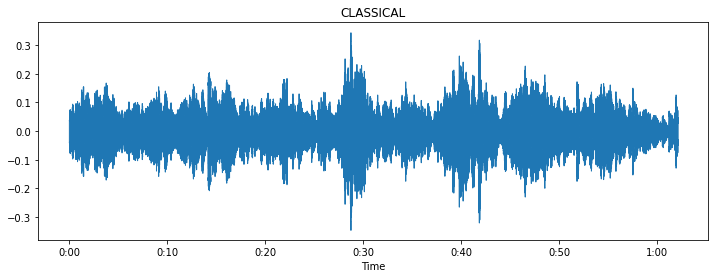

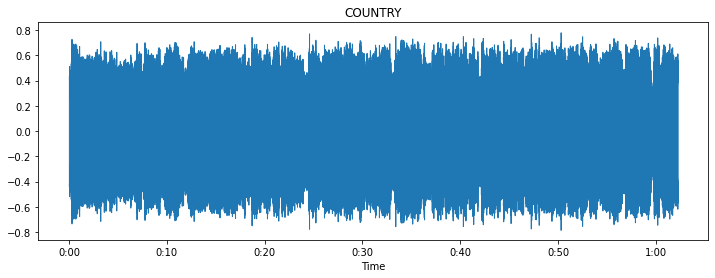

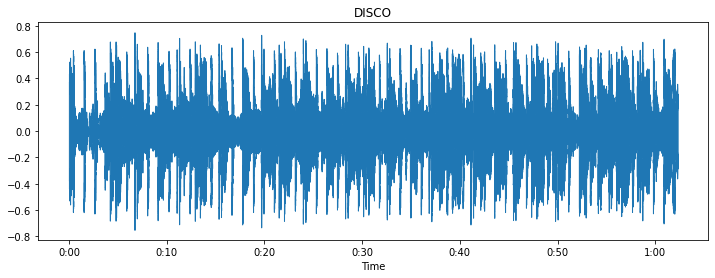

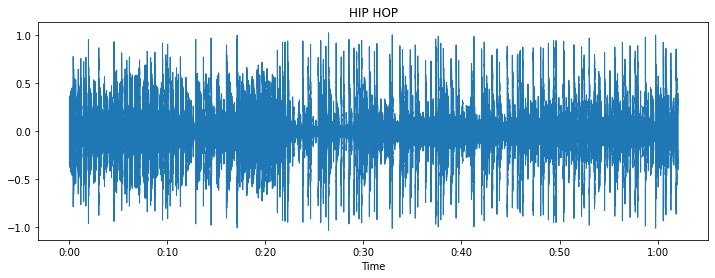

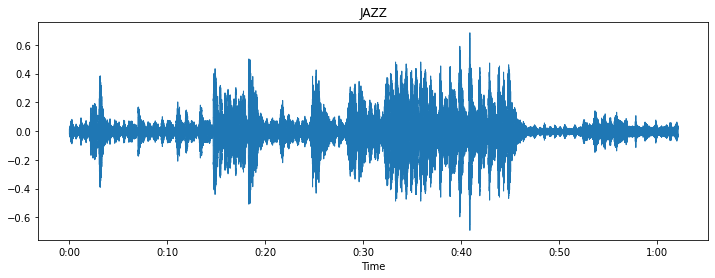

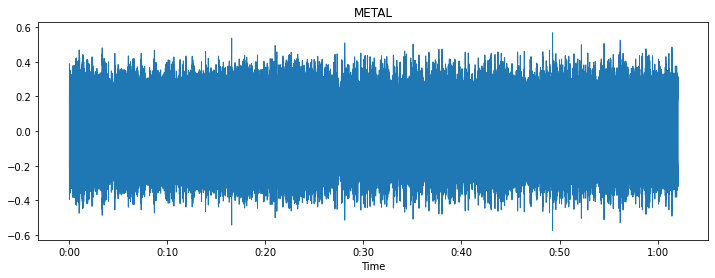

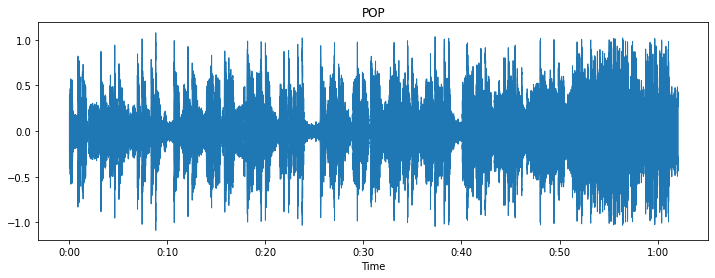

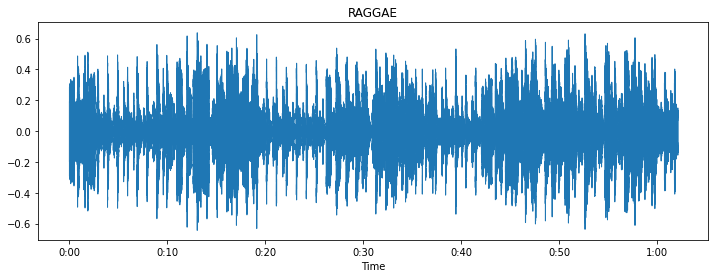

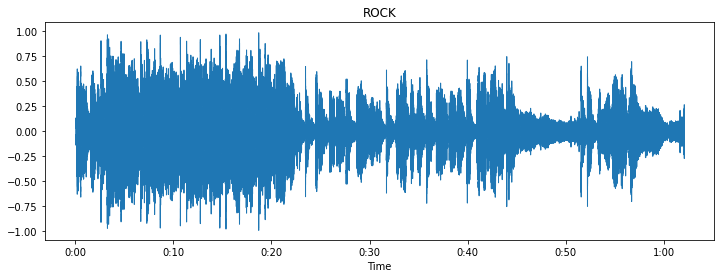

In [6]:
for genre, song in songs.items():
    plt.figure(figsize=(12, 4))
    lpt.waveshow(song)
    plt.title(genre)

Spectrograms
* Normal spectrograms

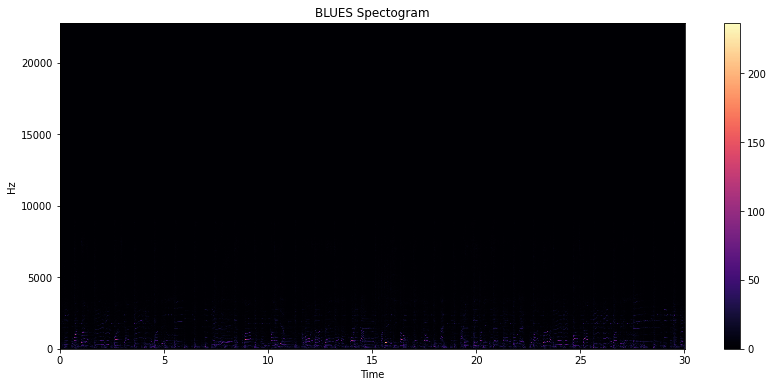

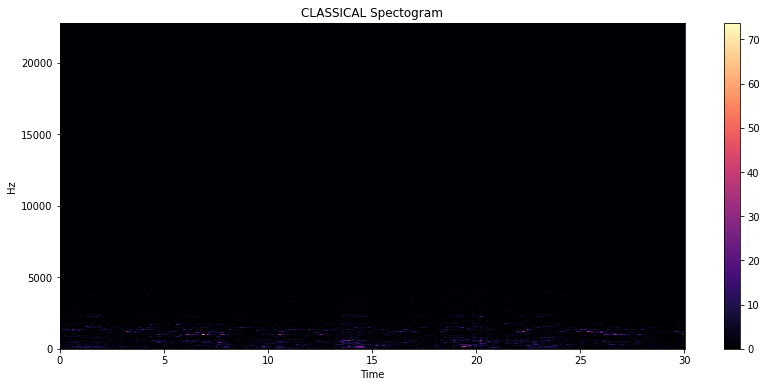

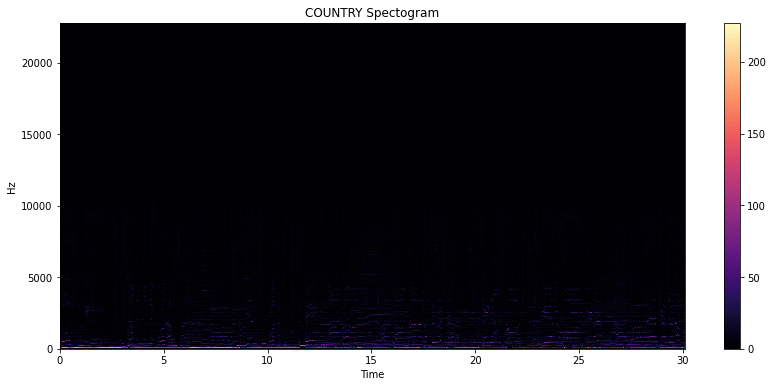

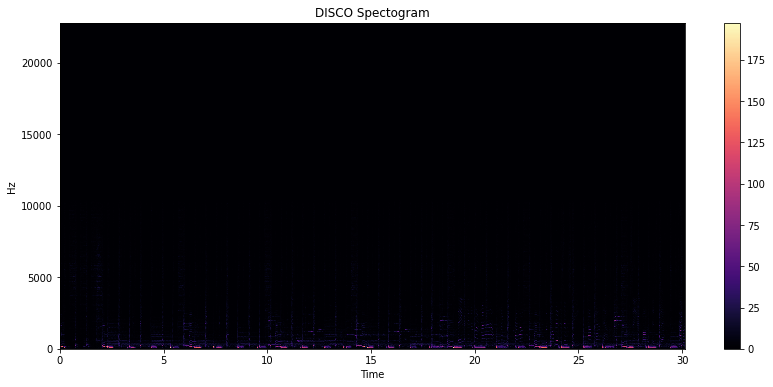

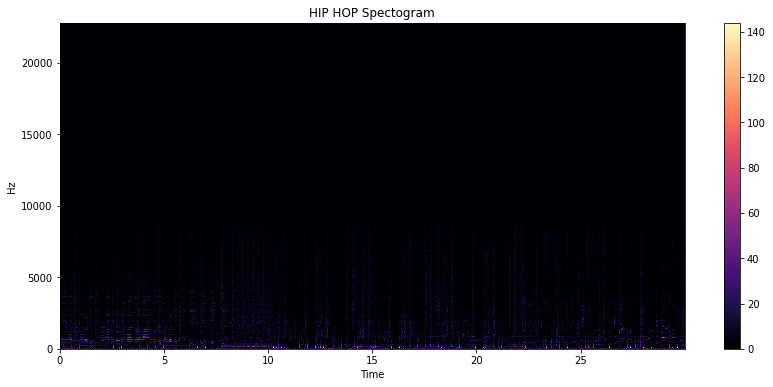

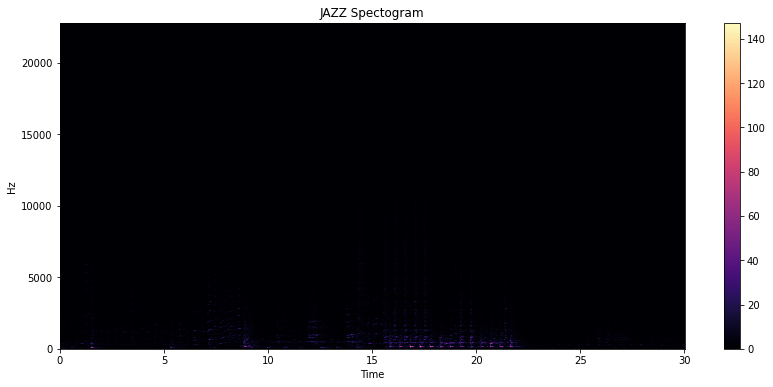

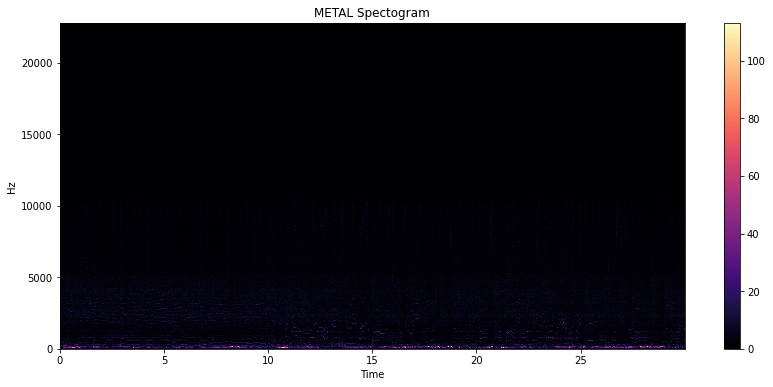

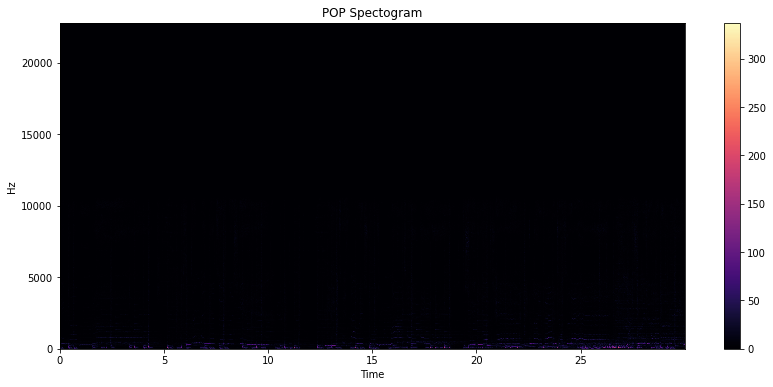

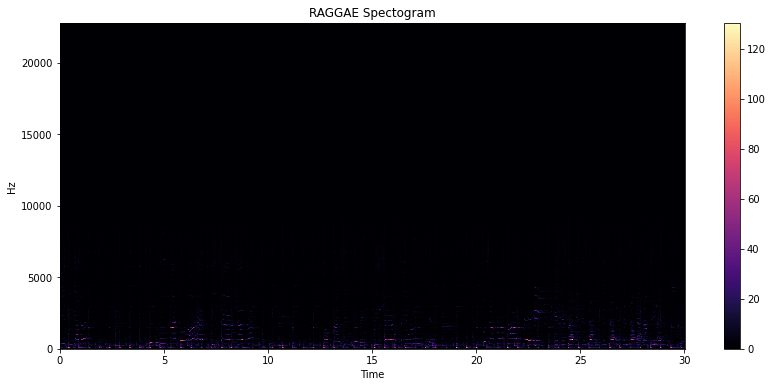

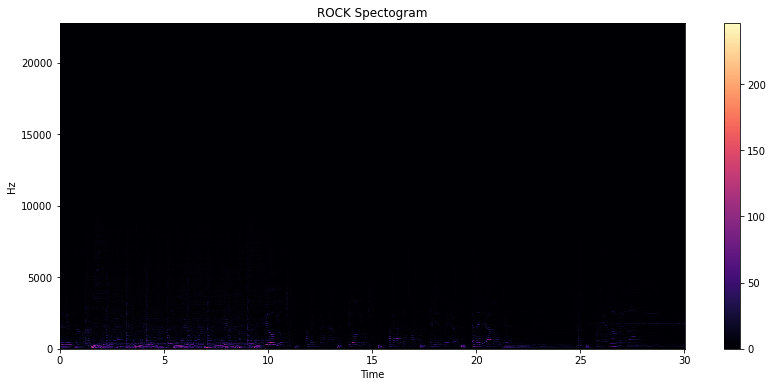

In [7]:
for genre, song in songs.items():
    stft = librosa.stft(song)
    plt.figure(figsize=(14, 6))
    lpt.specshow(stft, sr=sr, x_axis='time', y_axis='hz')
    plt.title(genre + ' Spectogram')
    plt.colorbar()

Mel Spectogram dB


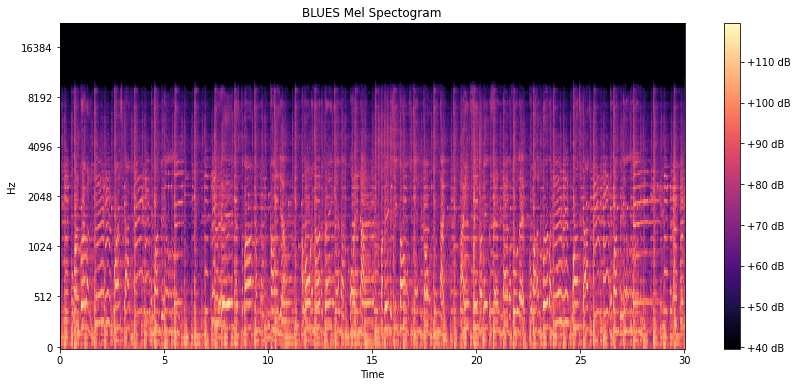

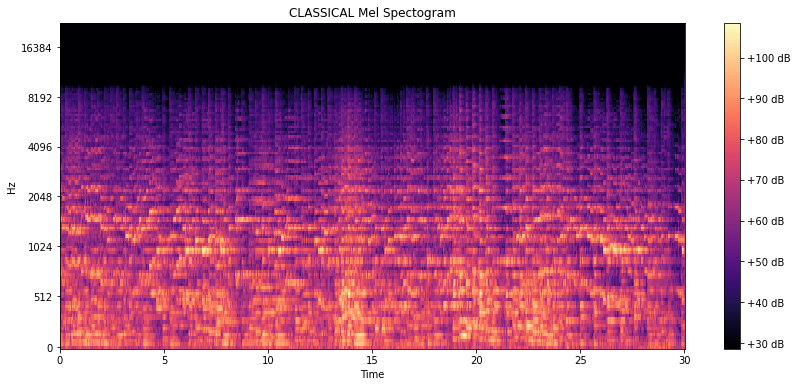

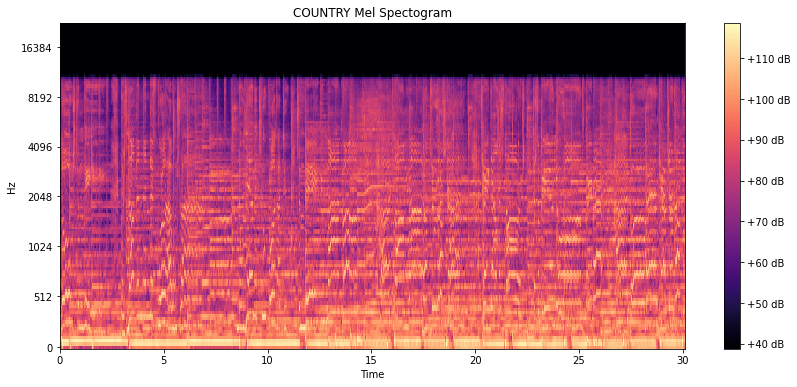

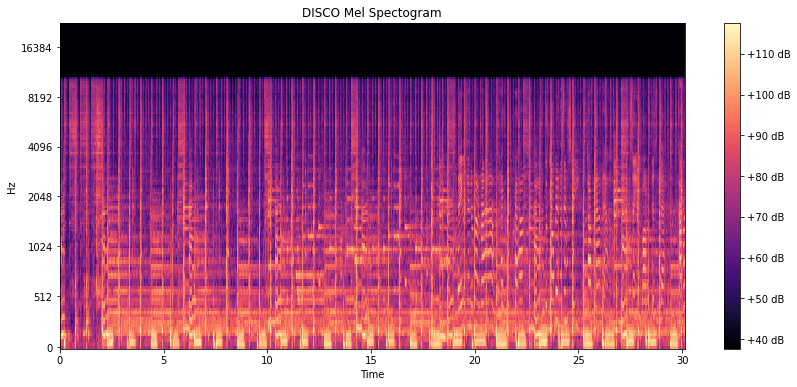

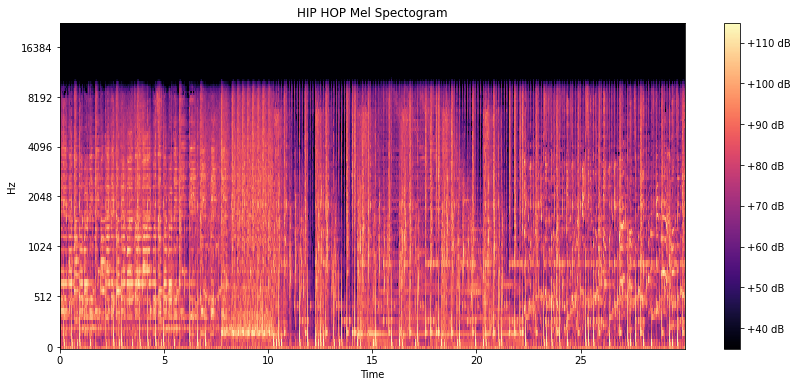

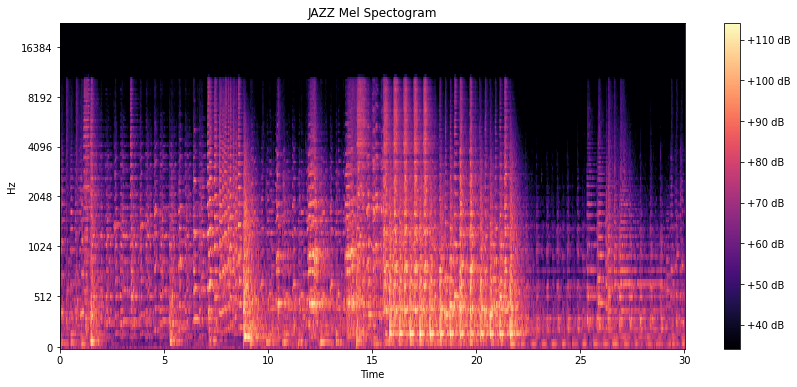

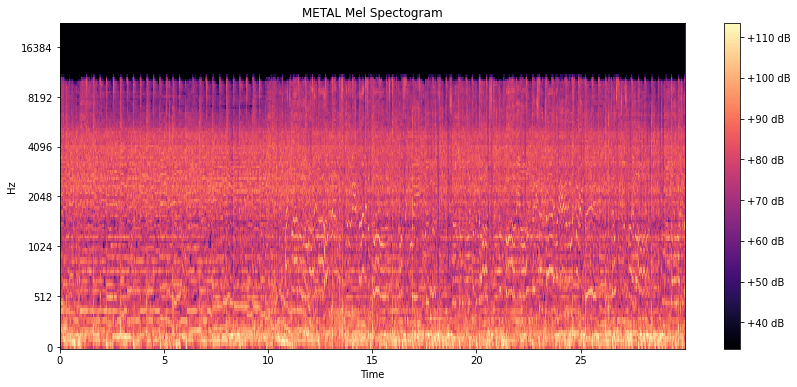

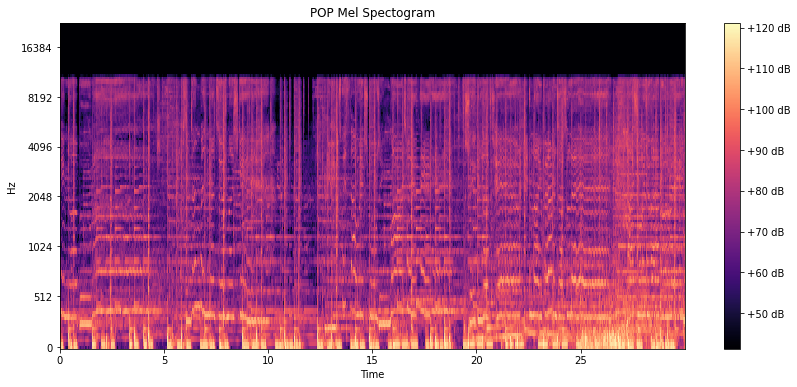

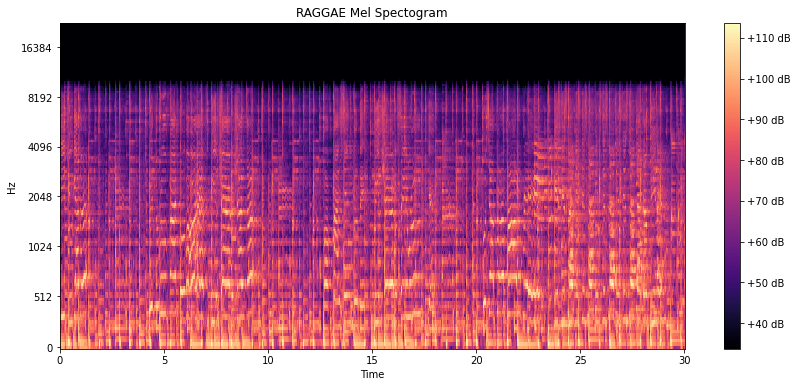

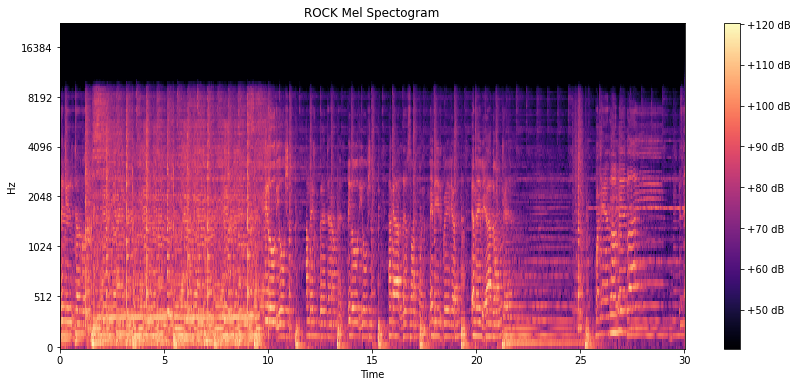

In [8]:
for genre, song in songs.items():
    stft = librosa.stft(song)
    magphase, _ = librosa.magphase(stft)
    mel_scale_sgram = librosa.feature.melspectrogram(S=magphase, sr=sr)
    mel_sgram = librosa.amplitude_to_db(mel_scale_sgram, ref=np.min)
    plt.figure(figsize=(14, 6))
    librosa.display.specshow(mel_sgram, sr=sr, x_axis='time', y_axis='mel')
    plt.title(genre + ' Mel Spectogram')
    plt.colorbar(format='%+2.0f dB')

Chroma Feature

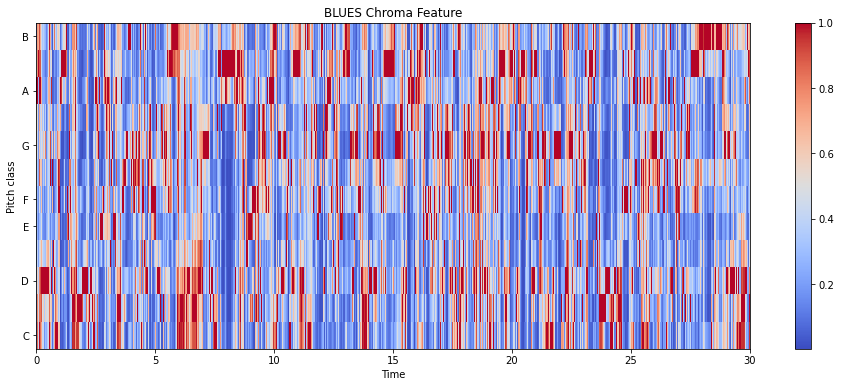

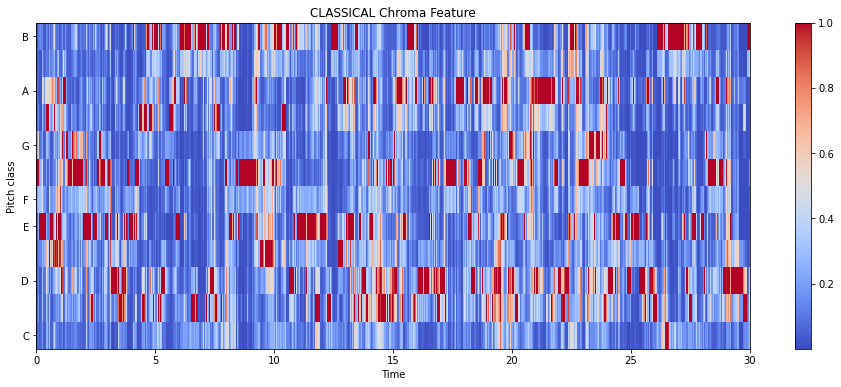

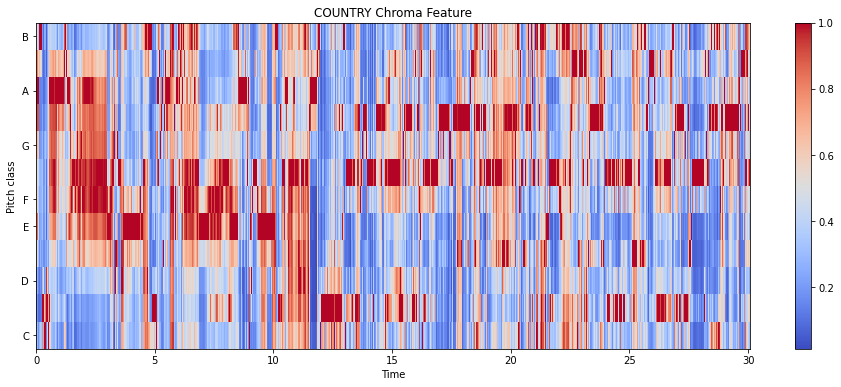

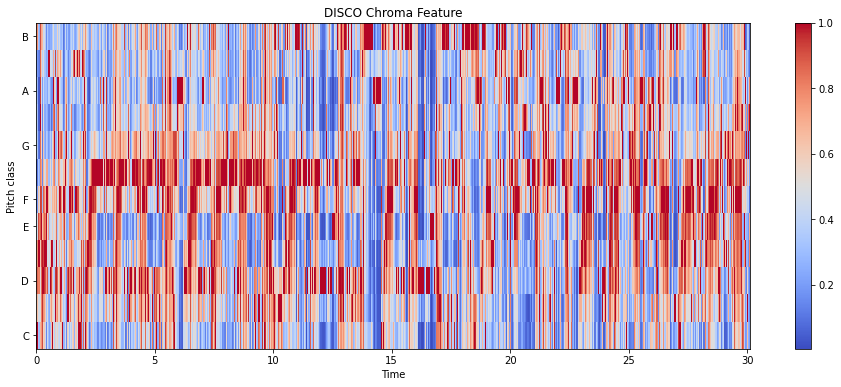

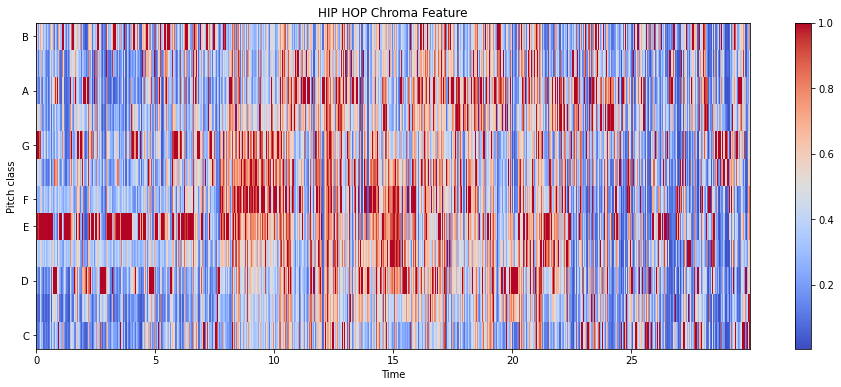

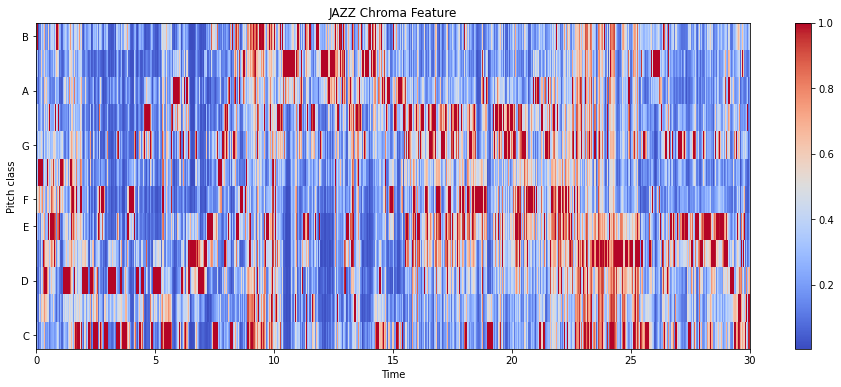

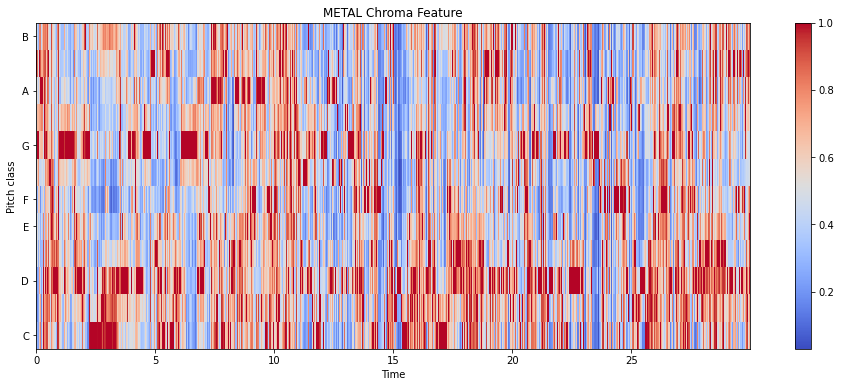

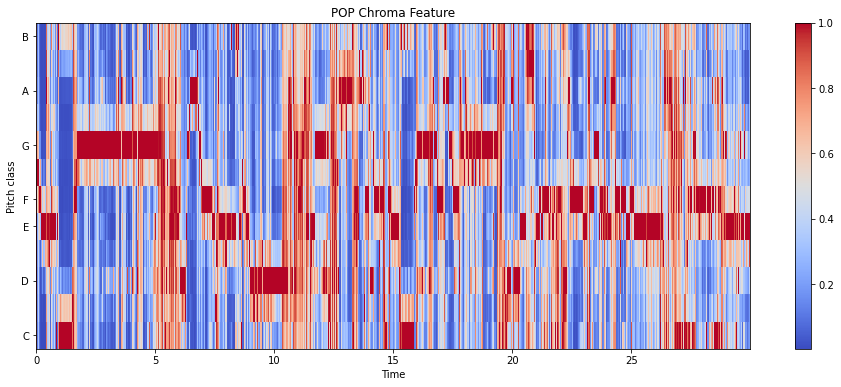

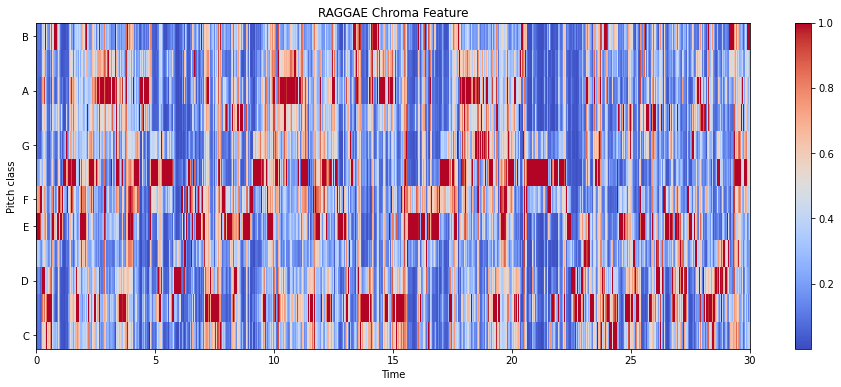

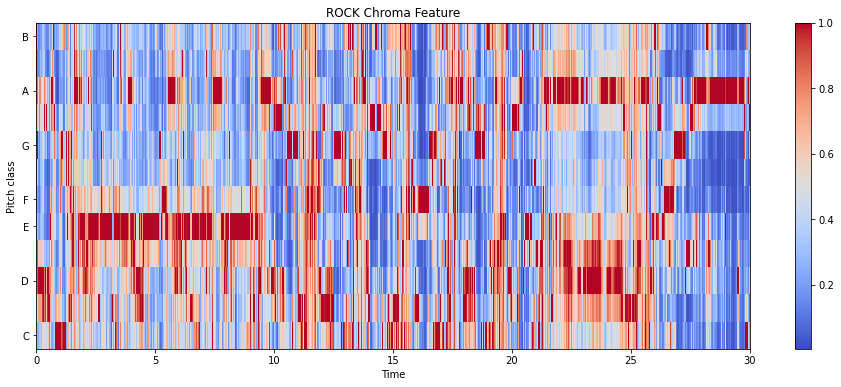

In [18]:
for genre, song in songs.items():
    chroma = librosa.feature.chroma_stft(song, sr=sr)
    plt.figure(figsize=(16, 6))
    lpt.specshow(chroma, sr=sr, x_axis='time', y_axis='chroma', cmap='coolwarm')
    plt.colorbar()
    plt.title(genre + ' Chroma Feature')

Zero Crossing-Rate


Zero crossings BLUES: 15
Zero crossings CLASSICAL: 13
Zero crossings COUNTRY: 3
Zero crossings DISCO: 10
Zero crossings HIP HOP: 21
Zero crossings JAZZ: 13
Zero crossings METAL: 31
Zero crossings POP: 0
Zero crossings RAGGAE: 10
Zero crossings ROCK: 8


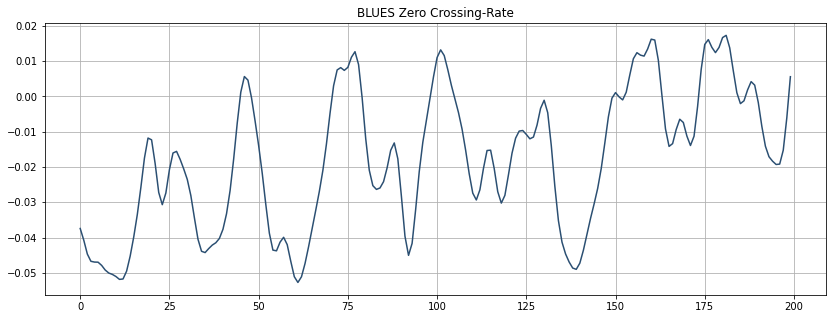

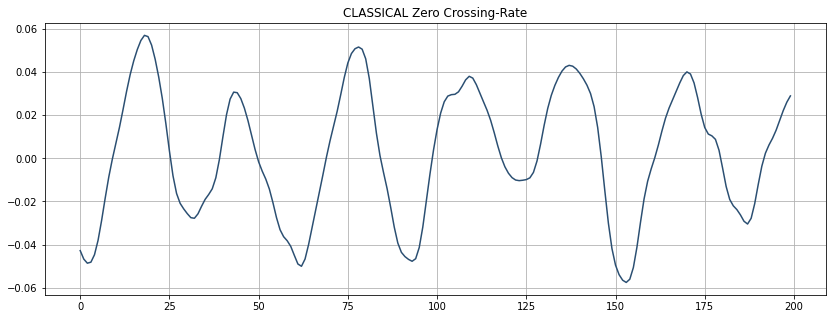

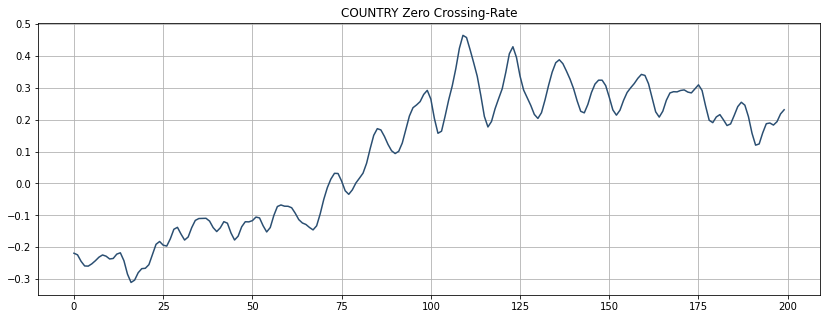

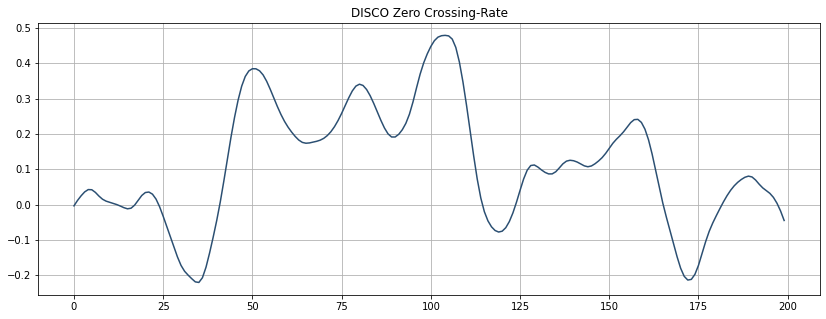

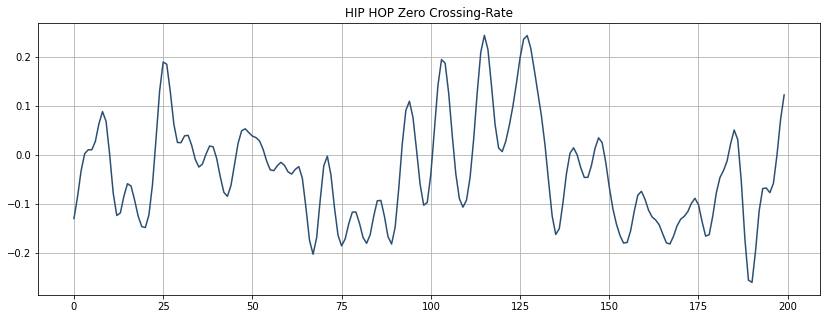

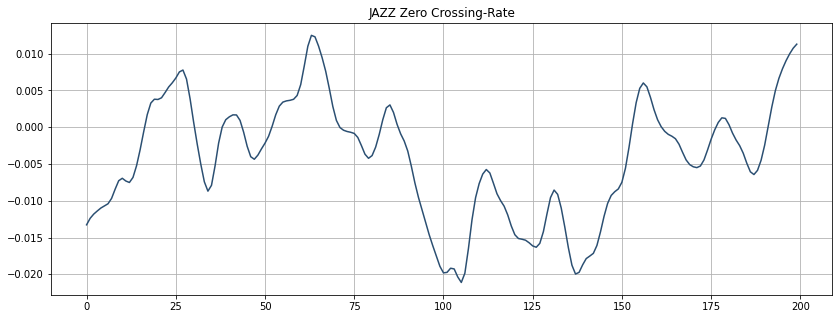

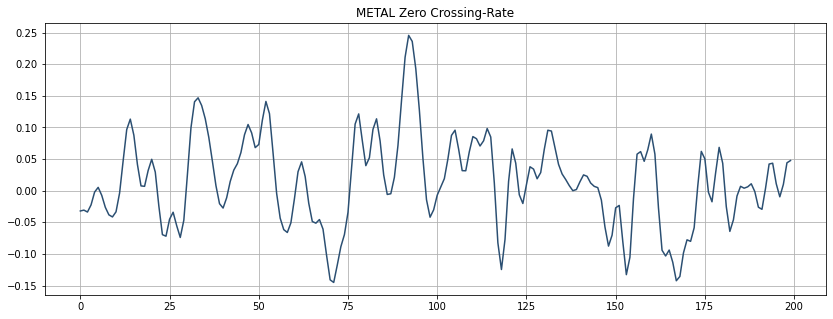

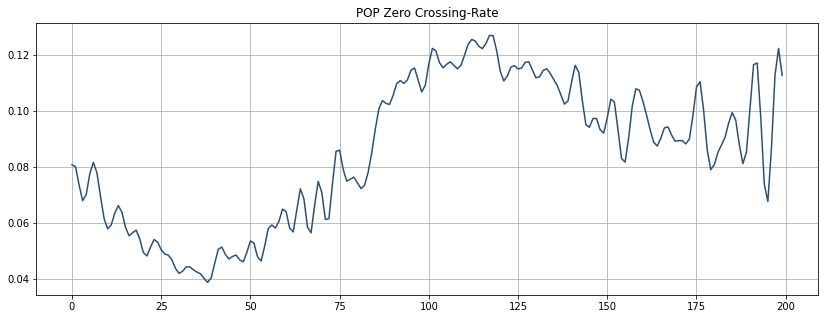

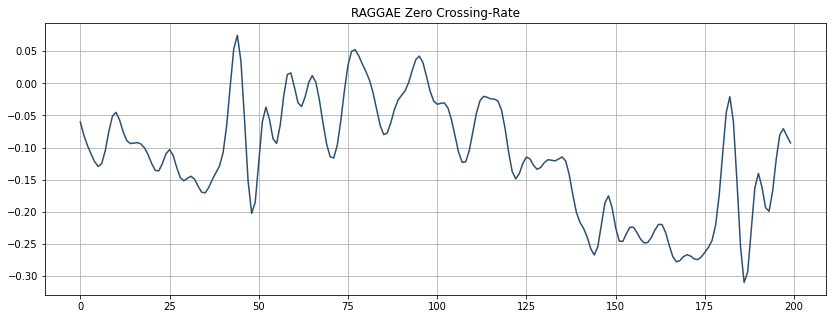

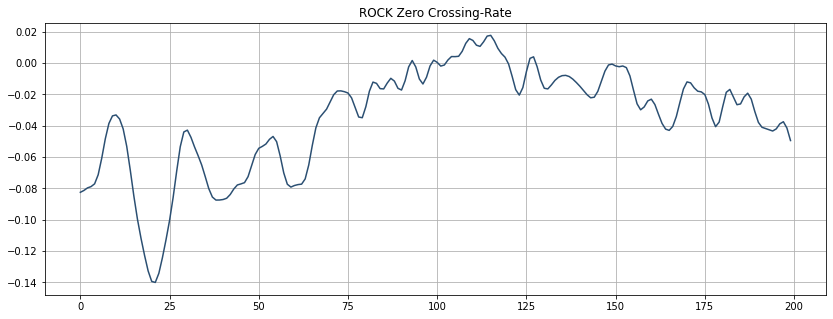

In [19]:
for genre, song in songs.items():
    plt.figure(figsize=(14, 5))
    plt.plot(song[start:end], color='#2B4F72')
    plt.title(genre + ' Zero Crossing-Rate')
    plt.grid()
    zero_crossings = librosa.zero_crossings(song[start:end], pad=False)
    print('Zero crossings ' + genre + ':', sum(zero_crossings))

(20, 2674)
(20, 2674)
(20, 2680)
(20, 2683)
(20, 2672)
(20, 2674)
(20, 2672)
(20, 2672)
(20, 2674)
(20, 2674)


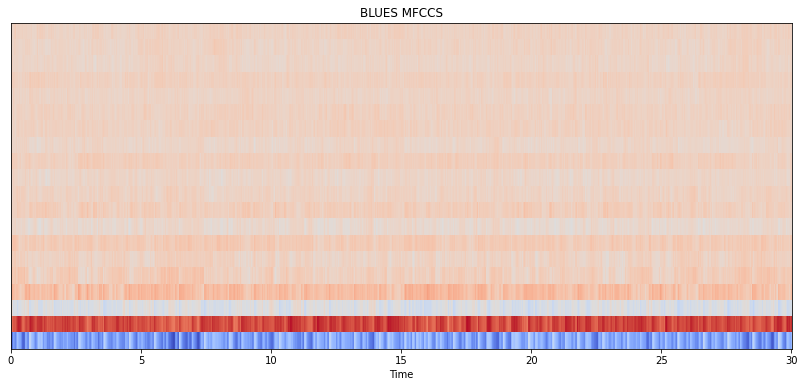

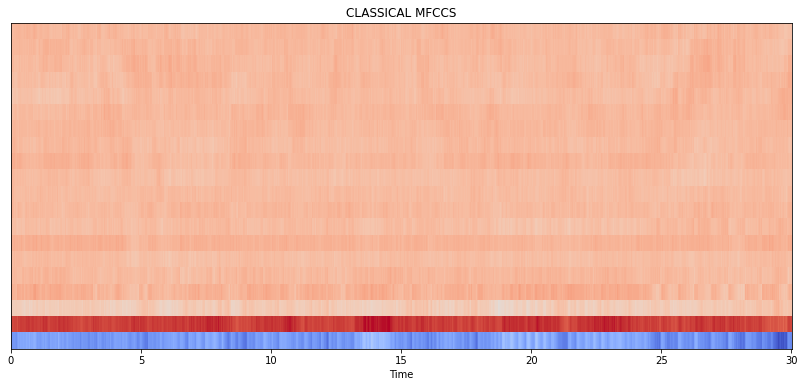

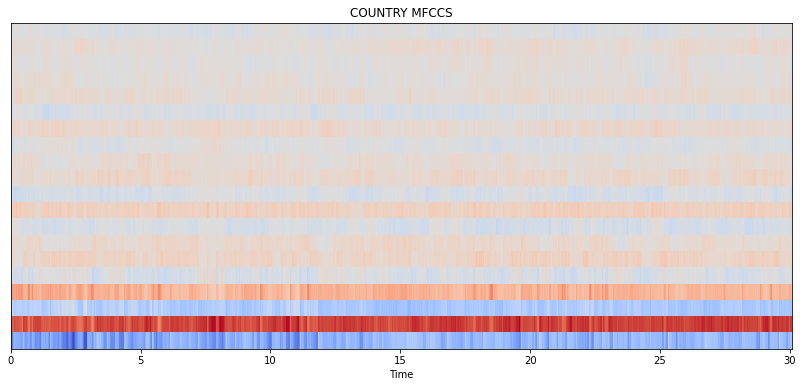

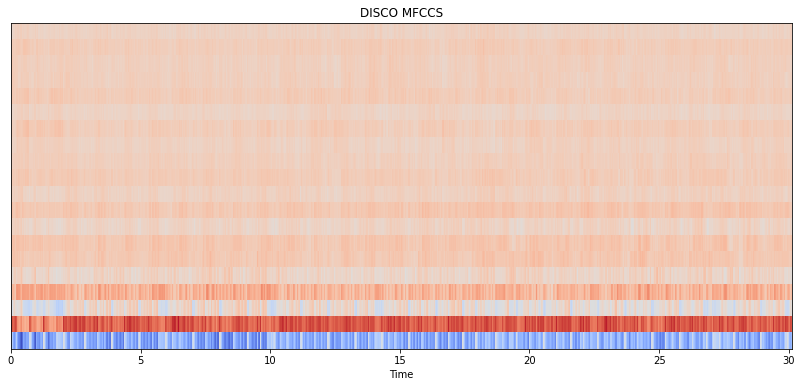

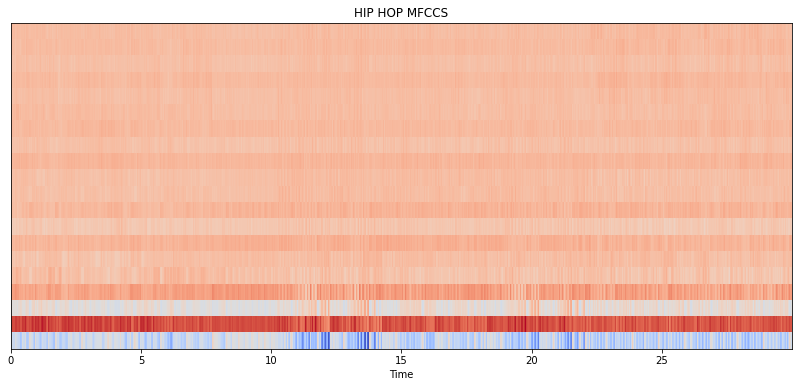

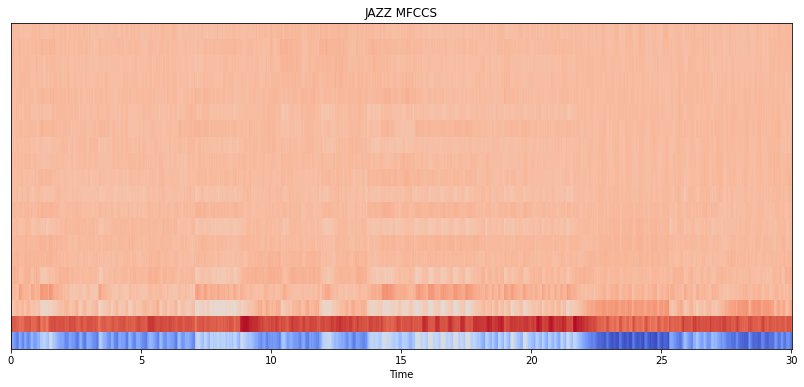

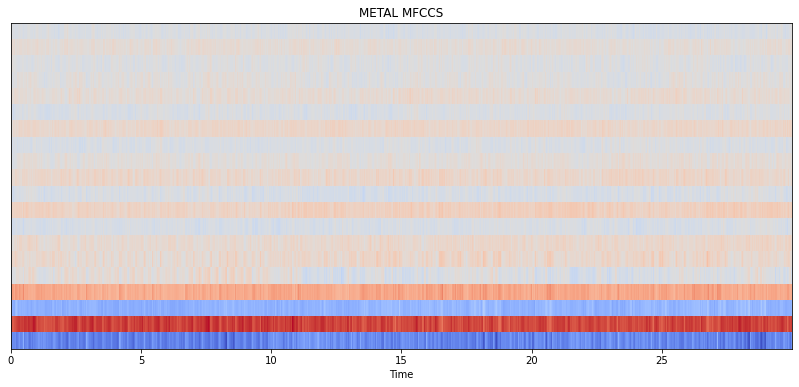

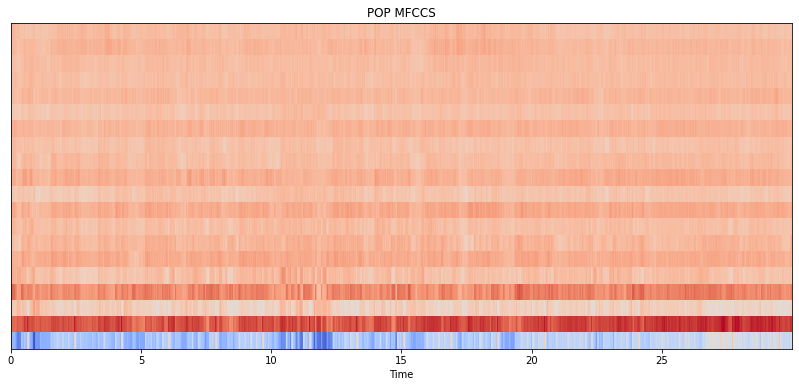

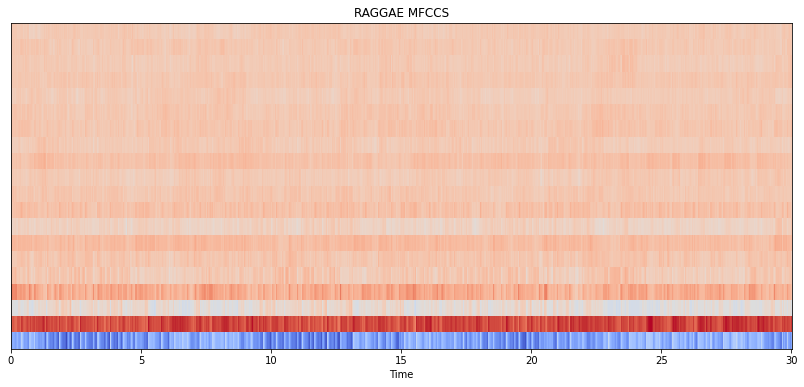

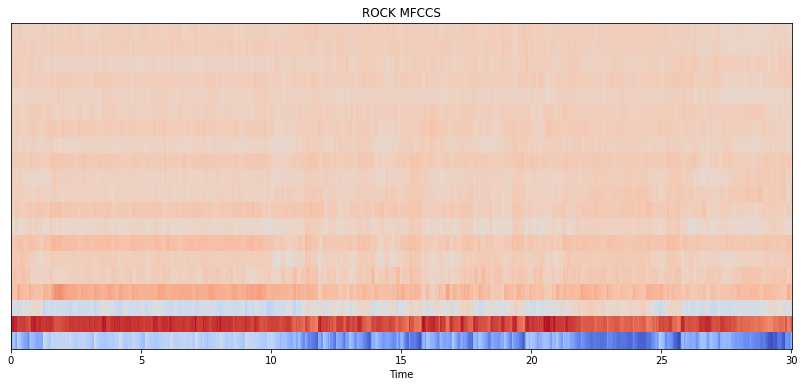

In [21]:
for genre, song in songs.items():
    mfccs = librosa.feature.mfcc(song, sr=sr)
    print(mfccs.shape)
    plt.figure(figsize=(14, 6))
    librosa.display.specshow(mfccs, sr=sr, x_axis='time')
    plt.title(genre + ' MFCCS')

### Understanding Audio:

Let's first Explore our Audio Data to see how it looks (we'll work with reggae.00036.wav file).


* Sound: sequence of vibrations in varying pressure strengths (y)

* The sample rate (sr) is the number of samples of audio carried per second, measured in Hz or kHz

In [24]:
general_path = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data'
print(list(os.listdir(f'{general_path}/genres_original/')))

['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']


In [25]:
# Importing 1 file
y, sr = librosa.load(f'{general_path}/genres_original/reggae/reggae.00036.wav')

print('y:', y, '\n')
print('y shape:', np.shape(y), '\n')
print('Sample Rate (KHz):', sr, '\n')

# Verify length of the audio
print('Check Len of Audio:', 661794/22050)

y: [0.02072144 0.04492188 0.05422974 ... 0.06912231 0.08303833 0.08572388] 

y shape: (661794,) 

Sample Rate (KHz): 22050 

Check Len of Audio: 30.013333333333332


In [26]:
# Trim leading and trailing silence from an audio signal (silence before and after the actual audio)
audio_file, _ = librosa.effects.trim(y)

# the result is an numpy ndarray
print('Audio File:', audio_file, '\n')
print('Audio File shape:', np.shape(audio_file))

Audio File: [0.02072144 0.04492188 0.05422974 ... 0.06912231 0.08303833 0.08572388] 

Audio File shape: (661794,)


2D Representation: Sound Waves

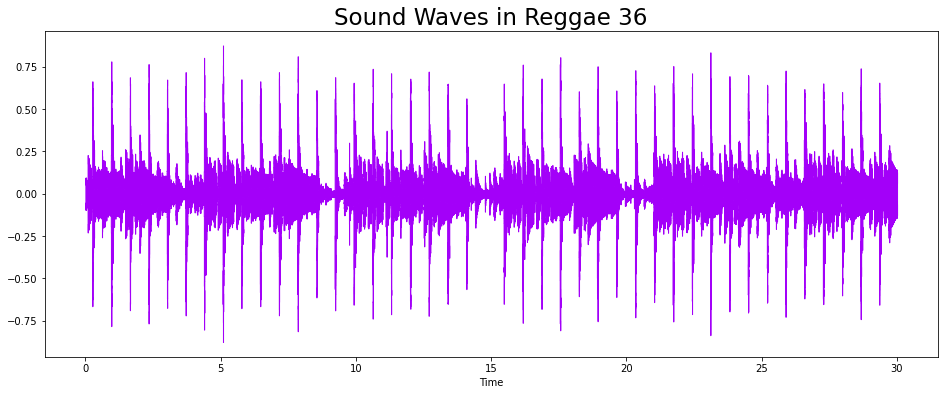

In [27]:
plt.figure(figsize = (16, 6))
librosa.display.waveshow(y = audio_file, sr = sr, color = "#A300F9");
plt.title("Sound Waves in Reggae 36", fontsize = 23);

### Fourier Transform
* Function that gets a signal in the time domain as input, and outputs its decomposition into frequencies
* Transform both the y-axis (frequency) to log scale, and the “color” axis (amplitude) to Decibels, which is approx. the log scale of amplitudes.

In [29]:
# Default FFT window size
n_fft = 2048 # FFT window size
hop_length = 512 # number audio of frames between STFT columns (looks like a good default)

# Short-time Fourier transform (STFT)
D = np.abs(librosa.stft(audio_file, n_fft = n_fft, hop_length = hop_length))

print('Shape of D object:', np.shape(D))

Shape of D object: (1025, 1293)


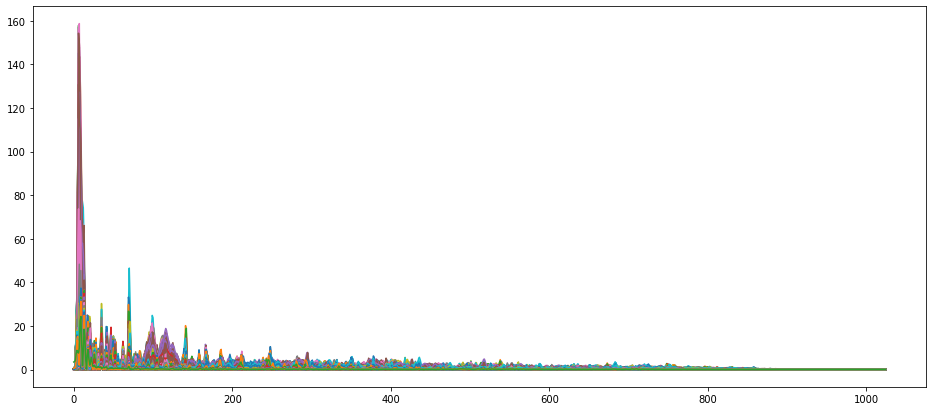

In [30]:
plt.figure(figsize = (16, 7))
plt.plot(D);

### Spectral Centroid
* indicates where the ”centre of mass” for a sound is located and is calculated as the weighted mean of the frequencies present in the sound.

In [31]:
# Calculate the Spectral Centroids
spectral_centroids = librosa.feature.spectral_centroid(audio_file, sr=sr)[0]

# Shape is a vector
print('Centroids:', spectral_centroids, '\n')
print('Shape of Spectral Centroids:', spectral_centroids.shape, '\n')

# Computing the time variable for visualization
frames = range(len(spectral_centroids))

# Converts frame counts to time (seconds)
t = librosa.frames_to_time(frames)

print('frames:', frames, '\n')
print('t:', t)

# Function that normalizes the Sound Data
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

Centroids: [1758.29476432 1946.74243678 2038.8113414  ...  766.50416352 1041.07728901
 1391.05145642] 

Shape of Spectral Centroids: (1293,) 

frames: range(0, 1293) 

t: [0.00000000e+00 2.32199546e-02 4.64399093e-02 ... 2.99537415e+01
 2.99769615e+01 3.00001814e+01]


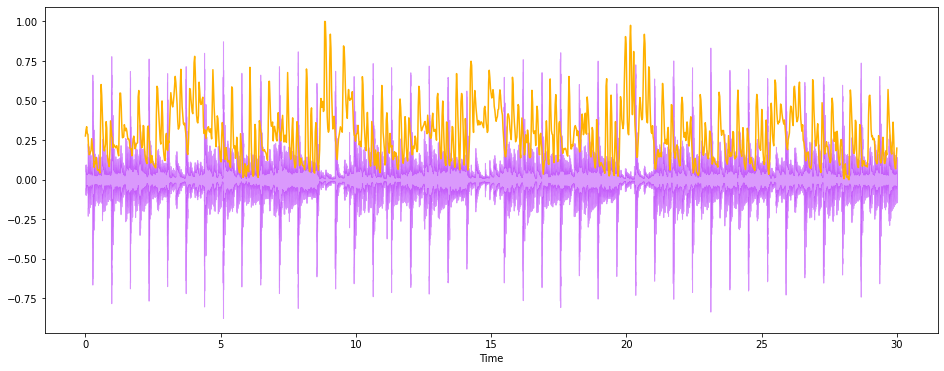

In [32]:
#Plotting the Spectral Centroid along the waveform
plt.figure(figsize = (16, 6))
librosa.display.waveshow(audio_file, sr=sr, alpha=0.4, color = '#A300F9');
plt.plot(t, normalize(spectral_centroids), color='#FFB100');

### Spectral Rolloff
* is a measure of the shape of the signal. It represents the frequency below which a specified percentage of the total spectral energy, e.g. 85%, lies

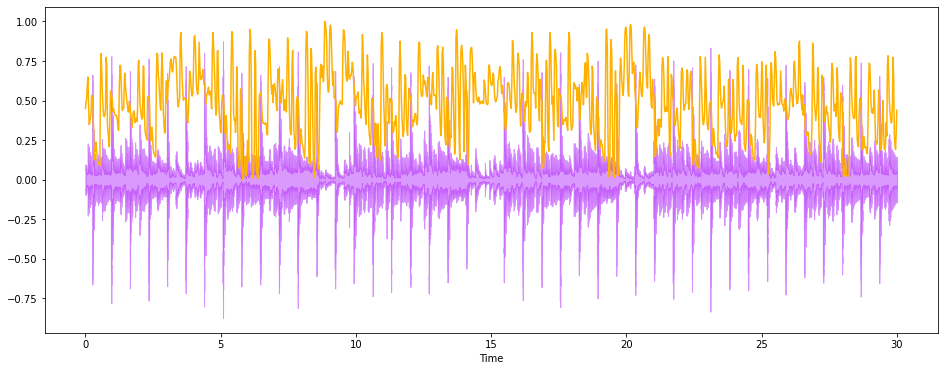

In [33]:
# Spectral RollOff Vector
spectral_rolloff = librosa.feature.spectral_rolloff(audio_file, sr=sr)[0]

# The plot
plt.figure(figsize = (16, 6))
librosa.display.waveshow(audio_file, sr=sr, alpha=0.4, color = '#A300F9');
plt.plot(t, normalize(spectral_rolloff), color='#FFB100');

In [35]:
data = pd.read_csv(f'{general_path}/features_30_sec.csv')
data.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,...,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,...,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,...,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,...,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,...,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


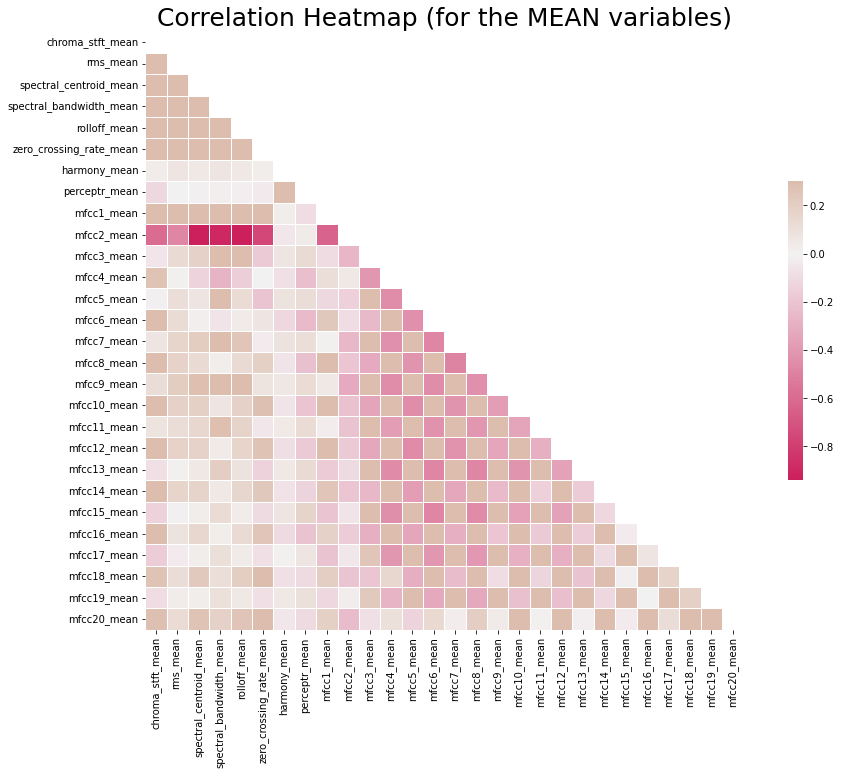

In [37]:
# Computing the Correlation Matrix
spike_cols = [col for col in data.columns if 'mean' in col]
corr = data[spike_cols].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=np.bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(16, 11));

# Generate a custom diverging colormap
cmap = sns.diverging_palette(0, 25, as_cmap=True, s = 90, l = 45, n = 5)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

plt.title('Correlation Heatmap (for the MEAN variables)', fontsize = 25)
plt.xticks(fontsize = 10)
plt.yticks(fontsize = 10);

### Box Plot for Genres Distributions

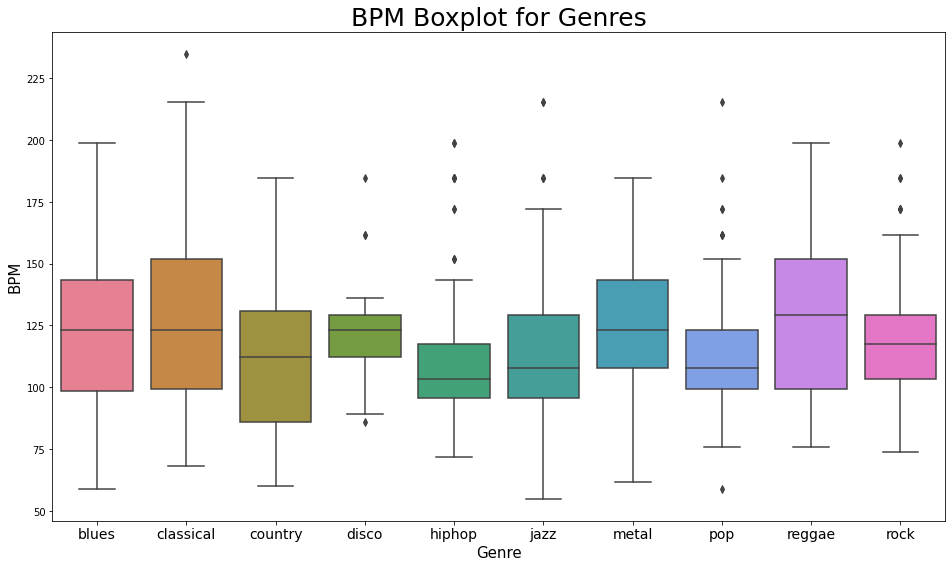

In [38]:
x = data[["label", "tempo"]]

f, ax = plt.subplots(figsize=(16, 9));
sns.boxplot(x = "label", y = "tempo", data = x, palette = 'husl');

plt.title('BPM Boxplot for Genres', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Genre", fontsize = 15)
plt.ylabel("BPM", fontsize = 15)
plt.savefig("BPM Boxplot.jpg")

### Principal Component Analysis - to visualize possible groups of genres

1. Normalisation 
2. PCA
3. The scatter plot

In [39]:
from sklearn import preprocessing

data = data.iloc[0:, 1:]
y = data['label']
X = data.loc[:, data.columns != 'label']

#### NORMALIZE X ####
cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)
X = pd.DataFrame(np_scaled, columns = cols)


#### PCA 2 COMPONENTS ####
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X)
principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])

# concatenate with target label
finalDf = pd.concat([principalDf, y], axis = 1)

pca.explained_variance_ratio_

# 44.93 variance explained

array([0.2439355 , 0.21781804])

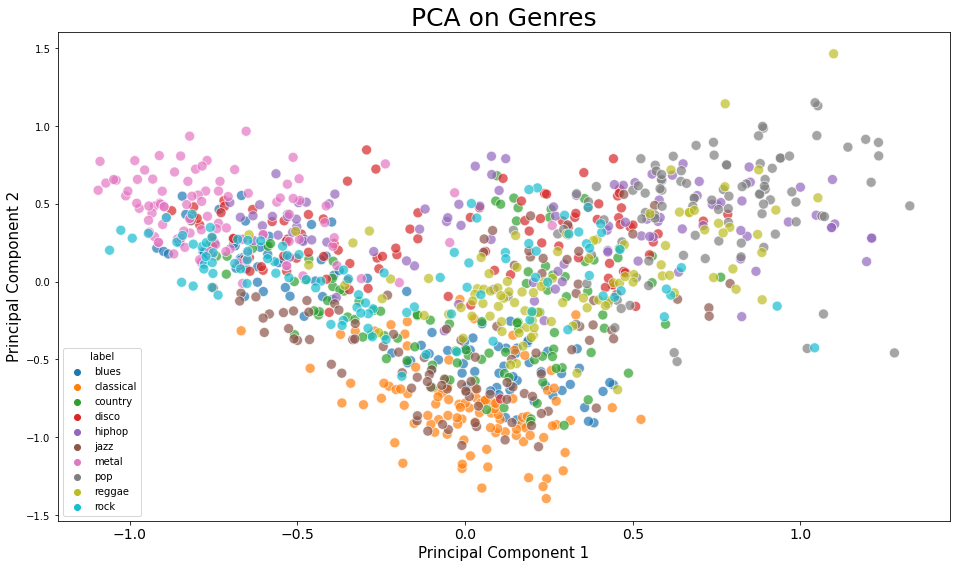

In [40]:
plt.figure(figsize = (16, 9))
sns.scatterplot(x = "principal component 1", y = "principal component 2", data = finalDf, hue = "label", alpha = 0.7,
               s = 100);

plt.title('PCA on Genres', fontsize = 25)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Principal Component 1", fontsize = 15)
plt.ylabel("Principal Component 2", fontsize = 15)
plt.savefig("PCA Scattert.jpg")

### Machine Learning Classification
Using the features_3_sec.csv file, we can try to build a classifier that accurately predicts for any new audio file input it's genre.

In [42]:
data = pd.read_csv(f'{general_path}/features_3_sec.csv')
data = data.iloc[0:, 1:] 
data.head()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


### Features and Target Variables 
* creates the target and feature variables 
* normalises the data

In [43]:
from sklearn import preprocessing
label_encoder = preprocessing.LabelEncoder()
data['label']= label_encoder.fit_transform(data['label'])
data

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,0
1,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,0
2,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,0
3,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,0
4,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9985,66149,0.349126,0.080515,0.050019,0.000097,1499.083005,164266.886443,1718.707215,85931.574523,3015.559458,...,42.485981,-9.094270,38.326839,-4.246976,31.049839,-5.625813,48.804092,1.818823,38.966969,9
9986,66149,0.372564,0.082626,0.057897,0.000088,1847.965128,281054.935973,1906.468492,99727.037054,3746.694524,...,32.415203,-12.375726,66.418587,-3.081278,54.414265,-11.960546,63.452255,0.428857,18.697033,9
9987,66149,0.347481,0.089019,0.052403,0.000701,1346.157659,662956.246325,1561.859087,138762.841945,2442.362154,...,78.228149,-2.524483,21.778994,4.809936,25.980829,1.775686,48.582378,-0.299545,41.586990,9
9988,66149,0.387527,0.084815,0.066430,0.000320,2084.515327,203891.039161,2018.366254,22860.992562,4313.266226,...,28.323744,-5.363541,17.209942,6.462601,21.442928,2.354765,24.843613,0.675824,12.787750,9


In [44]:
X = data.loc[:, data.columns != 'label']
y = data['label']


Normalising X 

In [45]:
cols = X.columns
min_max_scaler = preprocessing.MinMaxScaler()
np_scaled = min_max_scaler.fit_transform(X)
X = pd.DataFrame(np_scaled, columns = cols)

splitting the dataset

In [46]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

### Creating a Predefined function to assess the accuracy of a model
* Input is the model
* fits the model on the training set
* predicts on the testing features 
* compares the predictions with the actual

In [61]:
def model_assess(model, title = "Default"):
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    #print(confusion_matrix(y_test, preds))
    con_mat = confusion_matrix(y_test, preds)
    plt.figure(figsize=(16, 9))
    sns.heatmap(con_mat, cmap="Reds", annot=True, 
                xticklabels = ["blues", "classical", "country", "disco", 
                               "hiphop", "jazz", "metal", "pop", "reggae", "rock"], 
                yticklabels=["blues", "classical", "country", "disco", "hiphop", 
                             "jazz", "metal", "pop", "reggae", "rock"])
    plt.show()
    print('Accuracy', title, ':', round(accuracy_score(y_test, preds), 5), '\n')

In [66]:
temp = X
X = np.array(temp)

In [73]:
def model_build(model, kf, title = "Default"):
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    for train_index, test_index in kf.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy_scores.append(accuracy_score(y_test, y_pred))
    print("Accuracy score of", title, "is:", round(np.mean(accuracy_scores), 2))
    # Let's see the confusion matrix of the last split for a little insight
    con_mat = confusion_matrix(y_test, y_pred)
    plt.figure(figsize = (16, 9))
    sns.heatmap(con_mat, cmap="Greens", annot=True, 
                xticklabels = ["blues", "classical", "country", "disco", 
                               "hiphop", "jazz", "metal", "pop", "reggae", "rock"], 
                yticklabels=["blues", "classical", "country", "disco", "hiphop", 
                             "jazz", "metal", "pop", "reggae", "rock"])
    plt.show()
    


In [56]:
split = KFold(n_splits=5, shuffle=True)

### Trying  different models to assess their performance

 Naive Bayes


Accuracy score of Naive Bayes is: 0.52


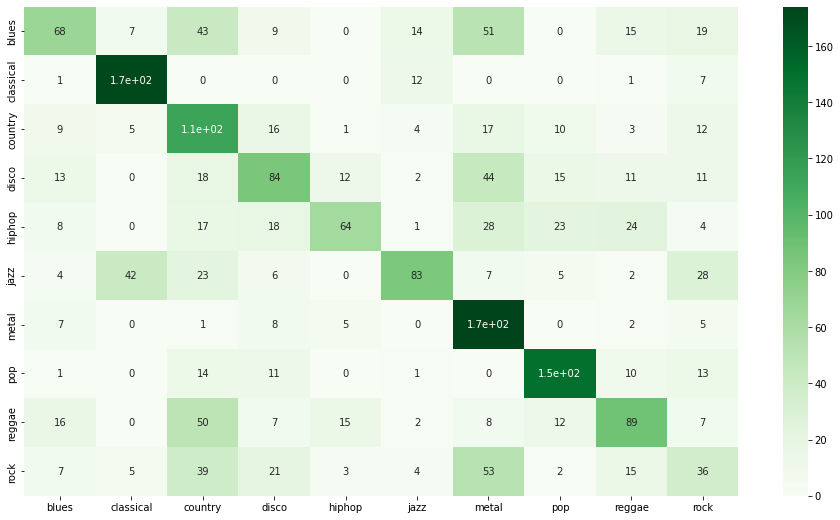

In [75]:
nb = GaussianNB()
model_build(nb, split, 'Naive Bayes')

Stochastic Gradient Descent


Accuracy score of Stochastic Gradient Descent is: 0.64


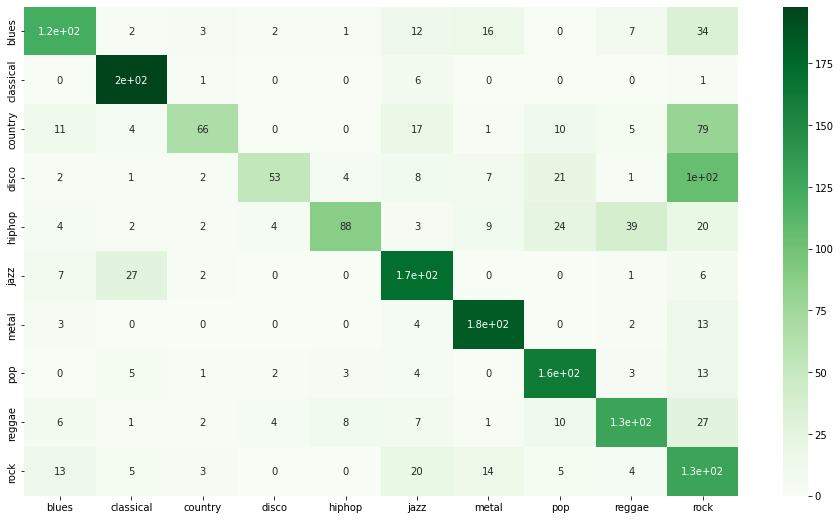

In [76]:
sgd = SGDClassifier(max_iter=5000, random_state=0)
model_build(sgd,split ,"Stochastic Gradient Descent")

KNN

Accuracy score of K Nearest Neighbor is: 0.87


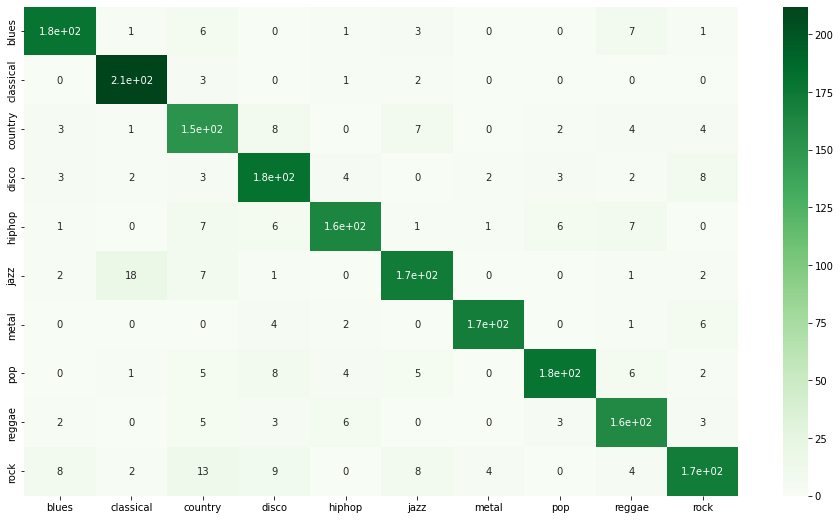

In [77]:
knn = KNeighborsClassifier(n_neighbors=10)
model_build(knn, split, 'K Nearest Neighbor')

Decission trees


Accuracy score of Decission trees is: 0.66


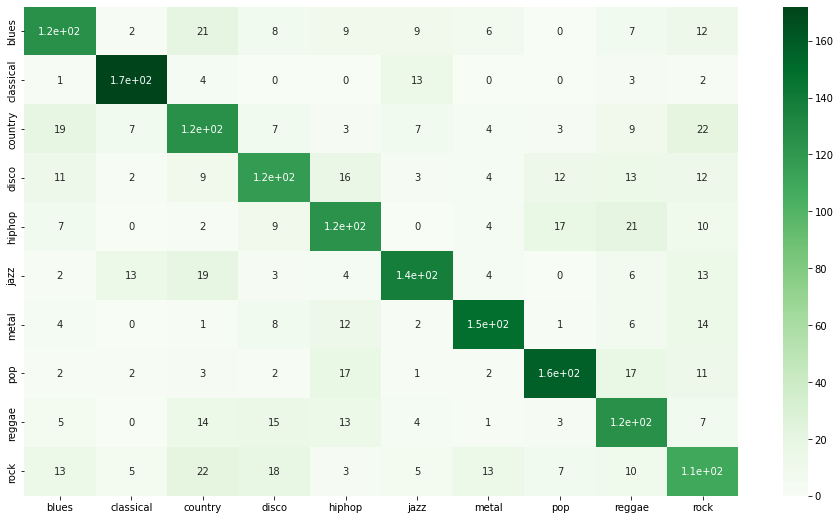

In [79]:
tree = DecisionTreeClassifier()
model_build(tree, split ,"Decission trees")

Random Forest


Accuracy score of Random Forest is: 0.81


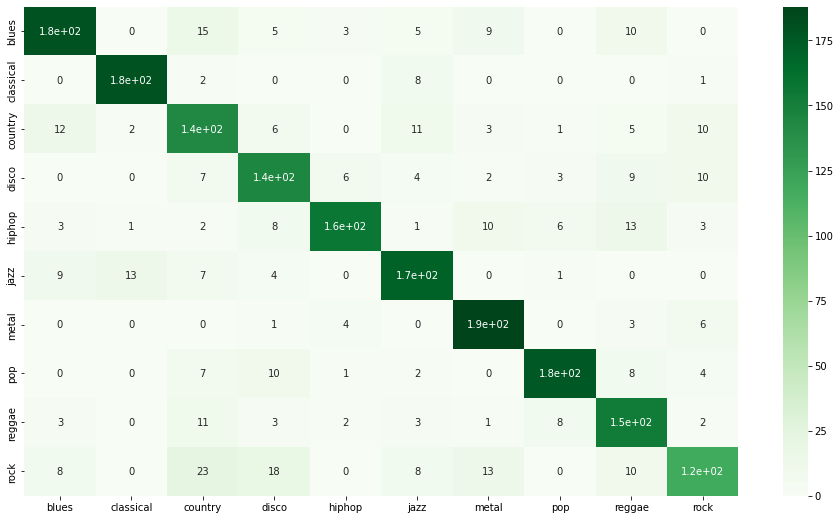

In [83]:
rforest = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=0)
model_build(rforest, split,"Random Forest")

Logistic Regression


Accuracy score of Logistic Regression is: 0.69


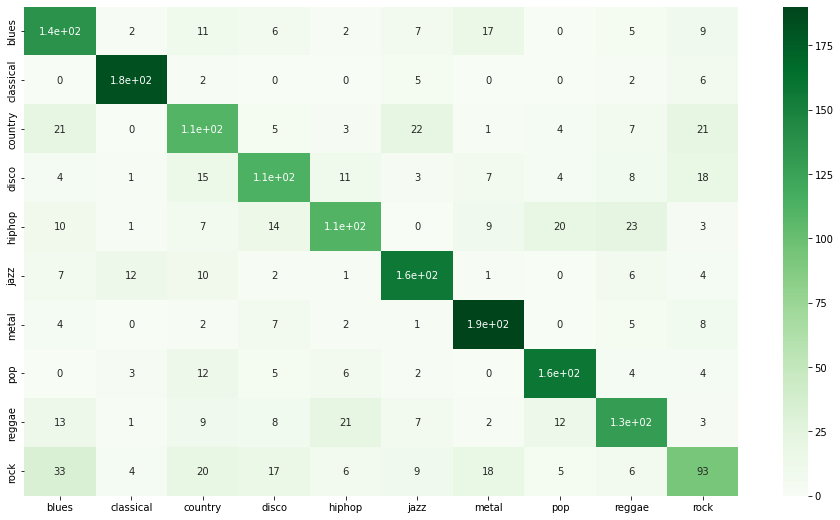

In [82]:
lg = LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial')
model_build(lg, split,"Logistic Regression")

Multi Layer Perceptron

Accuracy score of Neural Nets is: 0.67


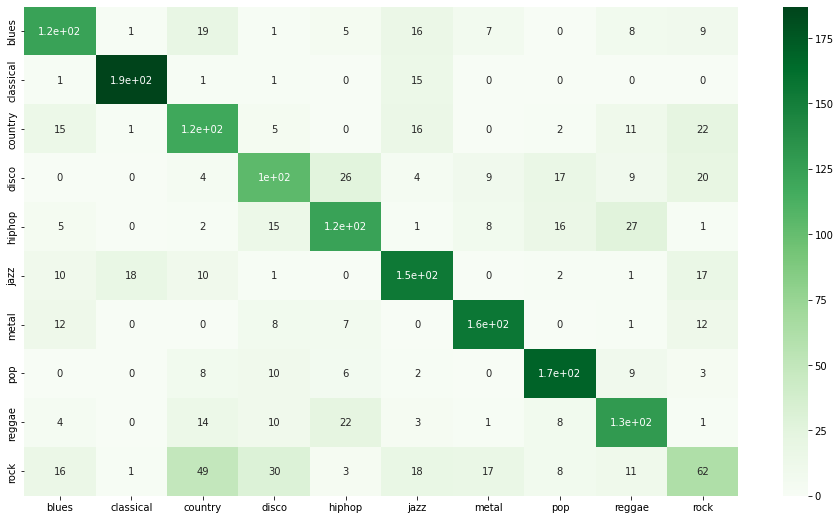

In [84]:
nn = MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5000, 10), random_state=1)
model_build(nn, split ,"Neural Nets")

Support Vector Machine

Accuracy score of Support Vector Machine is: 0.75


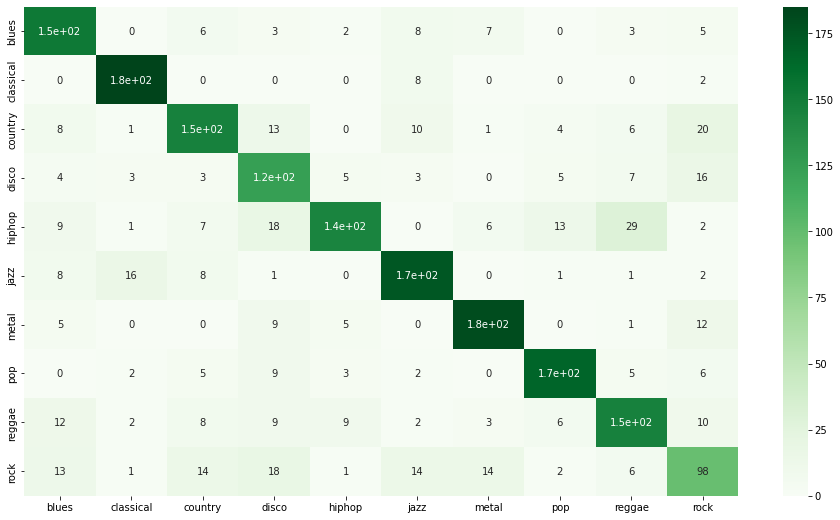

In [90]:
svm = SVC(decision_function_shape="ovo")
model_build(svm, split ,"Support Vector Machine")

Accuracy score of SVM linear kernel is: 0.72


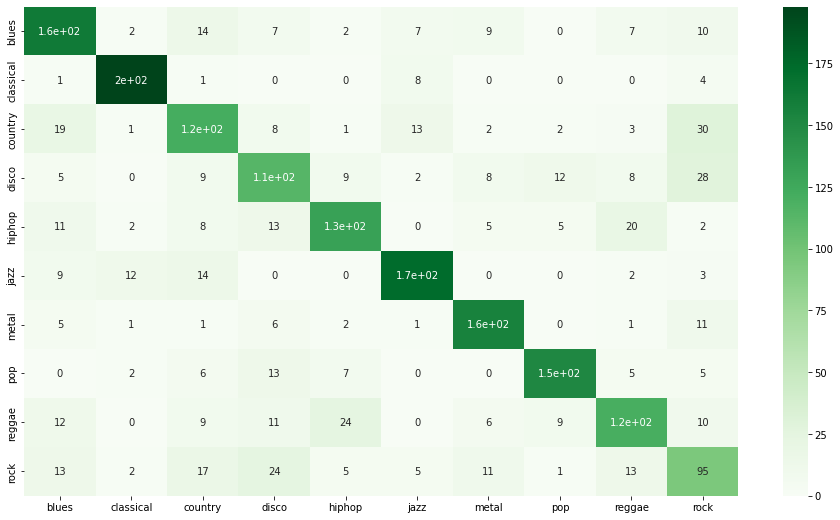

In [91]:
from sklearn.svm import SVC
model = SVC(C=1.0,kernel='linear',random_state=0)
model_build(model, split, "SVM linear kernel")

Accuracy score of SVM poly kernel of degree 2 is: 0.76


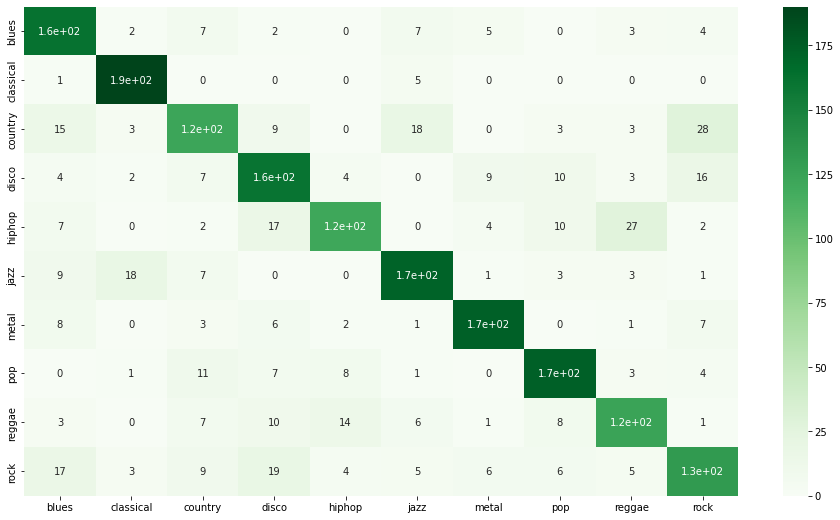

In [92]:
model = SVC(C=1.0,kernel='poly',degree=2,random_state=0)
model_build(model, split, "SVM poly kernel of degree 2")

Accuracy score of SVM poly kernel of degree 3 is: 0.8


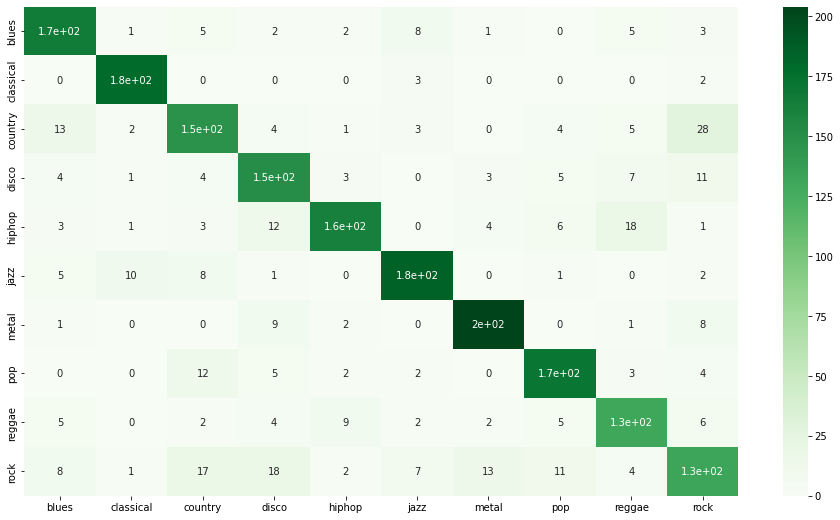

In [93]:
model = SVC(C=1.0,kernel='poly',degree=3,random_state=0)
model_build(model, split, "SVM poly kernel of degree 3")

Accuracy score of SVM poly kernel of degree 4 is: 0.85


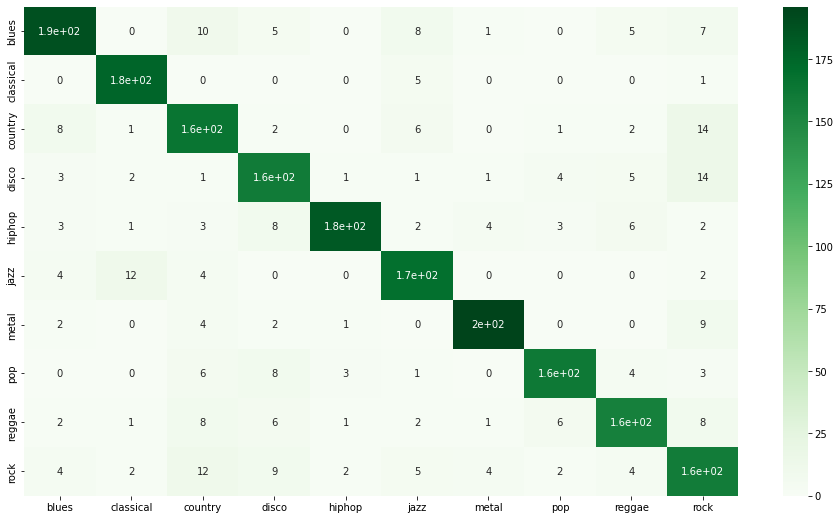

In [94]:
model = SVC(C=1.0,kernel='poly',degree=4,random_state=0)
model_build(model,split, "SVM poly kernel of degree 4")

Accuracy score of SVM poly kernel of degree 5 is: 0.88


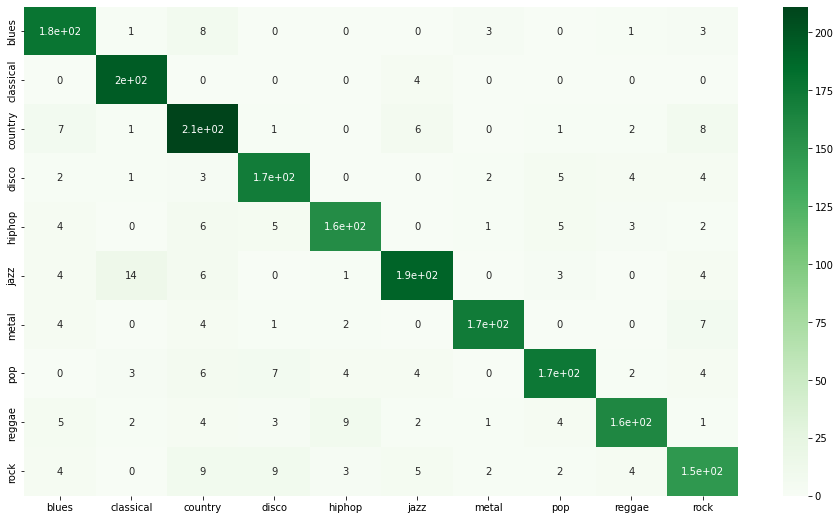

In [95]:
model = SVC(C=1.0,kernel='poly',degree=5,random_state=0)
model_build(model, split, "SVM poly kernel of degree 5")

Accuracy score of SVM poly kernel of degree 6 is: 0.89


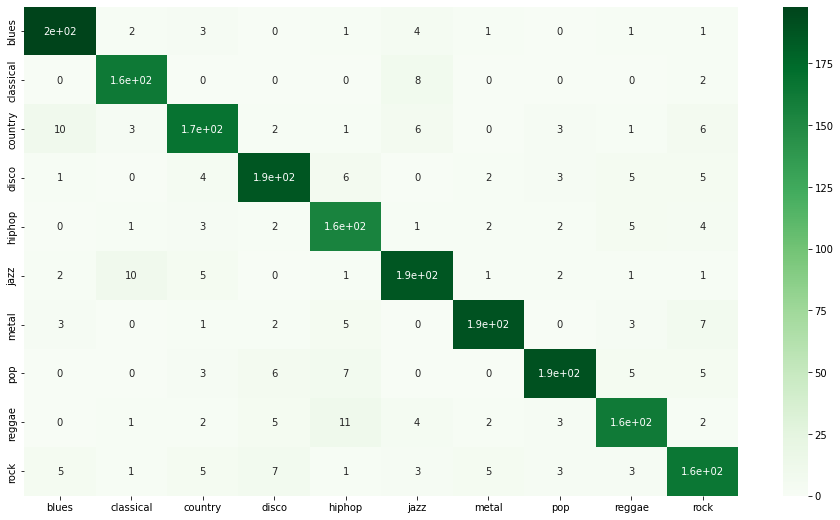

In [96]:
model = SVC(C=1.0,kernel='poly',degree=6,random_state=0)
model_build(model, split, "SVM poly kernel of degree 6")

Accuracy score of SVM poly kernel of degree 7 is: 0.89


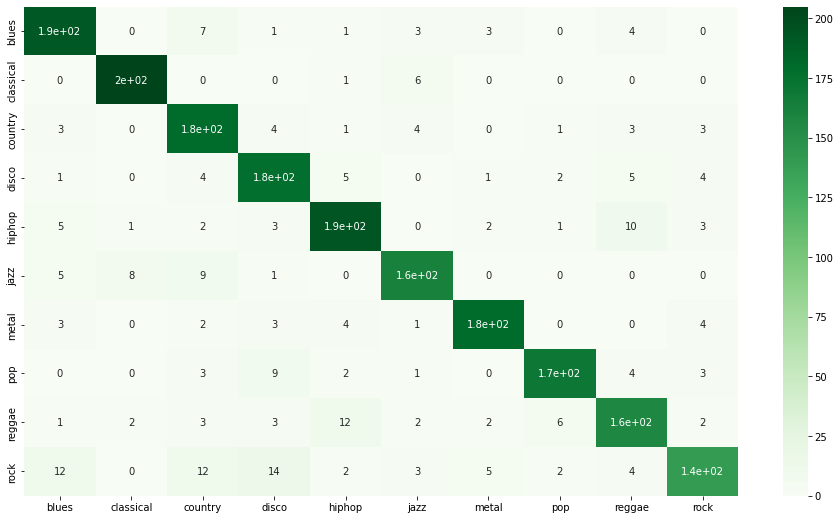

In [97]:
model = SVC(C=1.0,kernel='poly',degree=7,random_state=0)
model_build(model, split, "SVM poly kernel of degree 7")

Accuracy score of SVM rbf kernel c=1 is: 0.75


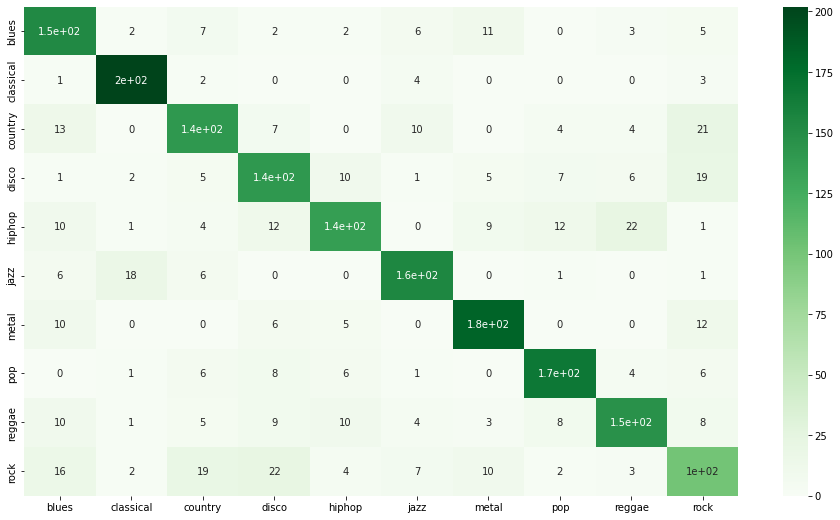

Accuracy score of SVM rbf kernel c=2 is: 0.78


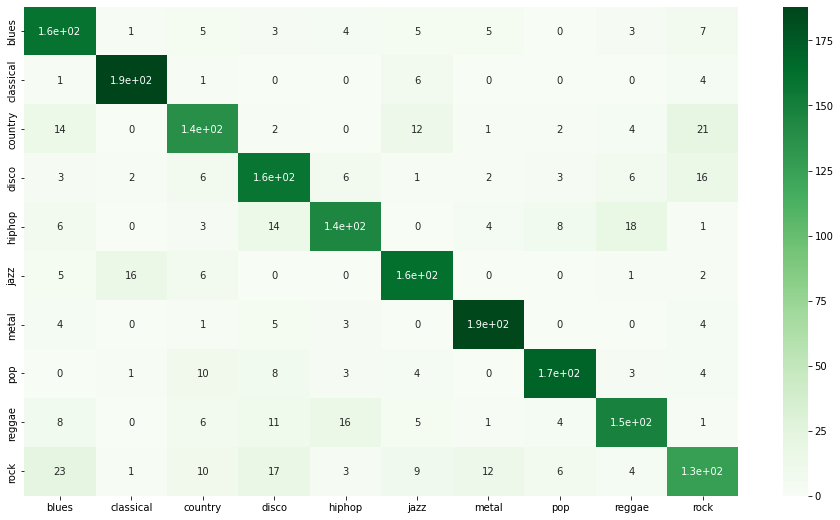

In [98]:
for i in range(1,3):
    c=i
    model = SVC(C=i,kernel='rbf',random_state=0)
    model_build(model, split, "SVM rbf kernel c=" + str(c))

Accuracy score of SVM rbf kernel c=10 is: 0.84


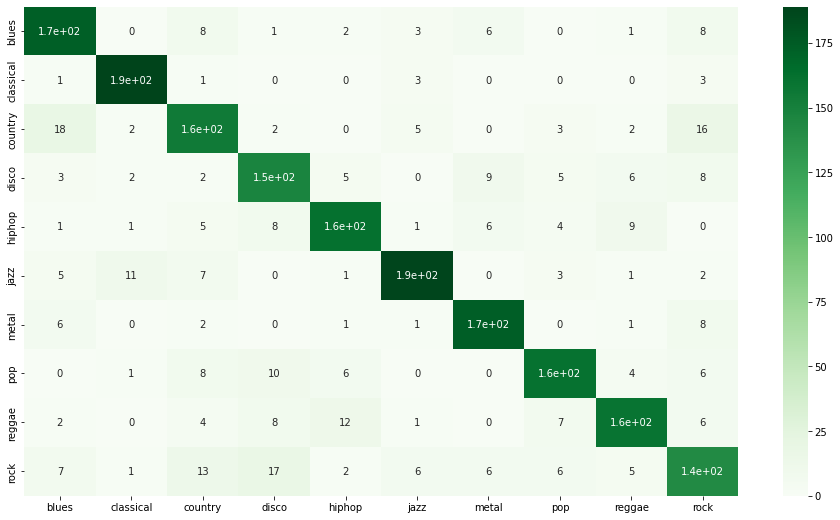

Accuracy score of SVM rbf kernel c=20 is: 0.86


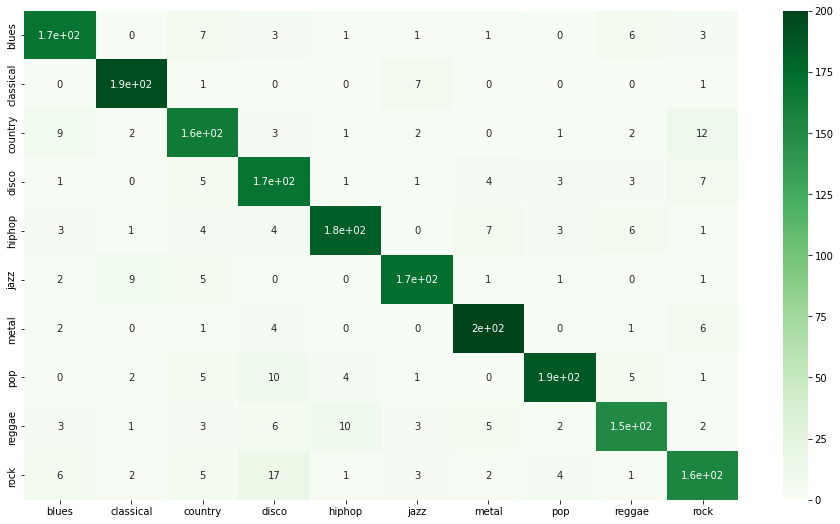

Accuracy score of SVM rbf kernel c=30 is: 0.88


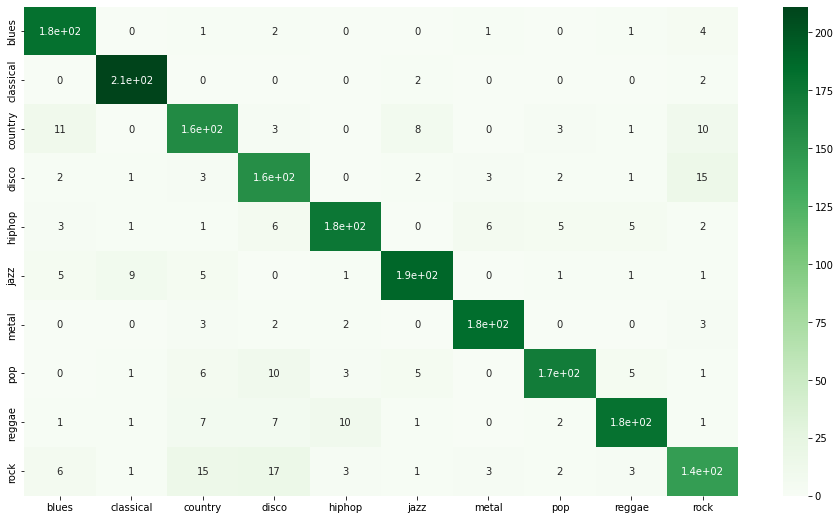

Accuracy score of SVM rbf kernel c=40 is: 0.88


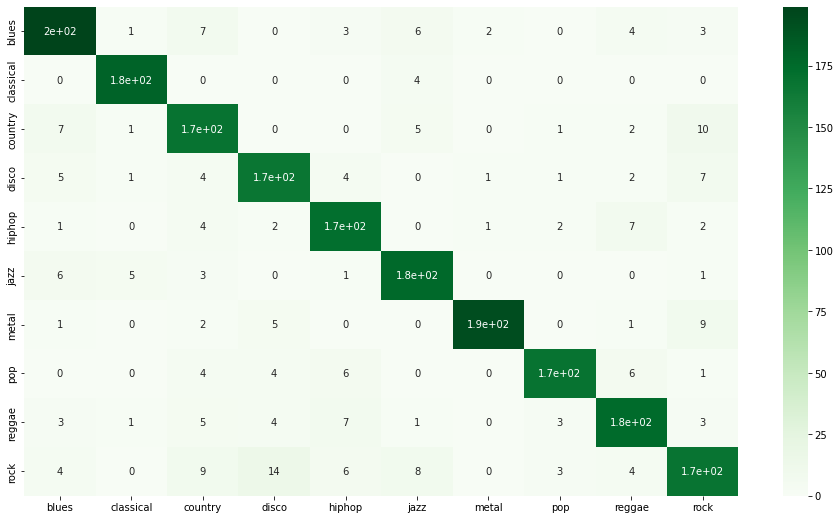

Accuracy score of SVM rbf kernel c=50 is: 0.89


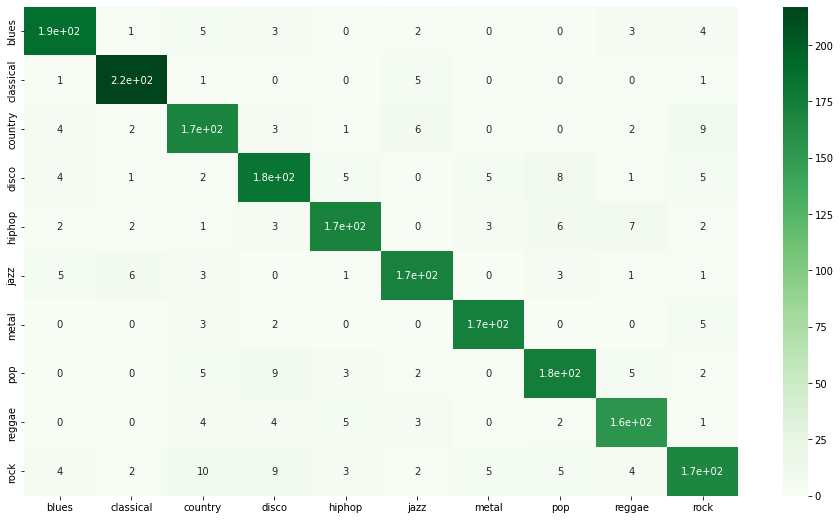

Accuracy score of SVM rbf kernel c=60 is: 0.89


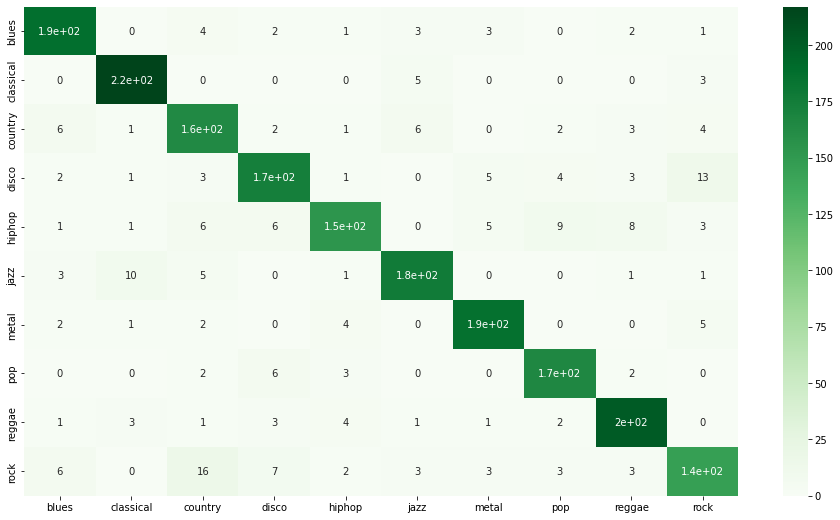

Accuracy score of SVM rbf kernel c=70 is: 0.9


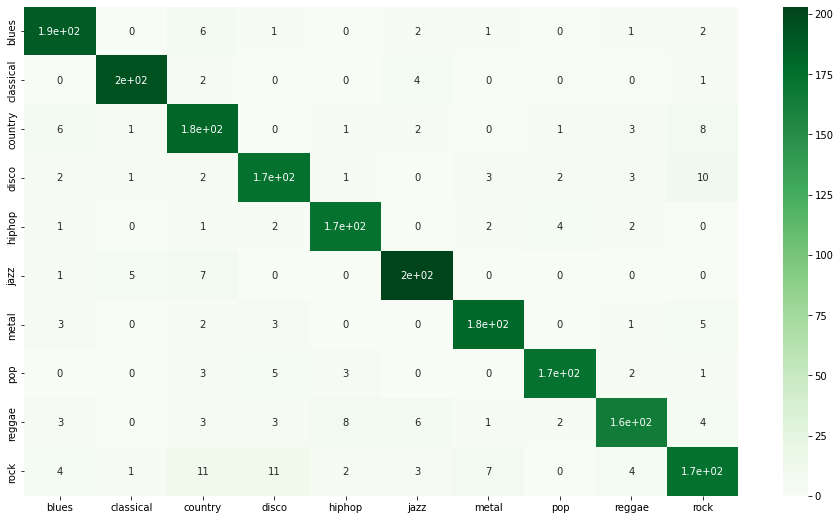

Accuracy score of SVM rbf kernel c=80 is: 0.9


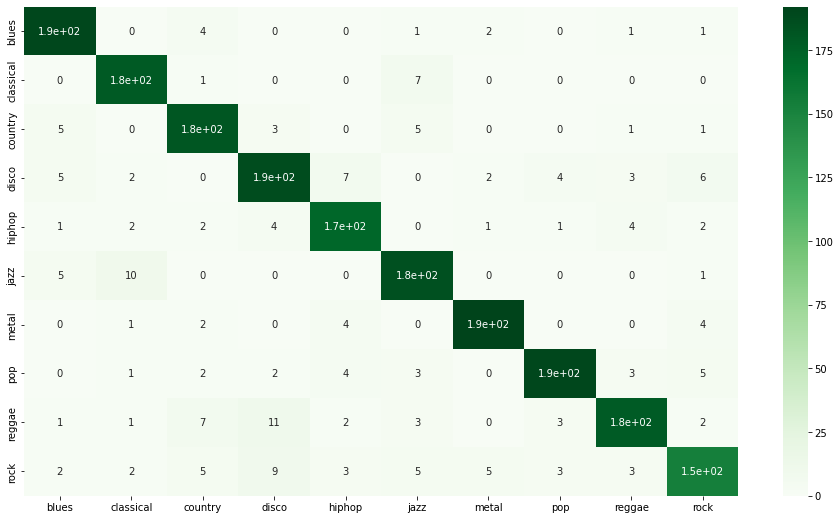

Accuracy score of SVM rbf kernel c=90 is: 0.9


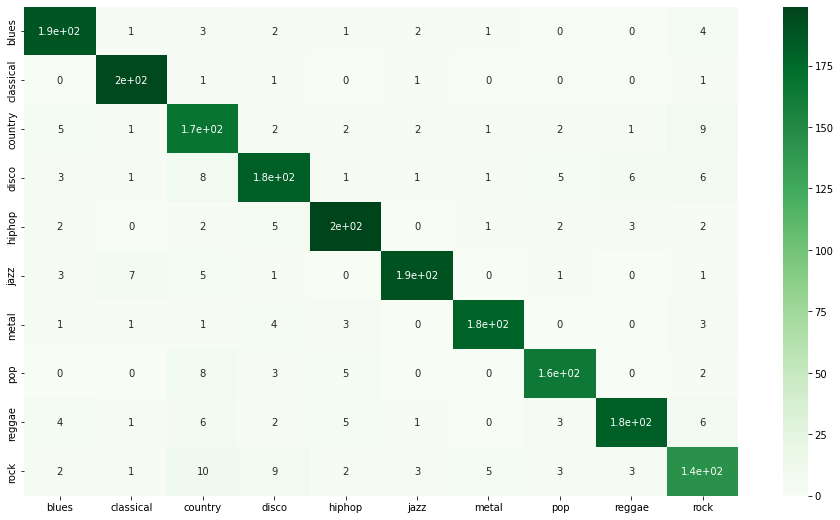

Accuracy score of SVM rbf kernel c=100 is: 0.9


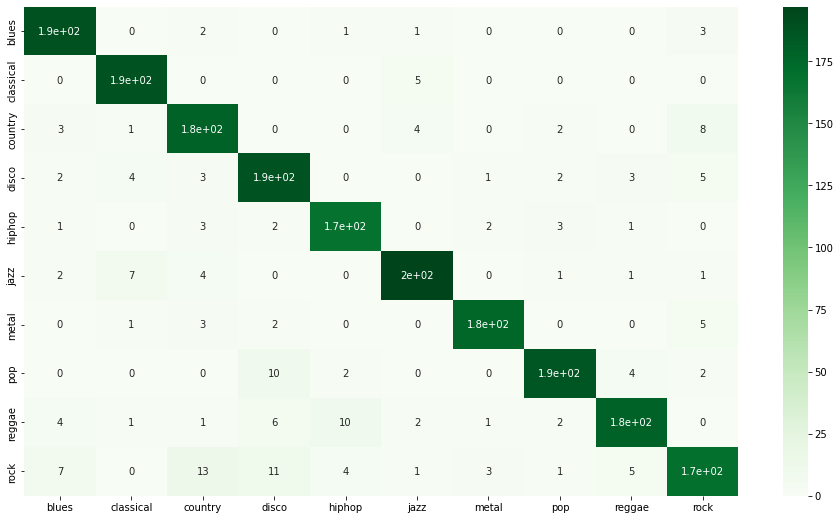

In [99]:
for i in range(10,101,10):
    model = SVC(C=i,kernel='rbf',random_state=0)
    model_build(model, split, "SVM rbf kernel c=" + str(i))

Accuracy score of SVM rbf kernel c=100 is: 0.9


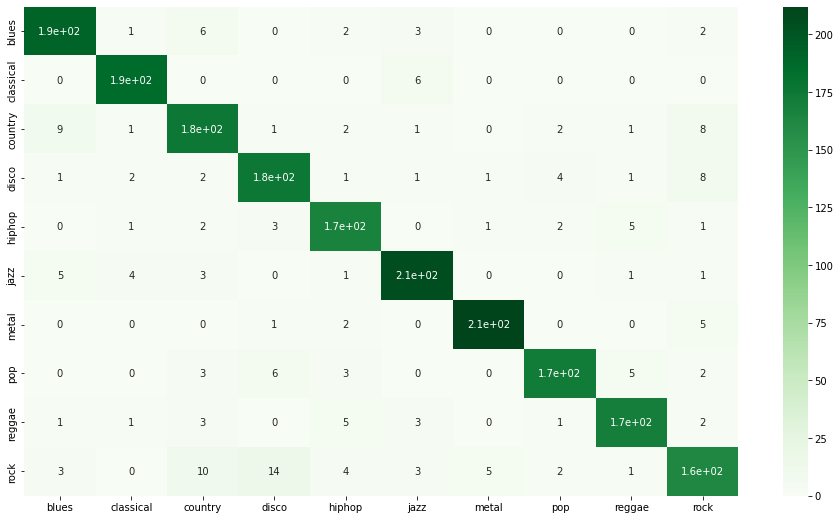

Accuracy score of SVM rbf kernel c=200 is: 0.9


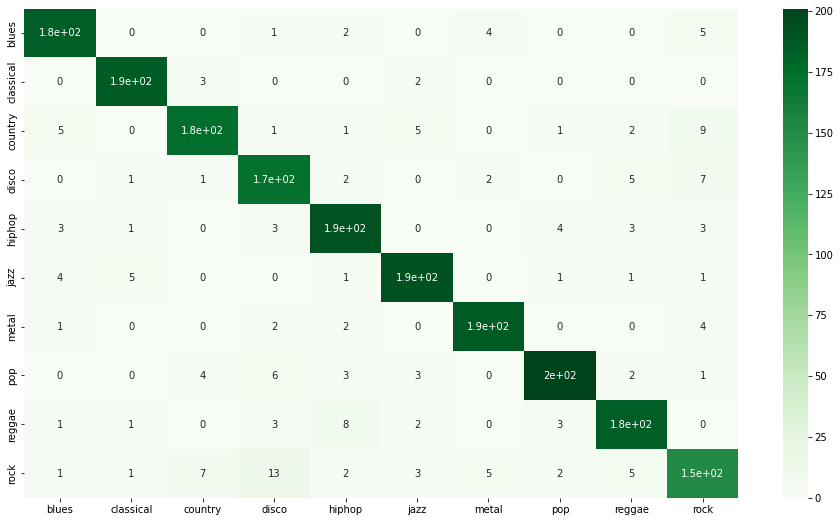

Accuracy score of SVM rbf kernel c=300 is: 0.9


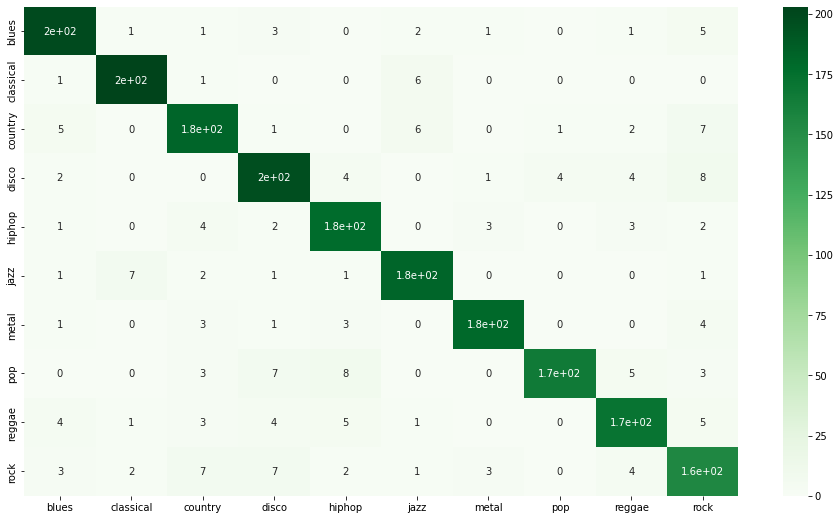

Accuracy score of SVM rbf kernel c=400 is: 0.91


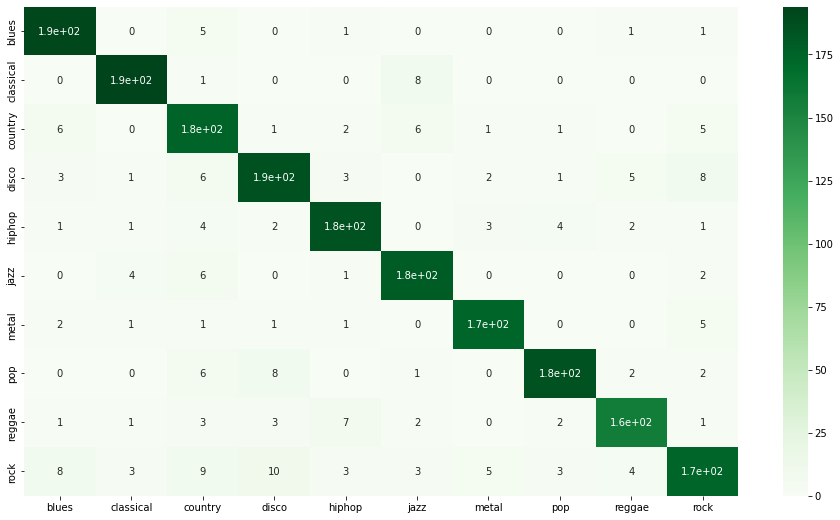

Accuracy score of SVM rbf kernel c=500 is: 0.9


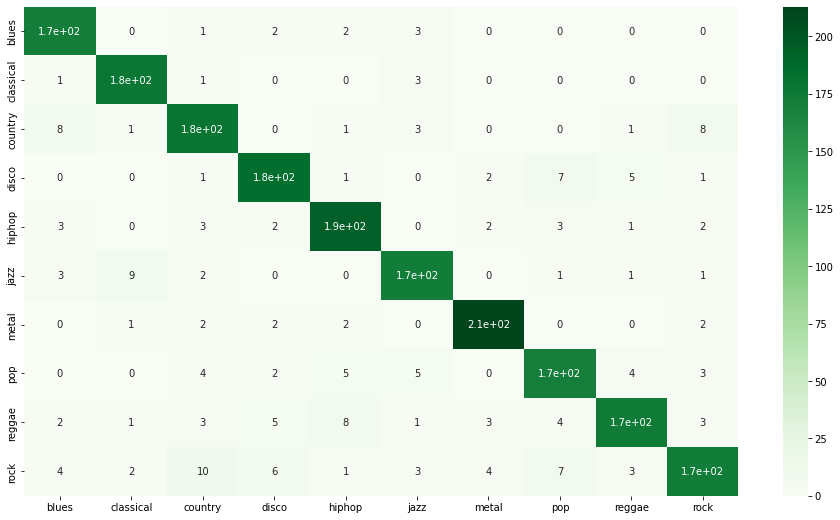

Accuracy score of SVM rbf kernel c=600 is: 0.9


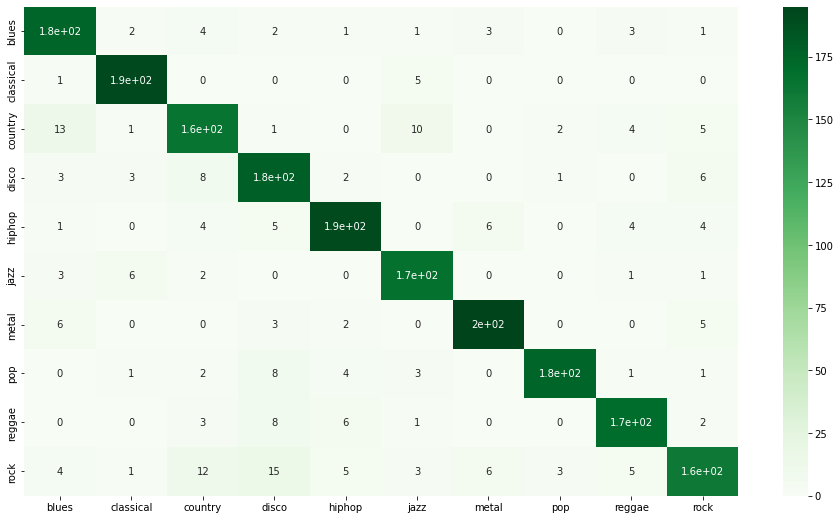

Accuracy score of SVM rbf kernel c=700 is: 0.9


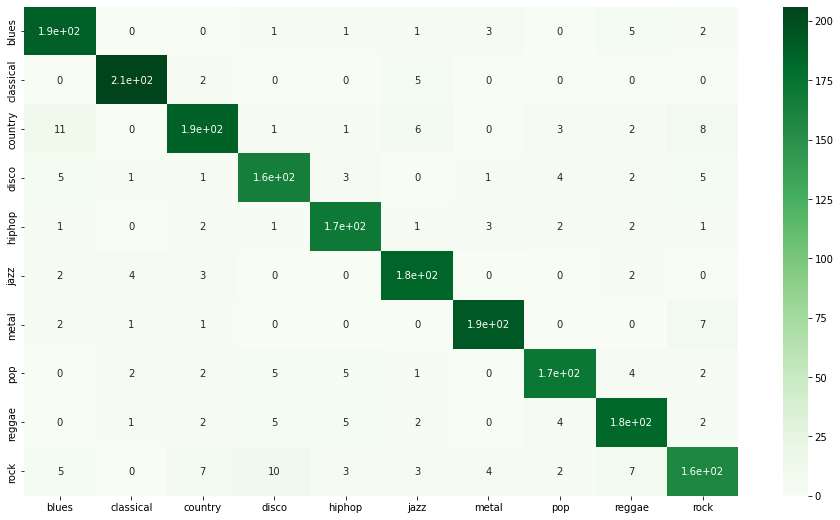

Accuracy score of SVM rbf kernel c=800 is: 0.9


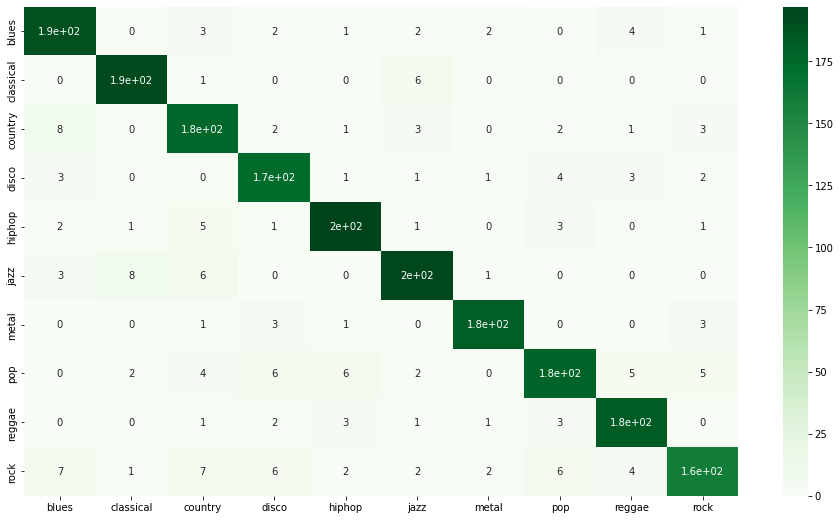

Accuracy score of SVM rbf kernel c=900 is: 0.9


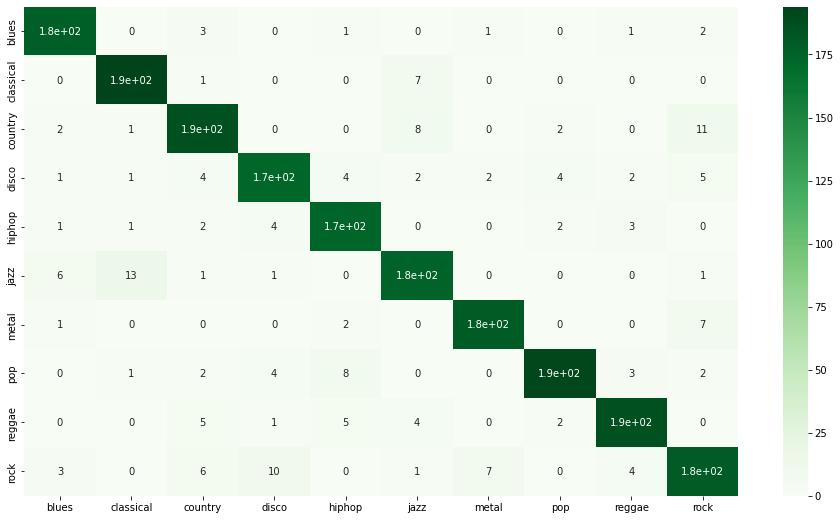

Accuracy score of SVM rbf kernel c=1000 is: 0.9


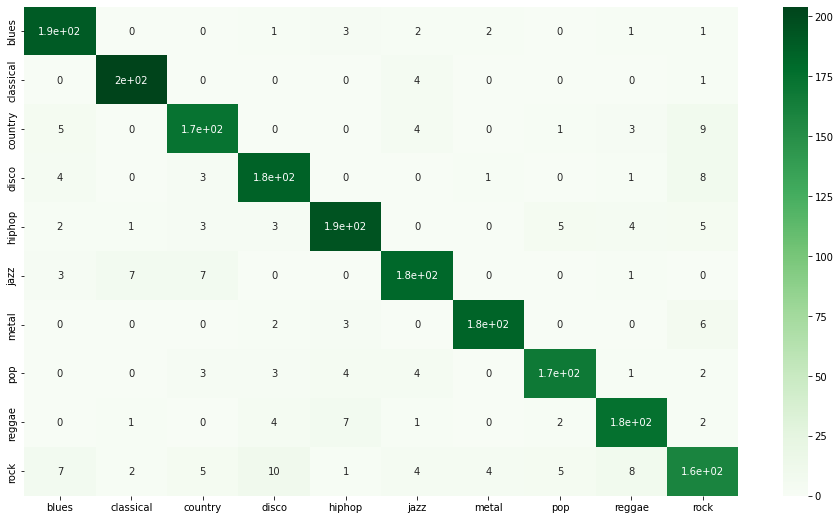

In [100]:
for i in range(100,1001,100):
    model = SVC(C=i,kernel='rbf',random_state=0)
    model_build(model, split, "SVM rbf kernel c=" + str(i))

Accuracy score of SVM sigmoid kernel is: 0.15


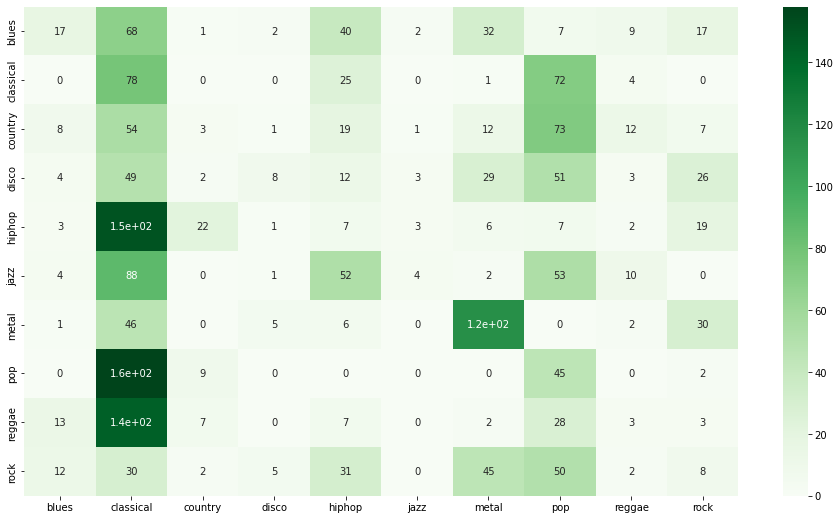

In [101]:
model = SVC(C=1.0,kernel='sigmoid',random_state=0)
model_build(model, split, "SVM sigmoid kernel")

Accuracy score of SVM poly d=6 kernel 0.1 is: 0.86


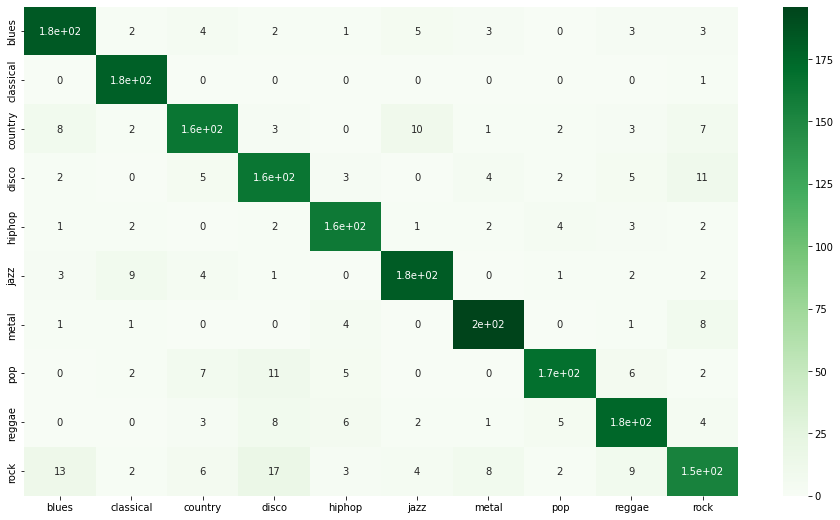

Accuracy score of SVM poly d=6 kernel 0.2 is: 0.88


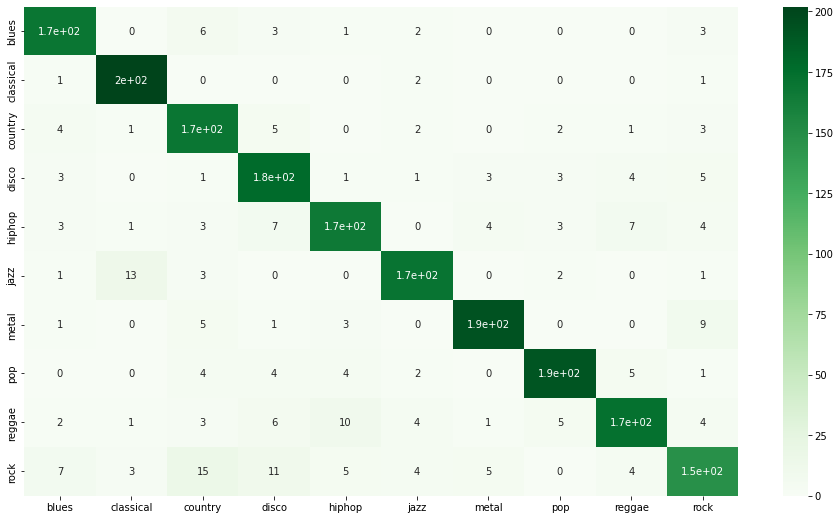

Accuracy score of SVM poly d=6 kernel 0.3 is: 0.88


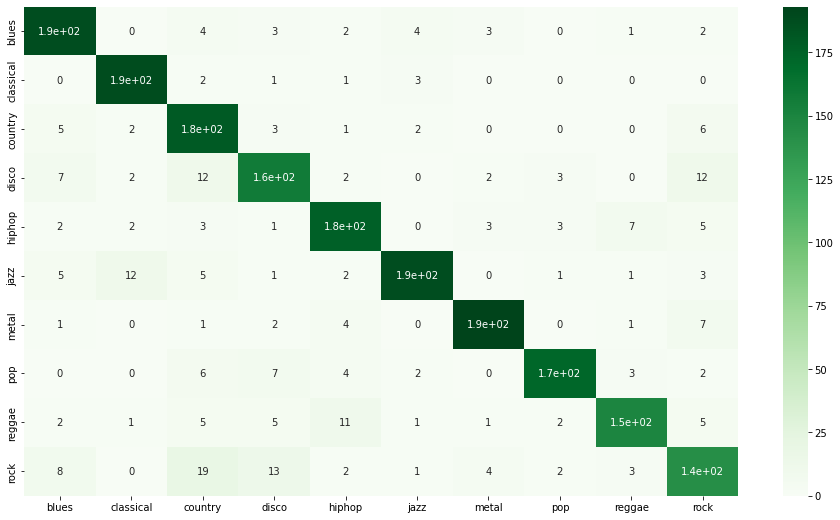

Accuracy score of SVM poly d=6 kernel 0.4 is: 0.89


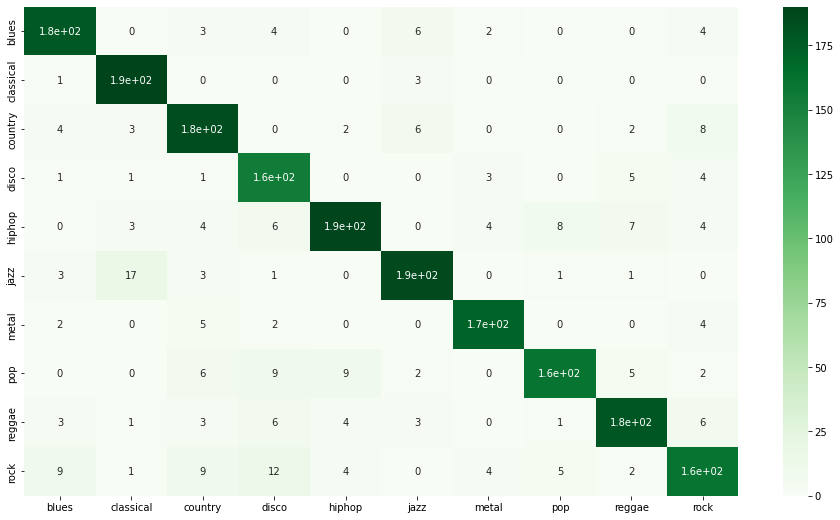

Accuracy score of SVM poly d=6 kernel 0.5 is: 0.89


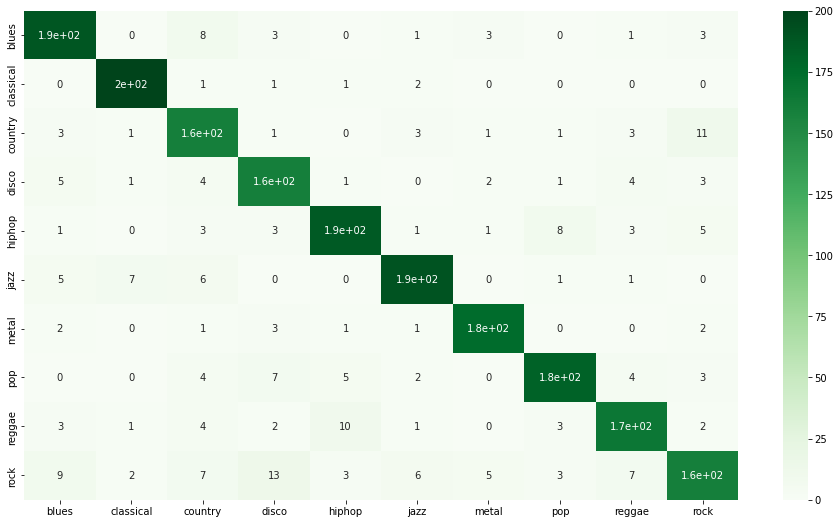

Accuracy score of SVM poly d=6 kernel 0.6 is: 0.89


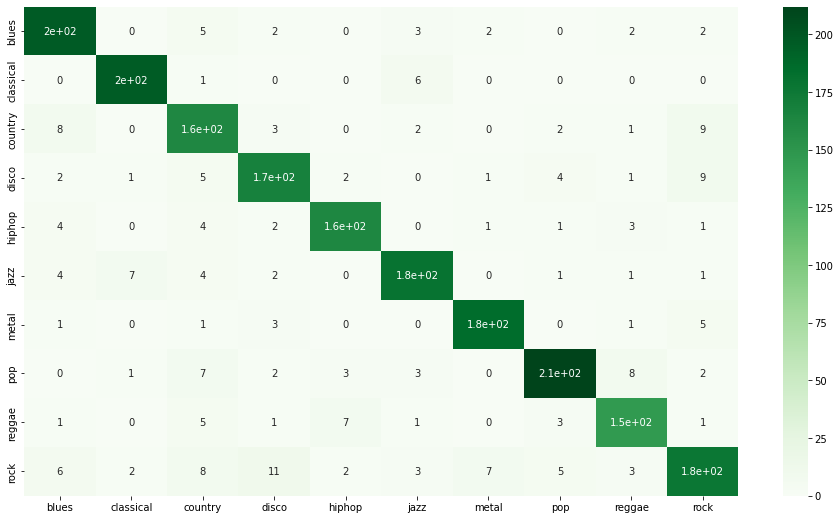

Accuracy score of SVM poly d=6 kernel 0.7 is: 0.89


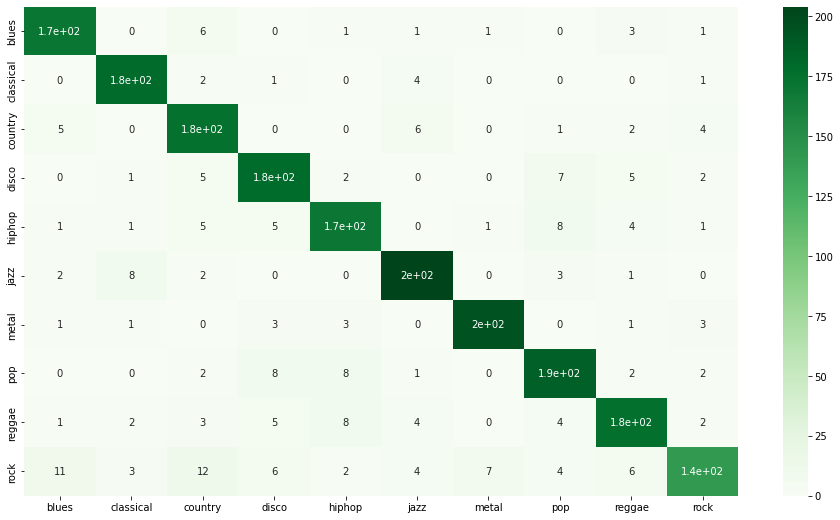

Accuracy score of SVM poly d=6 kernel 0.8 is: 0.89


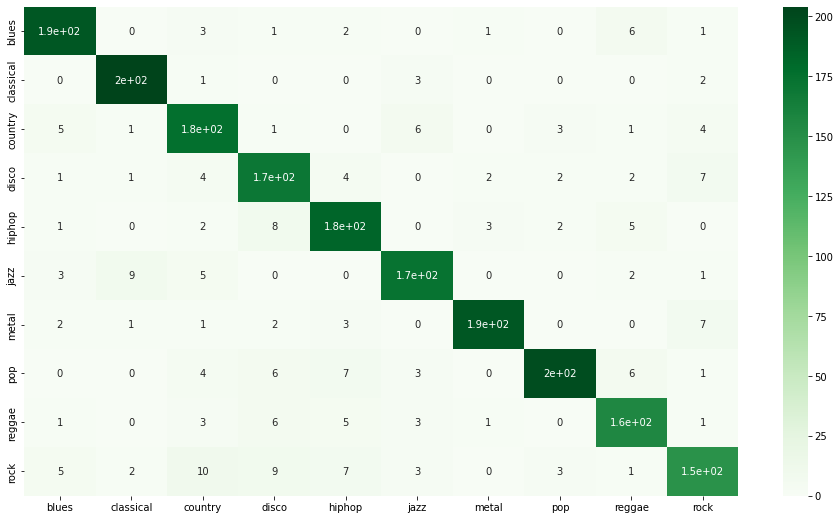

Accuracy score of SVM poly d=6 kernel 0.9 is: 0.89


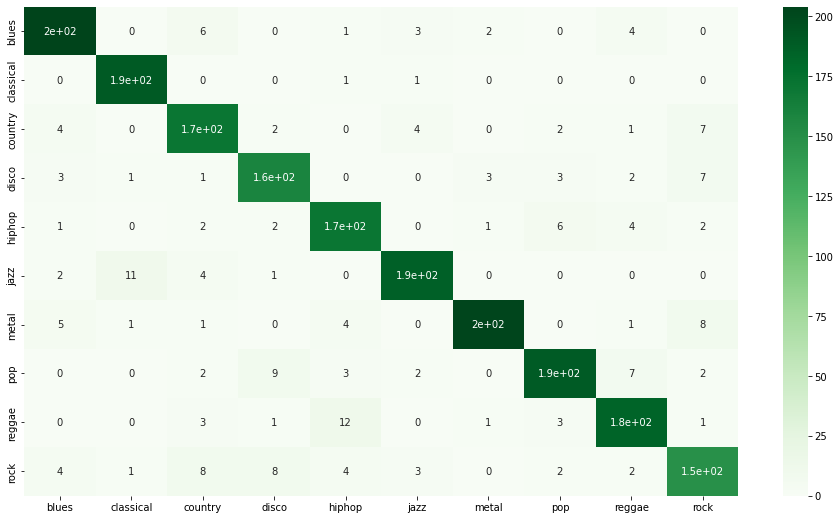

Accuracy score of SVM poly d=6 kernel 1.0 is: 0.89


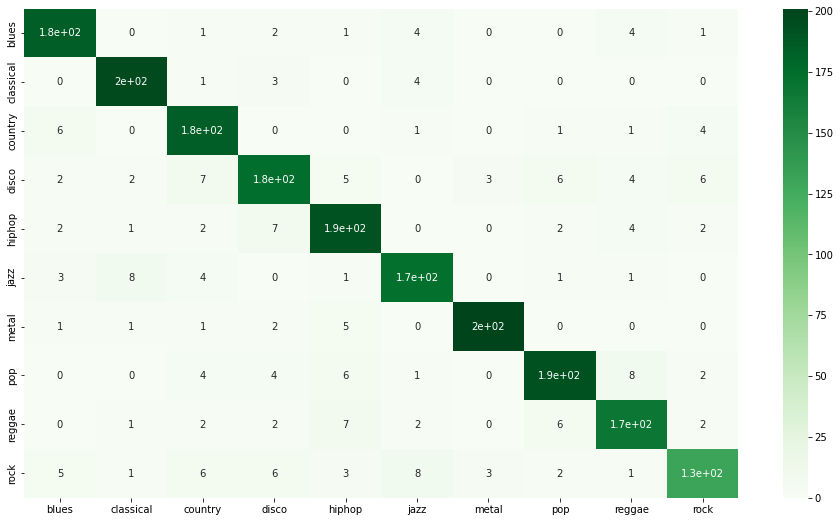

In [103]:
for i in range(1,11):
    c = i/10.0
    model = SVC(C=c,kernel='poly',degree=6,random_state=0)
    model_build(model,split, "SVM poly d=6 kernel " + str(c))

Accuracy score of SVM poly deg=6 kernel 1 is: 0.89


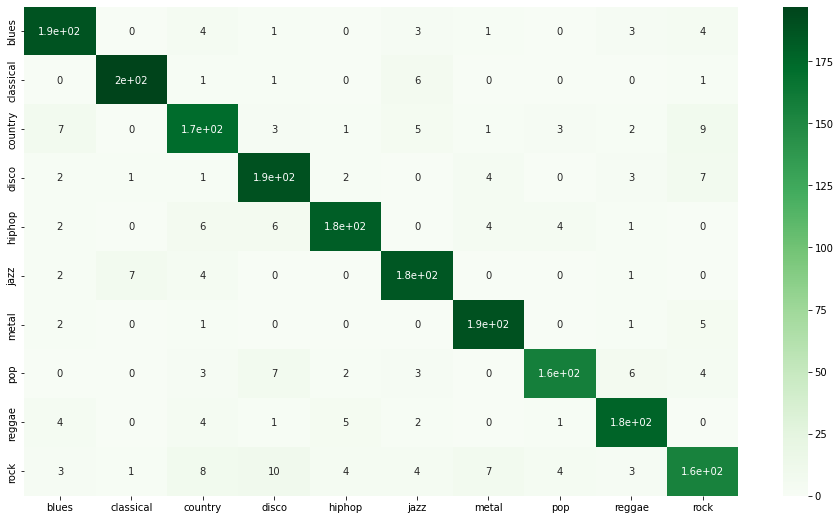

Accuracy score of SVM poly deg=6 kernel 2 is: 0.89


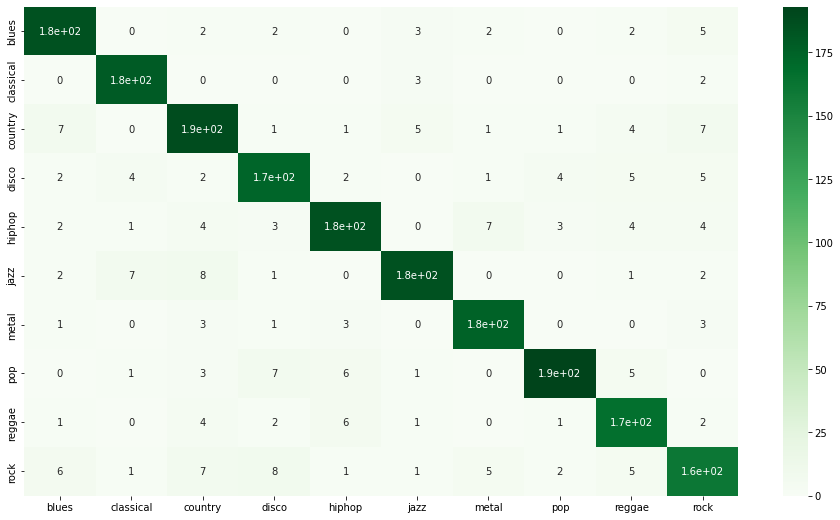

Accuracy score of SVM poly deg=6 kernel 3 is: 0.89


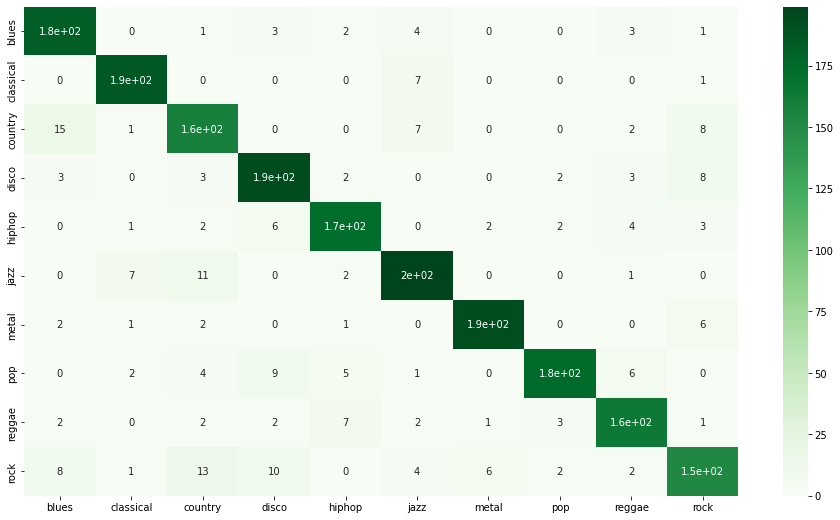

In [104]:
for i in range(1,4):
    c = i
    model = SVC(C=c,kernel='poly',degree=6,random_state=0)
    model_build(model,split, "SVM poly deg=6 kernel " + str(c))

Accuracy score of SVM sigmoid kernel is: 0.74


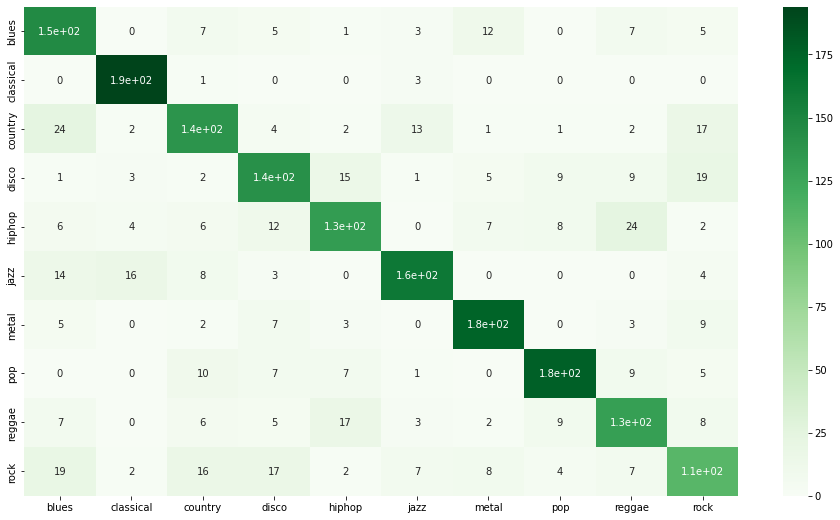

In [105]:
model = SVC(C=160,kernel='sigmoid',random_state=0,gamma=0.03)
model_build(model, split, "SVM sigmoid kernel")

Accuracy score of SVM rbf kernel c=200  is: 0.91


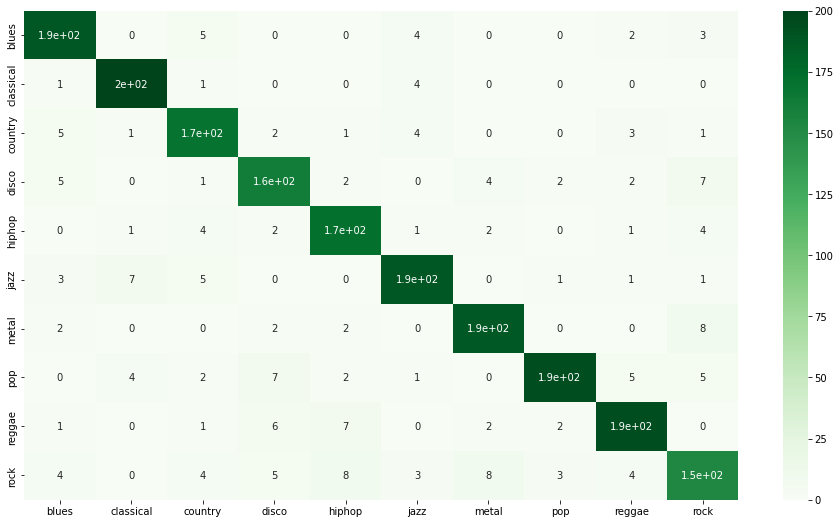

In [106]:
model = SVC(C=200,kernel='rbf',random_state=0)
model_build(model,split, "SVM rbf kernel c=200 ")

Accuracy score of SVM rbf kernel c=200 gamma=0.01 is: 0.75


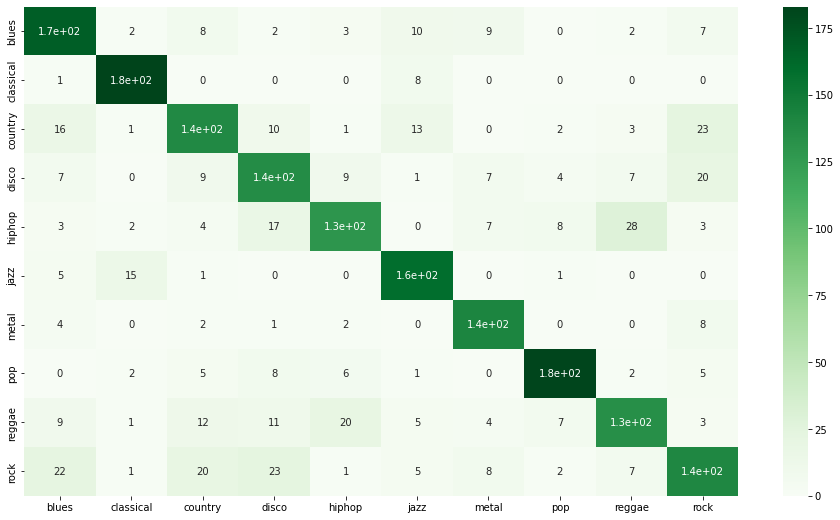

Accuracy score of SVM rbf kernel c=200 gamma=0.02 is: 0.77


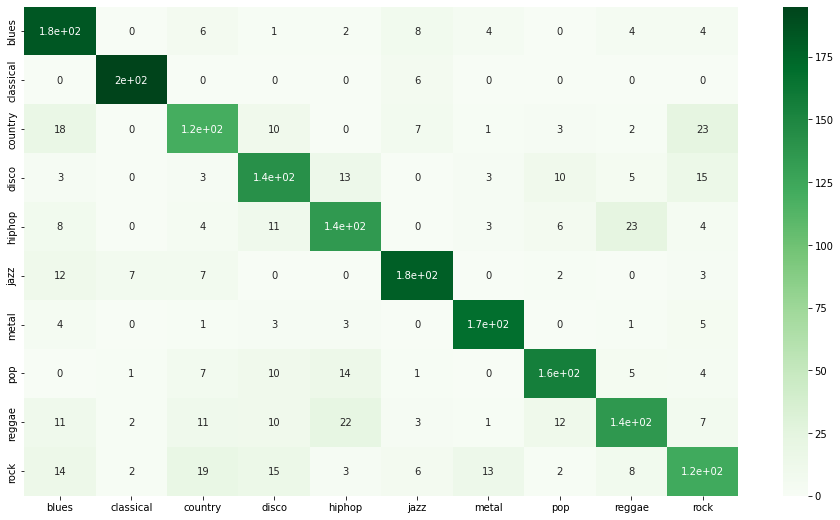

Accuracy score of SVM rbf kernel c=200 gamma=0.03 is: 0.79


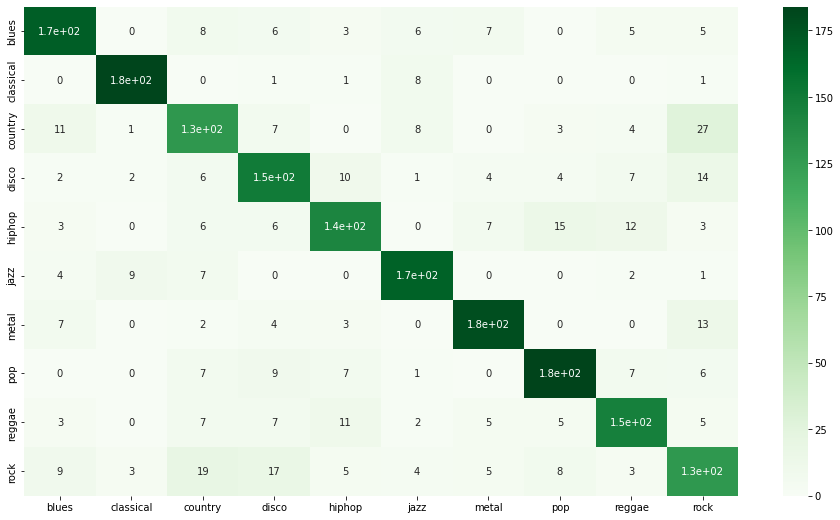

Accuracy score of SVM rbf kernel c=200 gamma=0.04 is: 0.8


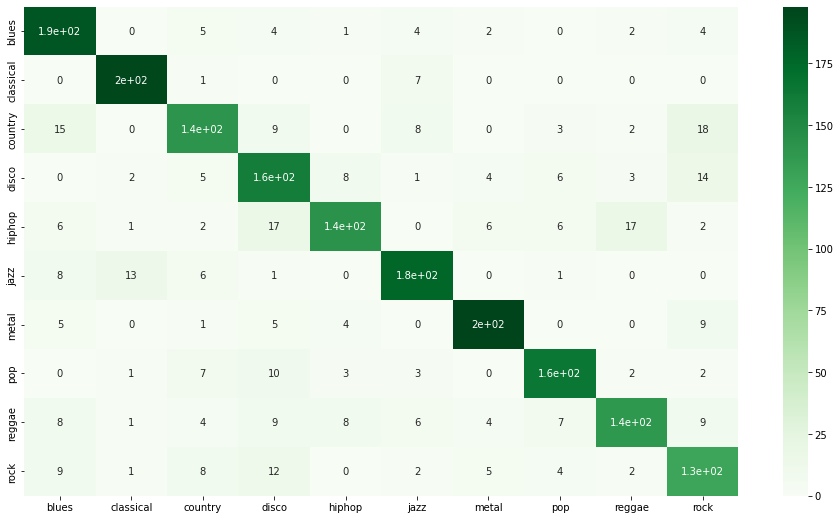

Accuracy score of SVM rbf kernel c=200 gamma=0.05 is: 0.81


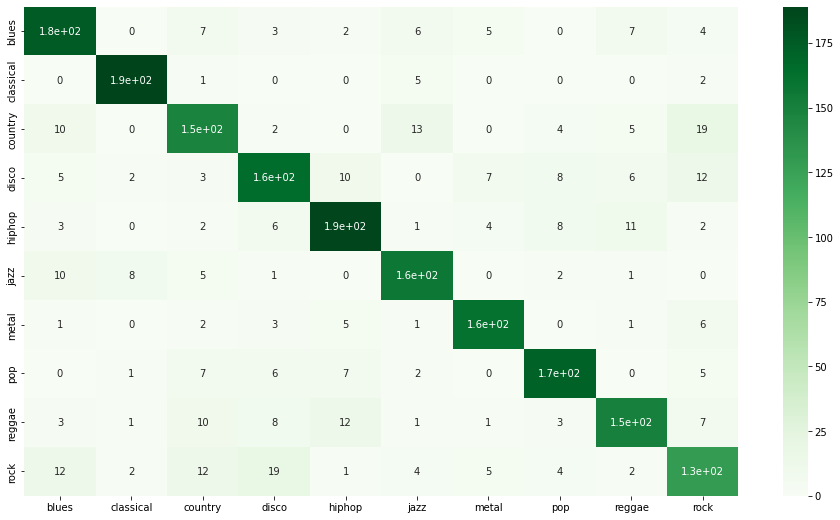

Accuracy score of SVM rbf kernel c=200 gamma=0.06 is: 0.83


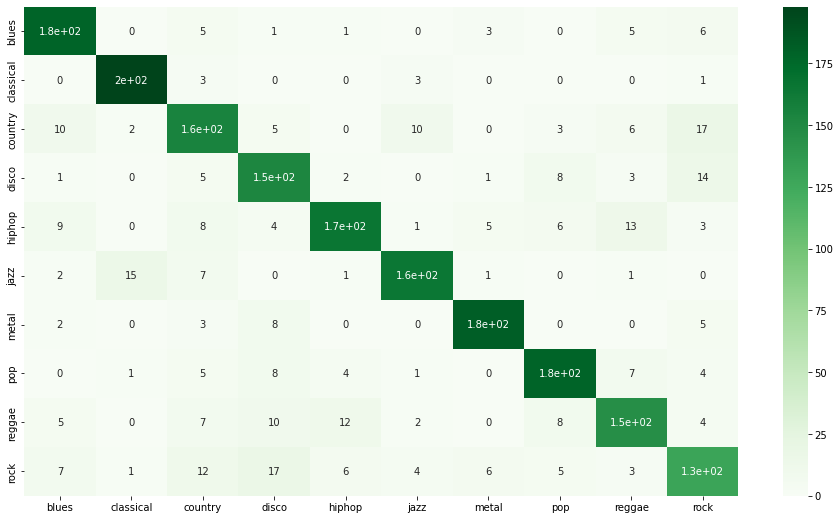

Accuracy score of SVM rbf kernel c=200 gamma=0.07 is: 0.84


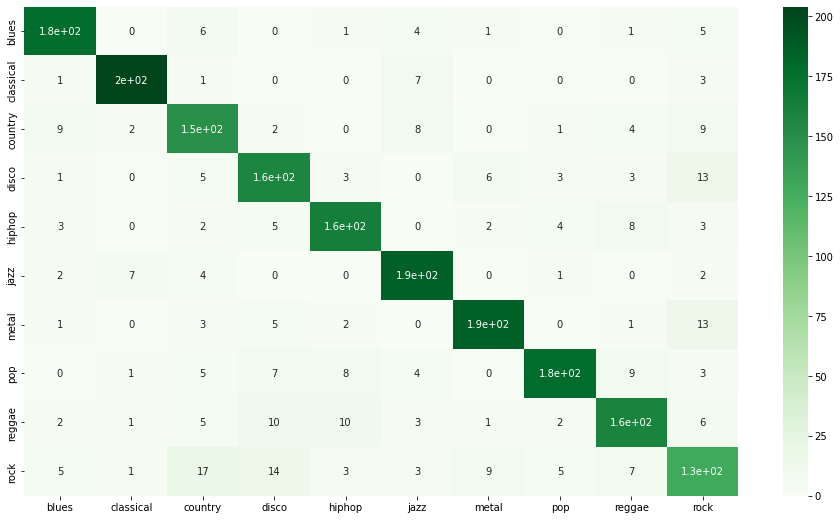

Accuracy score of SVM rbf kernel c=200 gamma=0.08 is: 0.84


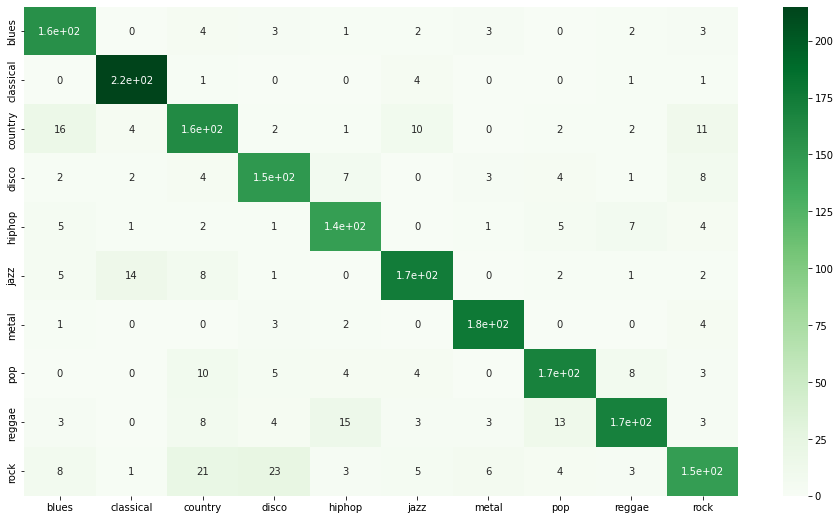

Accuracy score of SVM rbf kernel c=200 gamma=0.09 is: 0.85


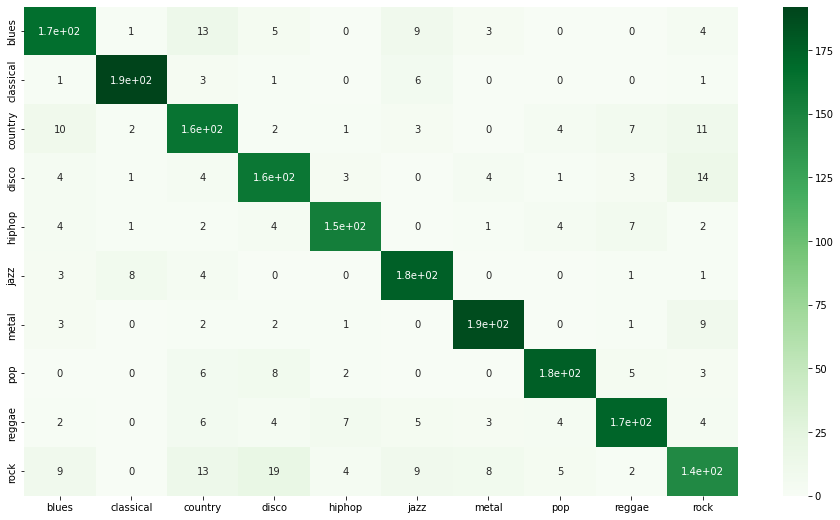

Accuracy score of SVM rbf kernel c=200 gamma=0.1 is: 0.85


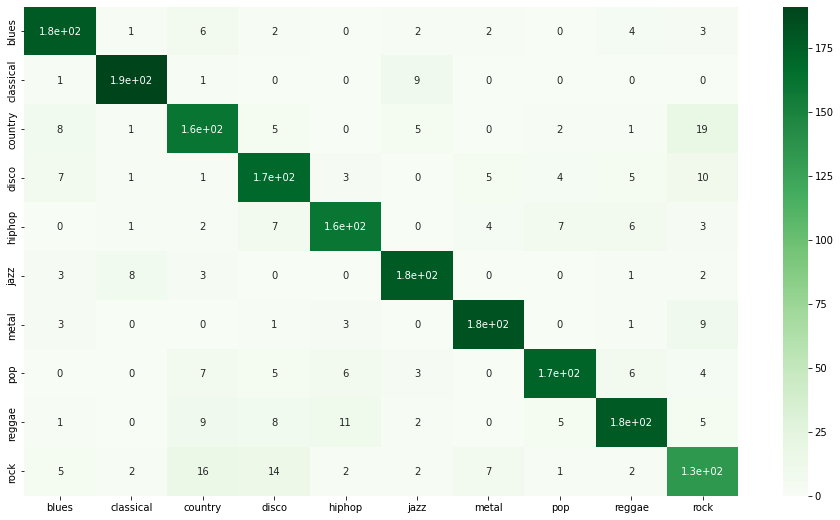

Accuracy score of SVM rbf kernel c=200 gamma=0.2 is: 0.89


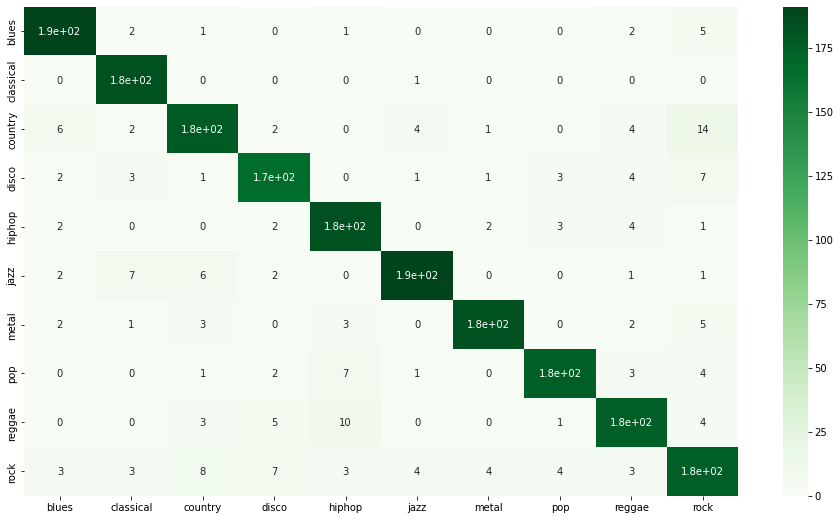

Accuracy score of SVM rbf kernel c=200 gamma=0.3 is: 0.9


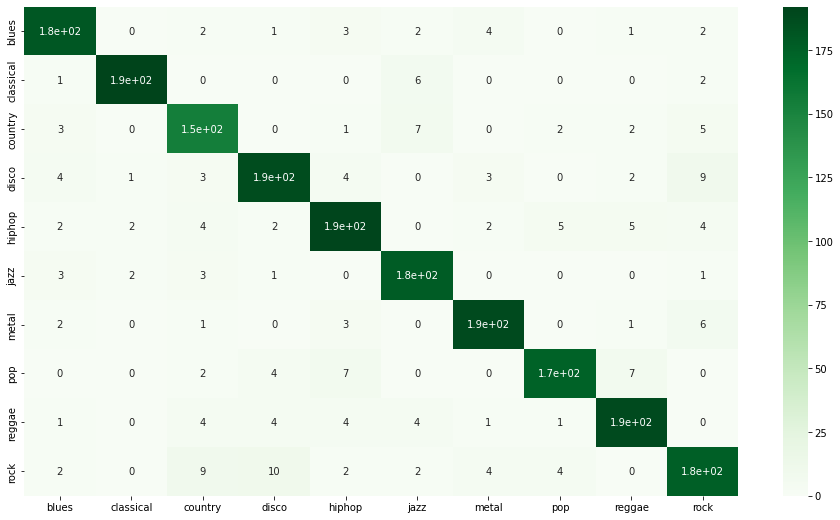

Accuracy score of SVM rbf kernel c=200 gamma=0.4 is: 0.91


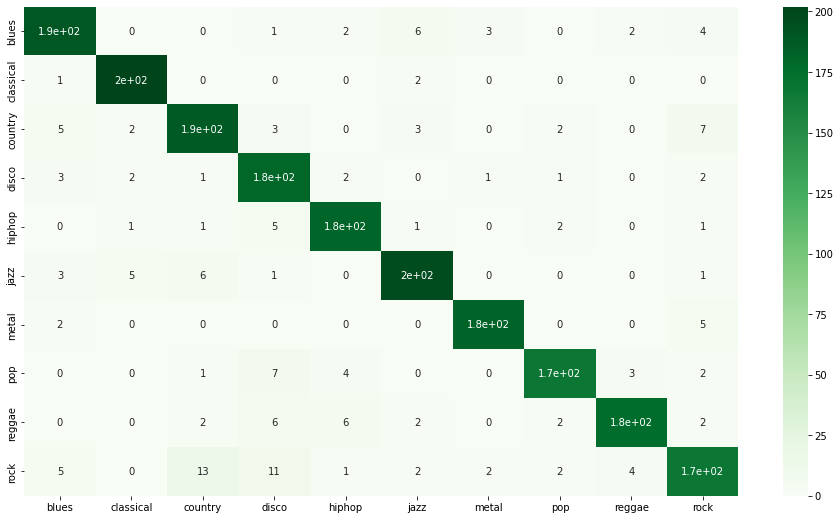

Accuracy score of SVM rbf kernel c=200 gamma=0.5 is: 0.91


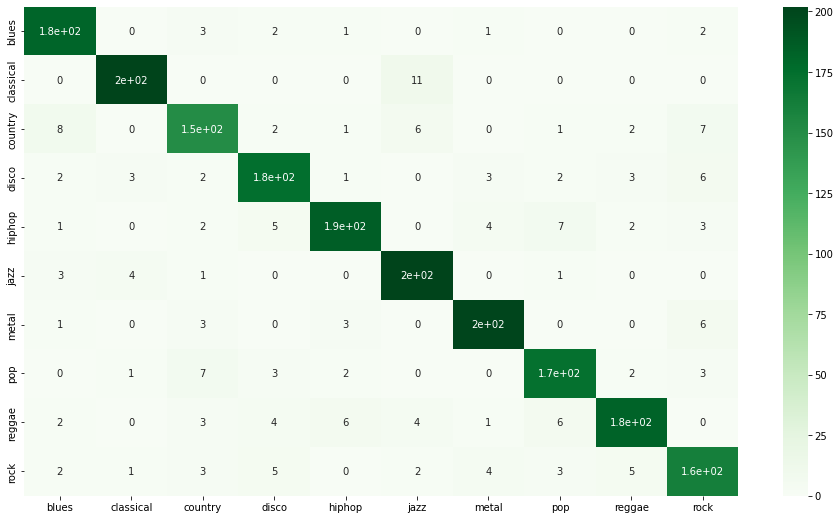

Accuracy score of SVM rbf kernel c=200 gamma=0.6 is: 0.91


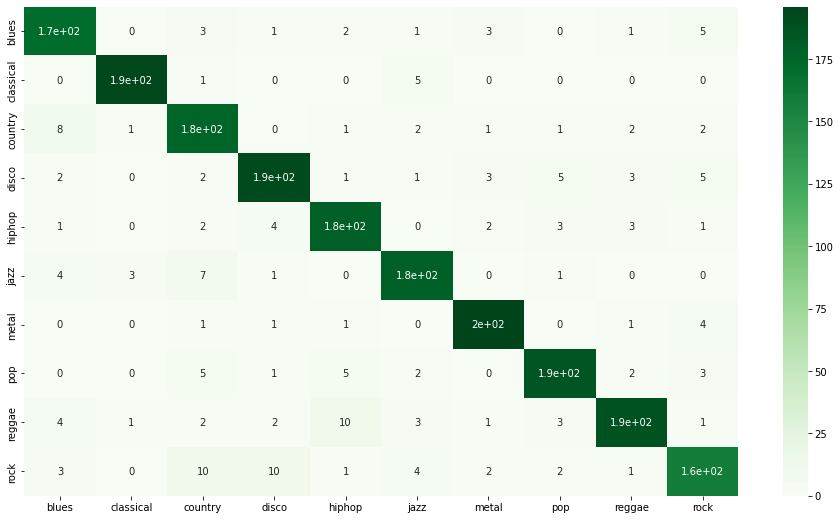

Accuracy score of SVM rbf kernel c=200 gamma=0.7 is: 0.92


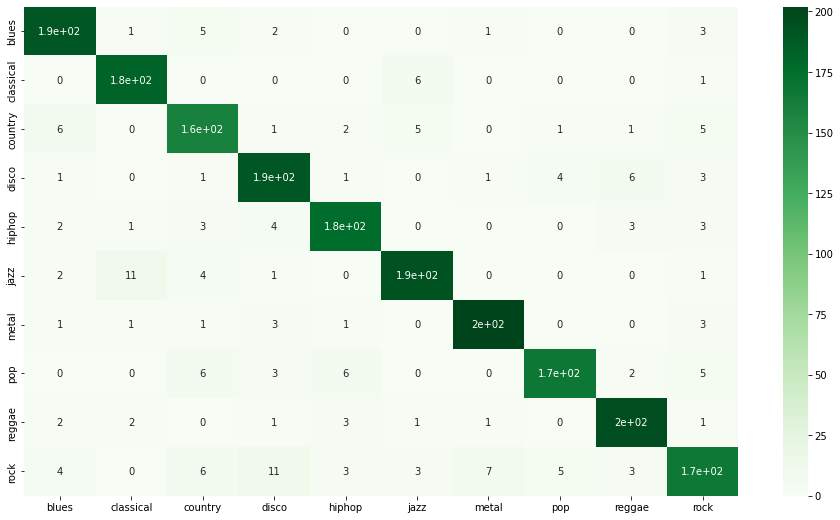

Accuracy score of SVM rbf kernel c=200 gamma=0.8 is: 0.92


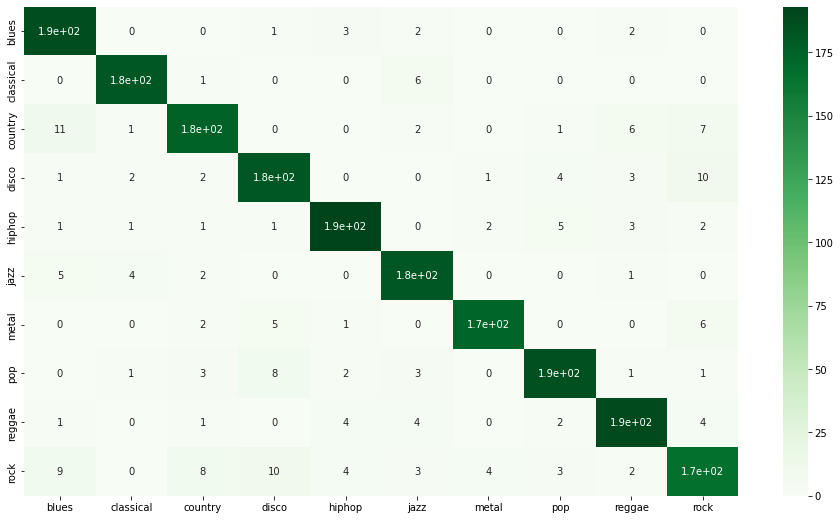

Accuracy score of SVM rbf kernel c=200 gamma=0.9 is: 0.92


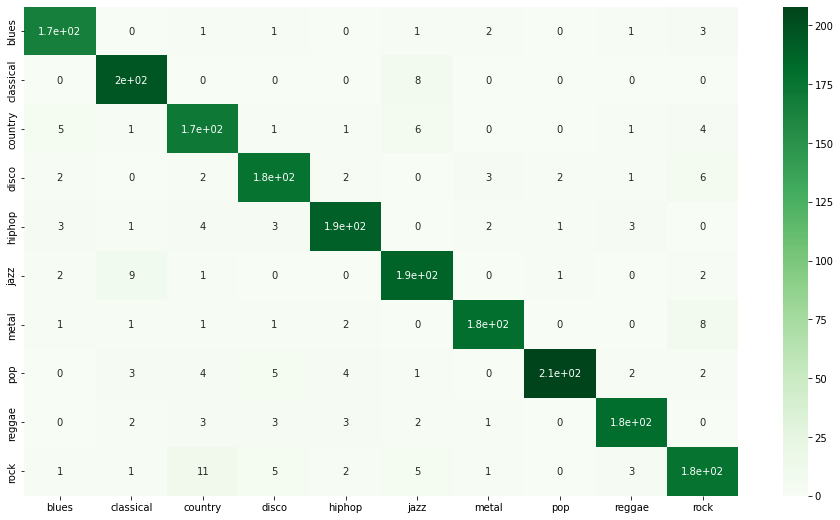

Accuracy score of SVM rbf kernel c=200 gamma=1.0 is: 0.92


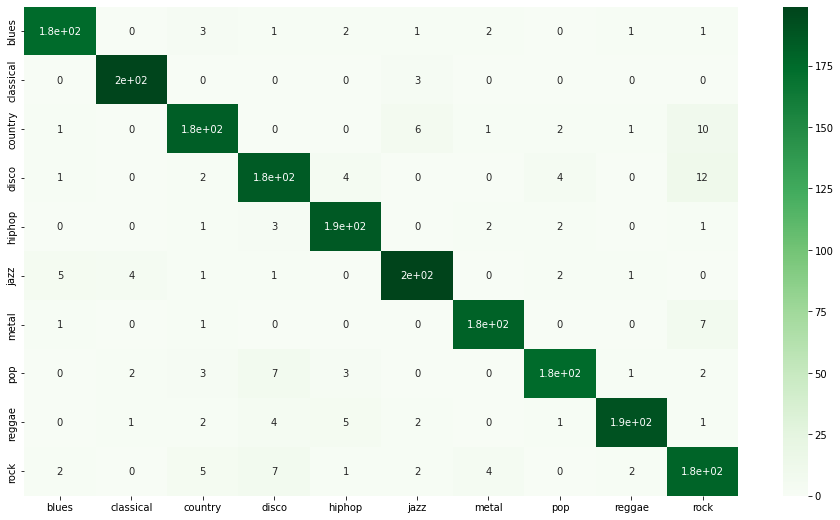

In [107]:
for i in range(1,10):
    model = SVC(C=200,kernel='rbf',random_state=0,gamma=i/100)
    model_build(model, split, "SVM rbf kernel c=200 gamma=" + str(i/100))
for i in range(1,11):
    model = SVC(C=200,kernel='rbf',random_state=0,gamma=i/10)
    model_build(model,split, "SVM rbf kernel c=200 gamma=" + str(i/10))

Accuracy score of SVM rbf kernel c=200 gamma=1 is: 0.92


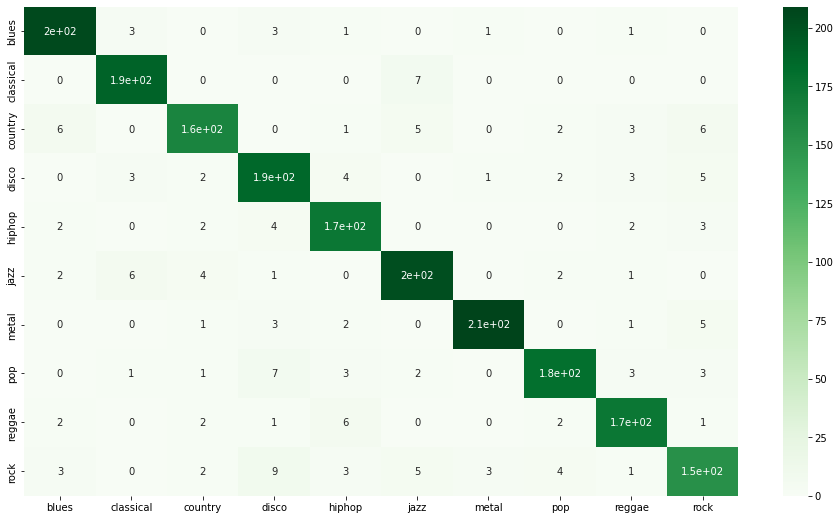

Accuracy score of SVM rbf kernel c=200 gamma=2 is: 0.93


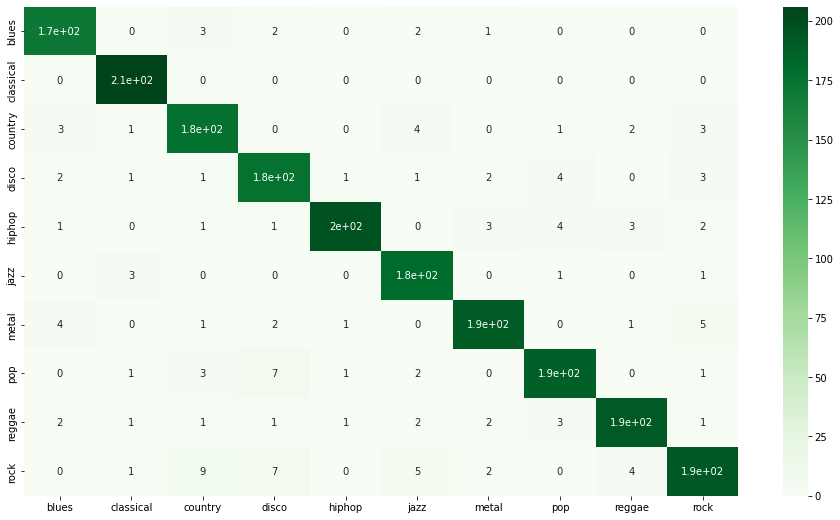

Accuracy score of SVM rbf kernel c=200 gamma=3 is: 0.94


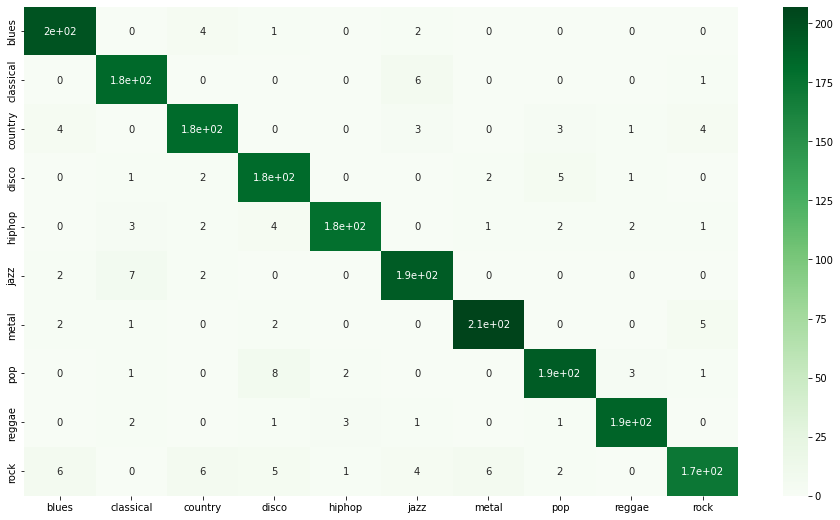

Accuracy score of SVM rbf kernel c=200 gamma=4 is: 0.94


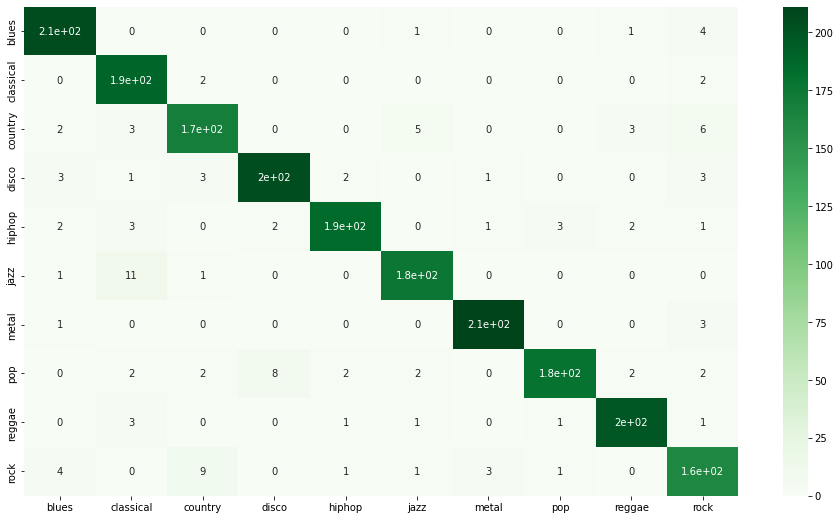

Accuracy score of SVM rbf kernel c=200 gamma=5 is: 0.93


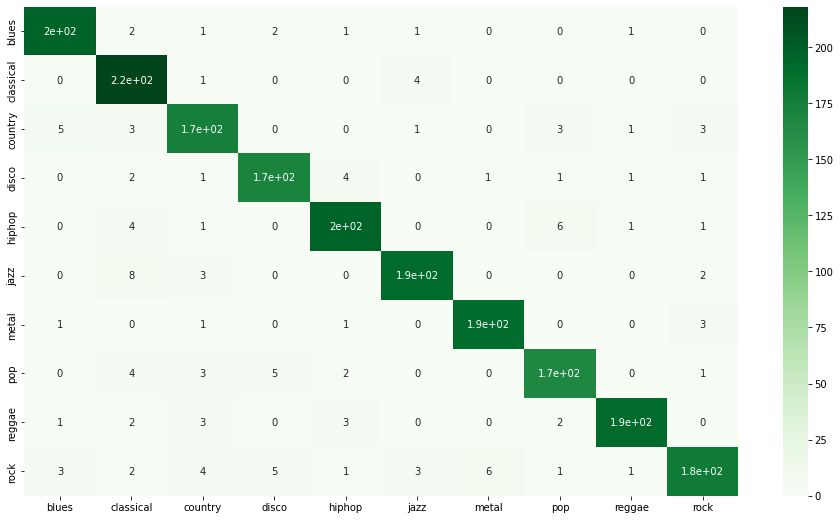

Accuracy score of SVM rbf kernel c=200 gamma=6 is: 0.93


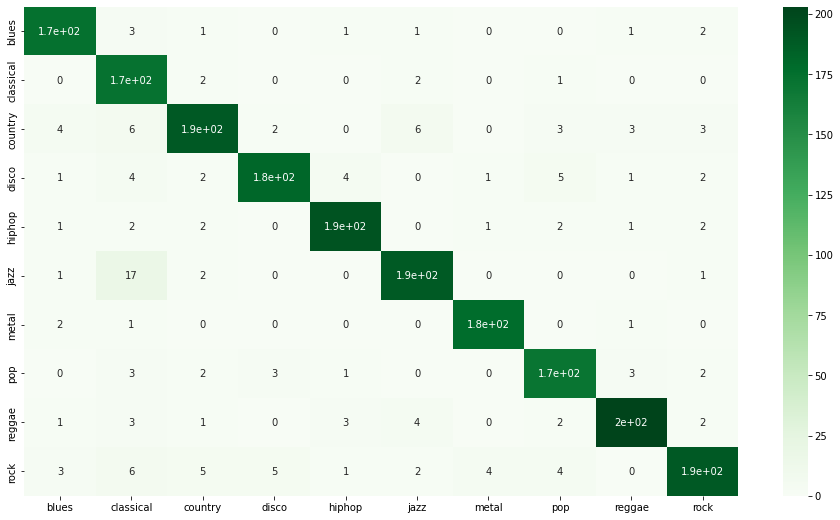

Accuracy score of SVM rbf kernel c=200 gamma=7 is: 0.93


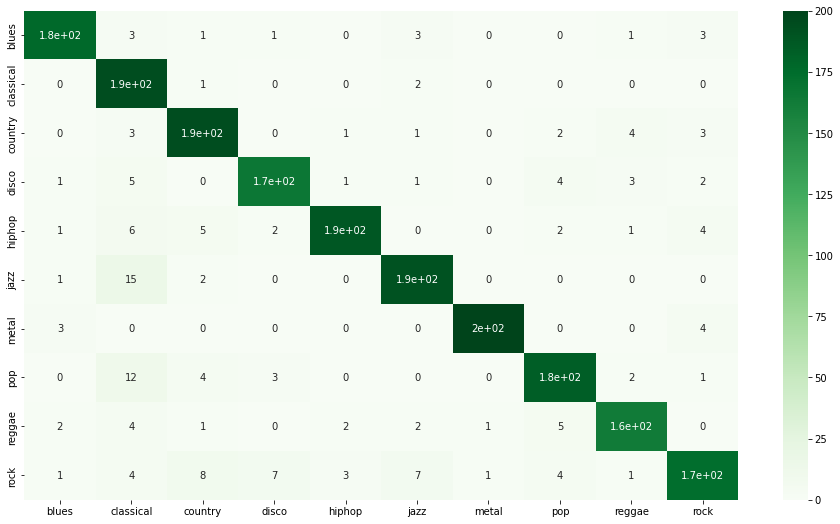

Accuracy score of SVM rbf kernel c=200 gamma=8 is: 0.92


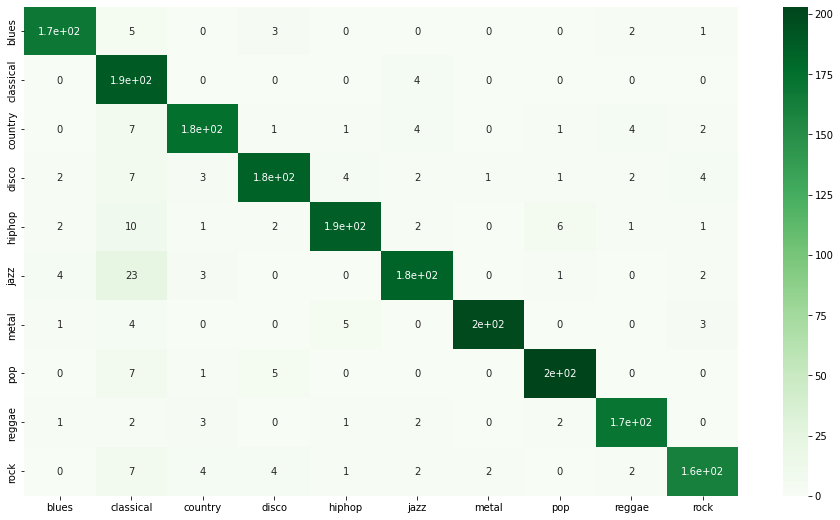

Accuracy score of SVM rbf kernel c=200 gamma=9 is: 0.92


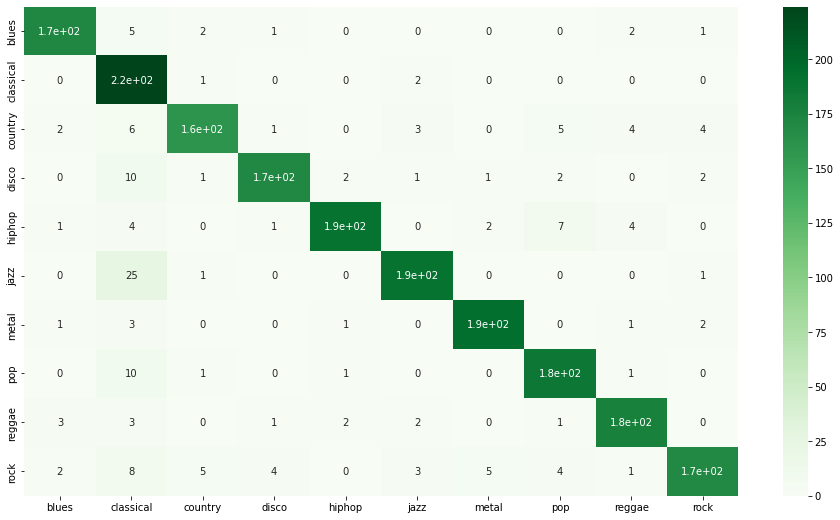

Accuracy score of SVM rbf kernel c=200 gamma=10 is: 0.91


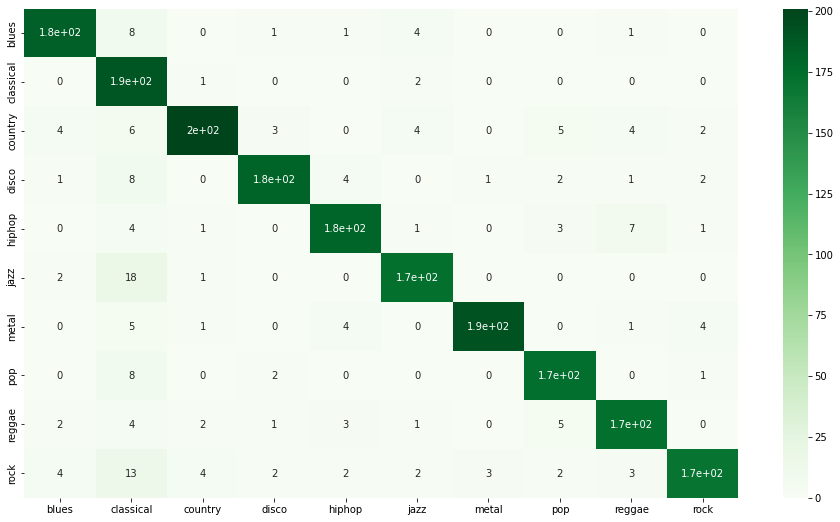

In [108]:
for i in range(1,11):
    model = SVC(C=200,kernel='rbf',random_state=0,gamma=i)
    model_build(model, split, "SVM rbf kernel c=200 gamma=" + str(i))

Accuracy score of SVM rbf kernel c=200 gamma=3 is: 0.94


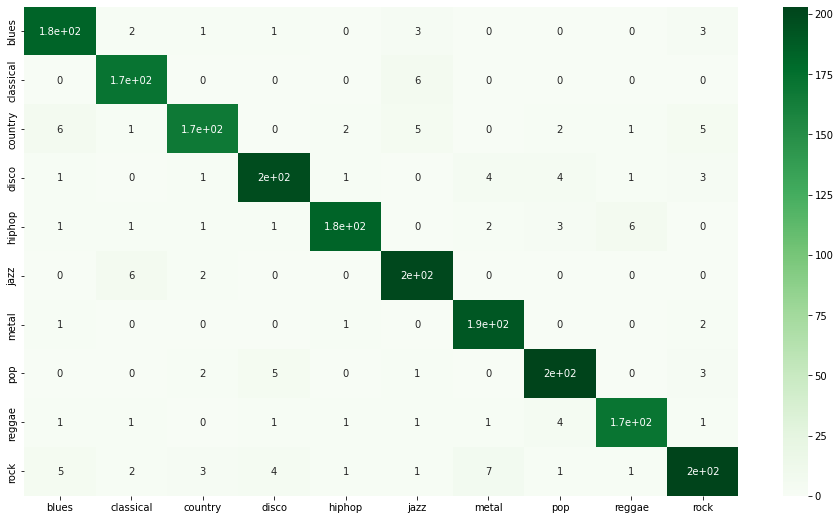

In [109]:
model = SVC(C=200,kernel='rbf',random_state=0,gamma=3)
model_build(model, split, "SVM rbf kernel c=200 gamma=" + str(3))

In [110]:
model.get_params(deep = True)

{'C': 200,
 'break_ties': False,
 'cache_size': 200,
 'class_weight': None,
 'coef0': 0.0,
 'decision_function_shape': 'ovr',
 'degree': 3,
 'gamma': 3,
 'kernel': 'rbf',
 'max_iter': -1,
 'probability': False,
 'random_state': 0,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}

XGB Classifier

Accuracy score of XGB is: 0.91


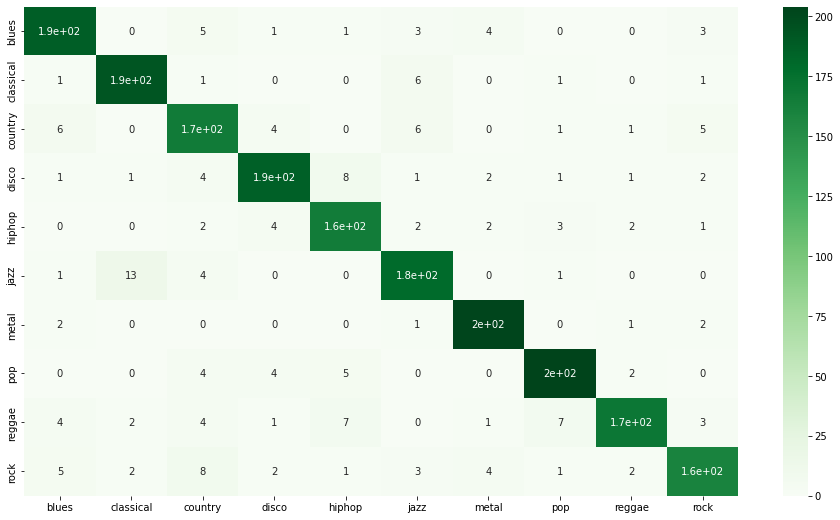

In [89]:
xgb = XGBClassifier(n_estimators=1000, learning_rate=0.05)
model_build(xgb,split,"XGB")

Using CNN model

In [114]:
# building model

model = Sequential()

model.add(Dense(512,input_shape=(X_train.shape[1],),activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(256,activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(128,activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(64,activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(10,activation='softmax'))


model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 512)               30208     
                                                                 
 dropout_4 (Dropout)         (None, 512)               0         
                                                                 
 dense_6 (Dense)             (None, 256)               131328    
                                                                 
 dropout_5 (Dropout)         (None, 256)               0         
                                                                 
 dense_7 (Dense)             (None, 128)               32896     
                                                                 
 dropout_6 (Dropout)         (None, 128)               0         
                                                                 
 dense_8 (Dense)             (None, 64)               

In [115]:
model.compile(loss='sparse_categorical_crossentropy',optimizer='adam',metrics='accuracy')


In [116]:
earlystop = EarlyStopping(monitor='val_loss',mode='min',verbose=1,patience=10,min_delta=0.0001)
modelcheck = ModelCheckpoint('best_model.hdf5',monitor='val_accuracy',verbose=1,save_best_only=True,mode='max')

In [120]:
history = model.fit(X_train,y_train, validation_data=(X_test,y_test), epochs=600, callbacks=[earlystop,modelcheck], batch_size=128)

Epoch 1/600
55/55 [==============================] - ETA: 0s - loss: 2.0204 - accuracy: 0.2605
Epoch 1: val_accuracy improved from -inf to 0.41742, saving model to best_model.hdf5
55/55 [==============================] - 7s 42ms/step - loss: 2.0204 - accuracy: 0.2605 - val_loss: 1.5632 - val_accuracy: 0.4174
Epoch 2/600
52/55 [===========================>..] - ETA: 0s - loss: 1.5535 - accuracy: 0.4198
Epoch 2: val_accuracy improved from 0.41742 to 0.52786, saving model to best_model.hdf5
55/55 [==============================] - 1s 16ms/step - loss: 1.5470 - accuracy: 0.4210 - val_loss: 1.3048 - val_accuracy: 0.5279
Epoch 3/600
51/55 [==========================>...] - ETA: 0s - loss: 1.3980 - accuracy: 0.4730
Epoch 3: val_accuracy improved from 0.52786 to 0.55989, saving model to best_model.hdf5
55/55 [==============================] - 1s 16ms/step - loss: 1.3903 - accuracy: 0.4776 - val_loss: 1.2088 - val_accuracy: 0.5599
Epoch 4/600
50/55 [==========================>...] - ETA: 0s - l

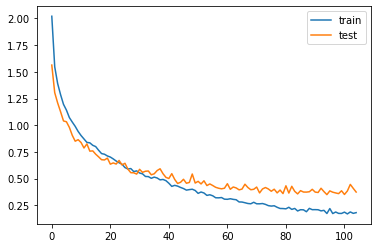

In [121]:
from matplotlib import pyplot 
pyplot.plot(history.history['loss'], label='train') 
pyplot.plot(history.history['val_loss'], label='test') 
pyplot.legend()
pyplot.show()

In [122]:
test_loss, test_accuracy = model.evaluate(X_test,y_test,batch_size=128)
print("Test loss : ",test_loss)
print("\nBest test accuracy : ",test_accuracy*100)

24/24 [==============================] - 0s 2ms/step - loss: 0.3742 - accuracy: 0.8926
Test loss :  0.37424203753471375

Best test accuracy :  89.25592303276062


For the CNN model, we had used the Adam optimizer for training the model. The epoch that was chosen for the training model is 600. All of the hidden layers are using the RELU activation function and the output layer uses the softmax function. The loss is calculated using the sparse_categorical_crossentropy function. Dropout is used to prevent overfitting. We chose the Adam optimizer because it gave us the best results after evaluating other optimizers. The model accuracy can be increased by further increasing the epochs but after a certain period, we may achieve a threshold, so the value should be determined accordingly.

The model accuracy can be increased by further increasing the epochs but after a certain period, we may achieve a threshold, so the value should be determined accordingly. The accuracy we achieved for the test set is 89 percent which is very decent. So we come to the conclusion that Neural Networks are very effective in machine learning models. Tensorflow is very useful in implementing Convolutional Neural Network (CNN) that helps in the classifying process.

Deep Learning Model

In [124]:
# split into train dev and test
X_train, df_test_valid_X, y_train, df_test_valid_y = skms.train_test_split(X, y, train_size=0.7, random_state=seed, stratify=y)
X_dev, X_test, y_dev, y_test = skms.train_test_split(df_test_valid_X, df_test_valid_y, train_size=0.66, random_state=seed, stratify=df_test_valid_y)

In [126]:
import tensorflow as tf
print("TF version:-", tf.__version__)
import keras as k
tf.random.set_seed(seed)

TF version:- 2.8.0


In [127]:
ACCURACY_THRESHOLD = 0.94

class myCallback(k.callbacks.Callback):
    def on_epoch_end(self, epoch, logs={}):
        if(logs.get('val_accuracy') > ACCURACY_THRESHOLD):
            print("\n\nStopping training as we have reached %2.2f%% accuracy!" %(ACCURACY_THRESHOLD*100))   
            self.model.stop_training = True

def trainModel(model, epochs, optimizer):
    batch_size = 128
    callback = myCallback()
    model.compile(optimizer=optimizer,
                  loss='sparse_categorical_crossentropy',
                  metrics='accuracy'
    )
    return model.fit(X_train, y_train, validation_data=(X_dev, y_dev), epochs=epochs, 
                     batch_size=batch_size, callbacks=[callback])

def plotHistory(history):
    print("Max. Validation Accuracy",max(history.history["val_accuracy"]))
    pd.DataFrame(history.history).plot(figsize=(12,6))
    plt.show()

In [128]:
model_1 = k.models.Sequential([
    k.layers.Dense(256, activation='relu', input_shape=(X_train.shape[1],)),
    k.layers.Dense(128, activation='relu'),
    k.layers.Dense(64, activation='relu'),
    k.layers.Dense(10, activation='softmax'),
])
print(model_1.summary())
model_1_history = trainModel(model=model_1, epochs=70, optimizer='adam')

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 256)               15104     
                                                                 
 dense_11 (Dense)            (None, 128)               32896     
                                                                 
 dense_12 (Dense)            (None, 64)                8256      
                                                                 
 dense_13 (Dense)            (None, 10)                650       
                                                                 
Total params: 56,906
Trainable params: 56,906
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/70
55/55 [==============================] - 1s 5ms/step - loss: 1.9643 - accuracy: 0.3315 - val_loss: 1.6139 - val_accuracy: 0.4044
Epoch 2/70
55/55 [===================

Max. Validation Accuracy 0.8094034194946289


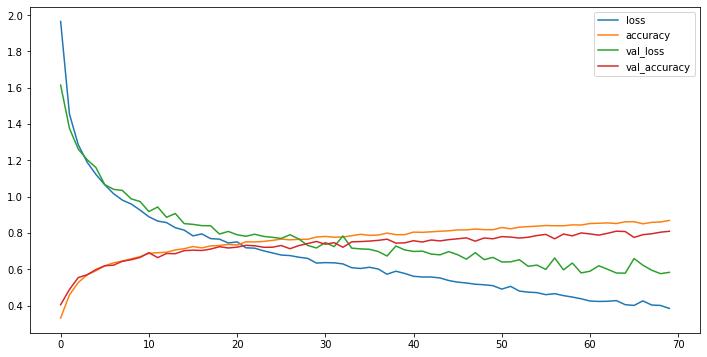

In [129]:
plotHistory(model_1_history)

In [130]:
model_2 = k.models.Sequential([
    k.layers.Dense(512, activation='relu', input_shape=(X_train.shape[1],)),
    k.layers.Dropout(0.2),
    
    k.layers.Dense(256, activation='relu'),
    k.layers.Dropout(0.2),

    k.layers.Dense(128, activation='relu'),
    k.layers.Dropout(0.2),

    k.layers.Dense(64, activation='relu'),
    k.layers.Dropout(0.2),

    k.layers.Dense(10, activation='softmax'),
])
print(model_2.summary())
model_2_history = trainModel(model=model_2, epochs=100, optimizer='adam')

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_14 (Dense)            (None, 512)               30208     
                                                                 
 dropout_8 (Dropout)         (None, 512)               0         
                                                                 
 dense_15 (Dense)            (None, 256)               131328    
                                                                 
 dropout_9 (Dropout)         (None, 256)               0         
                                                                 
 dense_16 (Dense)            (None, 128)               32896     
                                                                 
 dropout_10 (Dropout)        (None, 128)               0         
                                                                 
 dense_17 (Dense)            (None, 64)               

Max. Validation Accuracy 0.8968655467033386


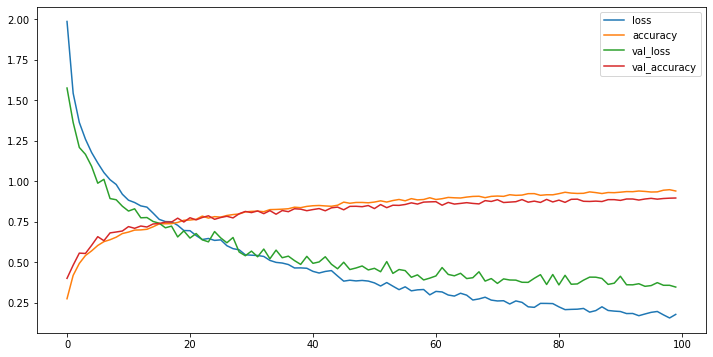

In [131]:
plotHistory(model_2_history)


In [132]:
model_3 = k.models.Sequential([
    k.layers.Dense(512, activation='relu', input_shape=(X_train.shape[1],)),
    k.layers.Dropout(0.2),
    
    k.layers.Dense(256, activation='relu'),
    k.layers.Dropout(0.2),

    k.layers.Dense(128, activation='relu'),
    k.layers.Dropout(0.2),

    k.layers.Dense(64, activation='relu'),
    k.layers.Dropout(0.2),

    k.layers.Dense(10, activation='softmax'),
])
print(model_3.summary())
model_3_history = trainModel(model=model_3, epochs=700, optimizer='sgd')

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_19 (Dense)            (None, 512)               30208     
                                                                 
 dropout_12 (Dropout)        (None, 512)               0         
                                                                 
 dense_20 (Dense)            (None, 256)               131328    
                                                                 
 dropout_13 (Dropout)        (None, 256)               0         
                                                                 
 dense_21 (Dense)            (None, 128)               32896     
                                                                 
 dropout_14 (Dropout)        (None, 128)               0         
                                                                 
 dense_22 (Dense)            (None, 64)               

Max. Validation Accuracy 0.8624873757362366


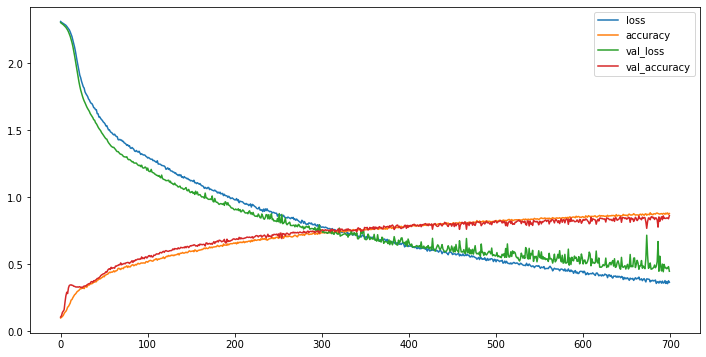

In [133]:
plotHistory(model_3_history)

In [134]:
model_4 = k.models.Sequential([
    k.layers.Dense(1024, activation='relu', input_shape=(X_train.shape[1],)),
    k.layers.Dropout(0.3),
    
    k.layers.Dense(512, activation='relu'),
    k.layers.Dropout(0.3),

    k.layers.Dense(256, activation='relu'),
    k.layers.Dropout(0.3),

    k.layers.Dense(128, activation='relu'),
    k.layers.Dropout(0.3),

    k.layers.Dense(64, activation='relu'),
    k.layers.Dropout(0.3),

    k.layers.Dense(10, activation='softmax'),
])
print(model_4.summary())
model_4_history = trainModel(model=model_4, epochs=500, optimizer='rmsprop')

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_24 (Dense)            (None, 1024)              60416     
                                                                 
 dropout_16 (Dropout)        (None, 1024)              0         
                                                                 
 dense_25 (Dense)            (None, 512)               524800    
                                                                 
 dropout_17 (Dropout)        (None, 512)               0         
                                                                 
 dense_26 (Dense)            (None, 256)               131328    
                                                                 
 dropout_18 (Dropout)        (None, 256)               0         
                                                                 
 dense_27 (Dense)            (None, 128)              

Max. Validation Accuracy 0.9317492246627808


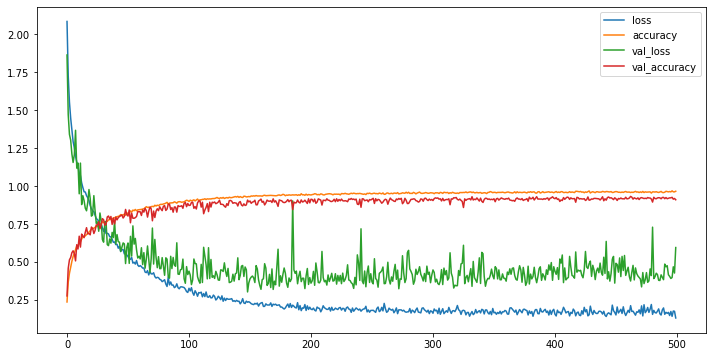

In [135]:
plotHistory(model_4_history)


In [136]:
#Model Evaluation
test_loss, test_acc  = model_4.evaluate(X_test, y_test, batch_size=128)
print("The test Loss is :",test_loss)
print("\nThe Best test Accuracy is :",test_acc*100)

8/8 [==============================] - 0s 3ms/step - loss: 0.5687 - accuracy: 0.9244
The test Loss is : 0.5687476992607117

The Best test Accuracy is : 92.44357347488403


Adding the Recommender System

### Recommender Systems
"Recomender" Systems enable us for any given vector to find the best similarity, ranked in descending order, from the bast match to the least best match.

For Audio files, this will be done through cosine_similarity library.

In [138]:
# Read data
data = pd.read_csv(f'{general_path}/features_30_sec.csv', index_col='filename')

# Extract labels
labels = data[['label']]

# Drop labels from original dataframe
data = data.drop(columns=['length','label'])
data.head()

# Scale the data
data_scaled=preprocessing.scale(data)
print('Scaled data type:', type(data_scaled))

Scaled data type: <class 'numpy.ndarray'>


### Cosine similarity
Calculates the pairwise cosine similarity for each combination of songs in the data. This results in a 1000 x 1000 matrix (with redundancy in the information as item A similarity to item B == item B similarity to item A).

In [139]:
# Cosine similarity
similarity = cosine_similarity(data_scaled)
print("Similarity shape:", similarity.shape)

# Convert into a dataframe and then set the row index and column names as labels
sim_df_labels = pd.DataFrame(similarity)
sim_df_names = sim_df_labels.set_index(labels.index)
sim_df_names.columns = labels.index

sim_df_names.head()

Similarity shape: (1000, 1000)


filename,blues.00000.wav,blues.00001.wav,blues.00002.wav,blues.00003.wav,blues.00004.wav,blues.00005.wav,blues.00006.wav,blues.00007.wav,blues.00008.wav,blues.00009.wav,...,rock.00090.wav,rock.00091.wav,rock.00092.wav,rock.00093.wav,rock.00094.wav,rock.00095.wav,rock.00096.wav,rock.00097.wav,rock.00098.wav,rock.00099.wav
filename,,,,,,,,,,,,,,,,,,,,,
blues.00000.wav,1.000000,0.049231,0.589618,0.284862,0.025561,-0.346688,-0.219483,-0.167626,0.641877,-0.097889,...,-0.082829,0.546169,0.578558,0.662590,0.571629,0.610942,0.640835,0.496294,0.284958,0.304098
blues.00001.wav,0.049231,1.000000,-0.096834,0.520903,0.080749,0.307856,0.318286,0.415258,0.120649,0.404168,...,-0.098111,-0.325126,-0.370792,-0.191698,-0.330834,-0.077301,-0.222119,-0.302573,0.499562,0.311723
blues.00002.wav,0.589618,-0.096834,1.000000,0.210411,0.400266,-0.082019,-0.028061,0.104446,0.468113,-0.132532,...,-0.032408,0.561074,0.590779,0.583293,0.514537,0.495707,0.566837,0.589983,0.216378,0.321069
blues.00003.wav,0.284862,0.520903,0.210411,1.000000,0.126437,0.134796,0.300746,0.324566,0.352758,0.295184,...,-0.320107,-0.206516,-0.151132,0.041986,-0.172515,-0.000287,0.020515,-0.107821,0.502279,0.183210
blues.00004.wav,0.025561,0.080749,0.400266,0.126437,1.000000,0.556066,0.482195,0.623455,0.029703,0.471657,...,0.087605,0.017366,0.138035,0.104684,-0.034594,0.063454,0.063546,0.172944,0.153192,0.061785


### Song similarity scoring
find_similar_songs() - is a predefined function that takes the name of the song and returns top 5 best matches for that song

In [140]:
def find_similar_songs(name):
    # Find songs most similar to another song
    series = sim_df_names[name].sort_values(ascending = False)
    
    # Remove cosine similarity == 1 (songs will always have the best match with themselves)
    series = series.drop(name)
    
    # Display the 5 top matches 
    print("\n*******\nSimilar songs to ", name)
    print(series.head(5))

In [141]:
# pop.00019 - Britney Spears "Hit me baby one more time"
find_similar_songs('pop.00019.wav') 

ipd.Audio(f'{general_path}/genres_original/pop/pop.00019.wav')

#run the below command if the audio player isn't working
#playsound(f'{general_path}/genres_original/pop/pop.00019.wav')


*******
Similar songs to  pop.00019.wav
filename
pop.00023.wav    0.862836
pop.00034.wav    0.860499
pop.00078.wav    0.829135
pop.00088.wav    0.824456
pop.00091.wav    0.802269
Name: pop.00019.wav, dtype: float64


### Similar song match no.1
Britney Spears - I'm so curious (2009 remaster)

In [142]:
ipd.Audio(f'{general_path}/genres_original/pop/pop.00023.wav')


In [143]:
ipd.Audio(f'{general_path}/genres_original/pop/pop.00034.wav')


### METAL Example

In [144]:
# metal.00002 - Iron Maiden "Flight of Icarus"
find_similar_songs('metal.00002.wav') 

ipd.Audio(f'{general_path}/genres_original/metal/metal.00002.wav')

#playsound(f'{general_path}/genres_original/metal/metal.00002.wav')


*******
Similar songs to  metal.00002.wav
filename
metal.00028.wav    0.904367
metal.00059.wav    0.896096
rock.00018.wav     0.891910
rock.00017.wav     0.886526
rock.00016.wav     0.867508
Name: metal.00002.wav, dtype: float64


#### you can just play the above files in the similar fashion